In [20]:
#use wd_models environment

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import numpy as np
import astropy.units as u
import scipy.stats as stats
from scipy import interpolate
import pandas as pd
pd.set_option('display.max_columns', None)
# Suppress SettingWithCopyWarnings
pd.options.mode.chained_assignment = None  # default='warn'
from astropy.coordinates import SkyCoord
import warnings

#for multiprocessing
from joblib import Parallel, delayed

import sys
import os
sys.path.append('../Software')
import WD_models

plt.style.use('stefan.mplstyle')

# This notebook corrects the measured parameters for the effects due to the sharply peaked WD mass/radius/Logg distribution. We then show the overall data set agreement with the theoretical WD Mass-Radius relation and detect the difference in this relation as a function of temperature 

For the photometric and spectroscopic samples

# Import the datasets

In [2]:
#full sample

#not divided by temperature
SDSSV_eos_tab=pd.read_csv('csv/SDSSV_tempdep_sample.csv')
eSDSS_eos_tab=pd.read_csv('csv/eSDSS_tempdep_sample.csv')
Eos_tab=pd.read_csv('csv/tempdep_sample.csv')

#divided by temperature
cool_lim=11000
warm_lim=16000
SDSSV_eos_tab_cool=SDSSV_eos_tab.query('teff_phot<@cool_lim')
eSDSS_eos_tab_cool=eSDSS_eos_tab.query('teff_phot<@cool_lim')
Eos_tab_cool=Eos_tab.query('teff_phot<@cool_lim')
SDSSV_eos_tab_warm=SDSSV_eos_tab.query('teff_phot>@warm_lim')
eSDSS_eos_tab_warm=eSDSS_eos_tab.query('teff_phot>@warm_lim')
Eos_tab_warm=Eos_tab.query('teff_phot>@warm_lim')

In [3]:
#averaged tables

#not divided by temperature
Eos_tab_rad_avg=pd.read_csv('csv/Eos_tab_rad_avg.csv')
Eos_tab_logg_avg=pd.read_csv('csv/Eos_tab_logg_avg.csv')

#divided by temperature
Teff_Eos_tab_rad_avg=pd.read_csv('csv/Teff_Eos_tab_rad_avg.csv')
Teff_Eos_tab_logg_avg=pd.read_csv('csv/Teff_Eos_tab_logg_avg.csv')

In [4]:
#import the bin information
r_npzfile = np.load('csv/radius_bins.npz')
r_bins = r_npzfile['bins'] 
r_bin_centers = r_npzfile['centers']
r_bin_ranges = r_npzfile['ranges']
r_bin_nums=r_npzfile['nums']

g_npzfile = np.load('csv/logg_bins.npz')
g_bins = g_npzfile['bins'] 
g_bin_centers = g_npzfile['centers']
g_bin_ranges = g_npzfile['ranges']
g_bin_nums=g_npzfile['nums']

# Import the La Plata WD Models
- http://evolgroup.fcaglp.unlp.edu.ar/TRACKS/newtables.html
- Varying H-layer thickness according to mass of WD, more massive WDs have thicker H layers than less massive
- DAmassradiusZ0.02.txt gives DA mass/radius in solar units as function of logg/log teff
    - He-core: Althaus et al. 2013, CO-core: Camisassa et al. 2016,    ONe-core: Camisassa et al. 2019

In [5]:
la_plata_mass=pd.read_csv('data/whitedwarfsZ0.02/DAmassradiusZ0.02_readable.txt',delimiter=' ')
la_plata_mass=la_plata_mass.rename(columns={"Unnamed: 1": "logteff"})
la_plata_mass=la_plata_mass.drop(['log(teff)/log(g)'],axis=1)
#reset the indices
indices=np.arange(0,len(la_plata_mass))
la_plata_mass.set_index(indices,inplace=True)

la_plata_radius=pd.read_csv('data/whitedwarfsZ0.02/DAmassradiusZ0.02_readable.txt',delimiter=' ')
la_plata_radius=la_plata_radius.rename(columns={"Unnamed: 1": "logteff"})
la_plata_radius=la_plata_radius.drop(['log(teff)/log(g)'],axis=1)
#reset the indices
indices=np.arange(0,len(la_plata_radius))
la_plata_radius.set_index(indices,inplace=True)

#separate mass and radius info
for col in la_plata_mass.columns.to_list()[1:]:
    masses=[]
    radii=[]
    for i in range(len(la_plata_mass)):
        mass,radius=la_plata_mass[col][i].split(',')
        masses.append(float(mass))
        radii.append(float(radius))
    la_plata_mass[col]=masses
    la_plata_radius[col]=radii

#turn models into interpolation grids

#make grid of mass/radius as function of teff/logg
rows=la_plata_mass['logteff']
teffs = 10**(rows)
columns=la_plata_radius.columns.to_list()[1:]
loggs=[float(i) for i in columns]
mass_teff_logg_grid = np.zeros((len(teffs), len(loggs), 1))
radius_teff_logg_grid = np.zeros((len(teffs), len(loggs), 1))
for i in range(len(teffs)):
    for j in range(len(loggs)):
        logteff=rows[i]
        mass_teff_logg_grid[i,j] = la_plata_mass.query('logteff==@logteff')[columns[j]]
        radius_teff_logg_grid[i,j] = la_plata_radius.query('logteff==@logteff')[columns[j]]
    
#get equal-sized arrays
teffs_long=[]
loggs_long=[]
masses_long=[]
radii_long=[]
for i in range(len(teffs)):
    for j in range(len(loggs)):
        logteff=rows[i]
        teff=teffs[i]
        logg=loggs[j]
        mass= la_plata_mass.query('logteff==@logteff')[columns[j]].to_list()[0]
        radius= la_plata_radius.query('logteff==@logteff')[columns[j]].to_list()[0]
        teffs_long.append(teff)
        loggs_long.append(logg)
        masses_long.append(mass)
        radii_long.append(radius)   
teffs_long=np.asarray(teffs_long)
loggs_long=np.asarray(loggs_long)
masses_long=np.asarray(masses_long)
radii_long=np.asarray(radii_long)

#define the interpolation functions
mass_from_logg_teff=WD_models.interp_xy_z_func(x=loggs_long, y=teffs_long, z=masses_long, interp_type='linear')     
mass_from_radius_teff=WD_models.interp_xy_z_func(x=radii_long, y=teffs_long, z=masses_long, interp_type='linear')  
radius_from_logg_teff=WD_models.interp_xy_z_func(x=loggs_long, y=teffs_long, z=radii_long, interp_type='linear')  
radius_from_mass_teff=WD_models.interp_xy_z_func(x=masses_long, y=teffs_long, z=radii_long, interp_type='linear')  
mass_from_radius_teff=WD_models.interp_xy_z_func(x=radii_long, y=teffs_long, z=masses_long, interp_type='linear')  
logg_from_mass_teff=WD_models.interp_xy_z_func(x=masses_long, y=teffs_long, z=loggs_long, interp_type='linear')     


In [6]:
cCGS=2.99792458*10**10 #cm/s
speed_light = 299792458 #m/s
radius_sun = 6.957e8 #m
mass_sun = 1.9884e30 #kg
newton_G = 6.674e-11 #m^3⋅kg^-1⋅s^-2
pc_to_m = 3.086775e16
MsunCGS=1.989*10**33 #g
RsunCGS=6.955*10**10 #cm
cCGS=2.99792458*10**10 #cm/s
GCGS=6.6743*10**(-8) #cm^3 g^-1 s^-2

def vg_from_m(massarray, teff):
    #given the mass and teff, get the grav redshift
    massarray = np.asarray(massarray)
    teffarray = np.repeat(teff, len(massarray))
    
    #get radius from mass and teff
    rsun = radius_from_mass_teff(massarray,teffarray)
    
    radius = rsun * radius_sun
    mass = massarray * mass_sun
    
    #get grav redshift in SI units
    vg = newton_G * mass / (speed_light * radius)

    return vg*1e-3 #convert to km/s

def vg_from_r(radarray, teffarray):
    #given the radius and teff, get the grav redshift
    
    mass = mass_from_radius_teff(radarray, teffarray) * mass_sun
    radius = radarray * radius_sun
    
    #get grav redshift in SI units
    vg = newton_G * mass / (speed_light * radius)

    return vg*1e-3 #convert to km/s

def vg_from_logg(logg_array, teff_array):
    #this function takes in an array of loggs in CGS units and temperatures in K
    #returns the predicted gravitational redshift in km/s

    #WD mass in CGS units
    mass_wd = mass_from_logg_teff(logg_array, teff_array) * MsunCGS
    
    #gravitational redshift in km/s
    rv = np.sqrt(mass_wd*GCGS*(10**logg_array)/cCGS**2)*10**(-5)

    return rv

# Mass distributions

Vedant used a Cauchy distribution for the WD mass distribution. He didn't have a citation for this, it just fit his mass data well. 

The Kepler 2006 paper (https://academic.oup.com/mnras/article/375/4/1315/1009674) gives 2 different gaussian fits to the WD mass distribution. The table 1 fits are for hot (Teff>12000 K) WDs and the table 2 fits are for lower-temperature (8500<Teff<12000 K) WDs. The fits for the lower temperature WDs result in a significantly higher mean mass and this is attributed to the high logg problem in the Kepler paper (written before 3D atmospheres were implemented). So, only the table 1 fits should be used.

All 3 of these mass-distribution possibilities are plotted below.


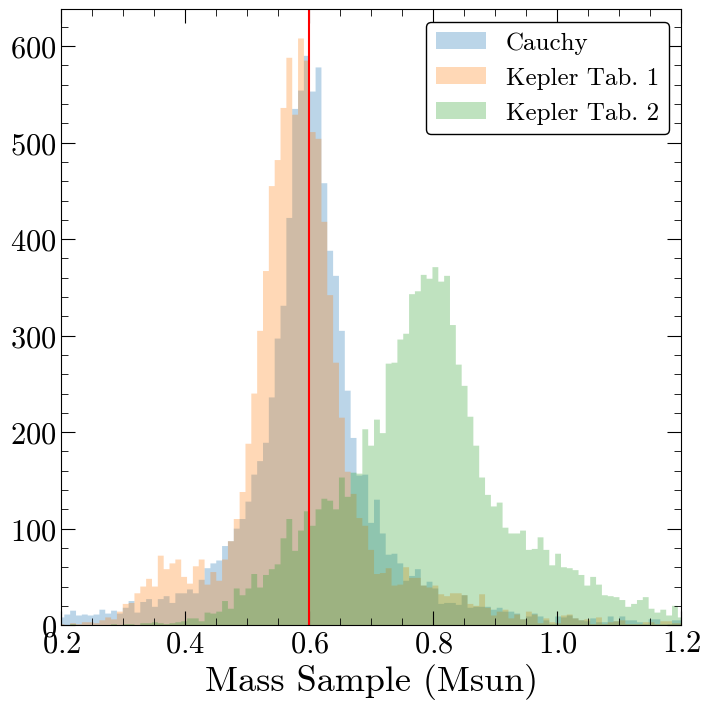

In [7]:
# 10,000 WDs drawn from the Cauchy, Kepler Table 1, Kepler Table 2, and our measured mass distributions
sample_size=10000

#cauchy sample
cauchy_sample = stats.cauchy(loc = 0.6, scale = 0.05).rvs(sample_size)

#Kepler samples
gaus1=np.random.normal(loc = 0.578, scale = 0.047,size=int(0.69*sample_size))
gaus2=np.random.normal(loc = 0.658, scale = 0.149,size=int(0.23*sample_size))
gaus3=np.random.normal(loc = 0.381, scale = 0.050,size=int(0.07*sample_size))
gaus4=np.random.normal(loc = 1.081, scale = 0.143,size=int(0.01*sample_size))
table1_sample=np.concatenate((gaus1,gaus2,gaus3,gaus4))

gaus1=np.random.normal(loc = 0.818, scale = 0.160,size=int(0.49*sample_size))
gaus2=np.random.normal(loc = 0.793, scale = 0.052,size=int(0.33*sample_size))
gaus3=np.random.normal(loc = 0.640, scale = 0.086,size=int(0.16*sample_size))
gaus4=np.random.normal(loc = 1.096, scale = 0.136,size=int(0.02*sample_size))
table2_sample=np.concatenate((gaus1,gaus2,gaus3,gaus4))

#plot the samples
fig, ax1 = plt.subplots(1, 1,figsize=(8,8))
(n, bins, patches) = ax1.hist(cauchy_sample, bins='auto', histtype='stepfilled',alpha=0.3,label='Cauchy')
ax1.hist(table1_sample, bins=bins, histtype='stepfilled',alpha=0.3,label='Kepler Tab. 1')
ax1.hist(table2_sample, bins=bins, histtype='stepfilled',alpha=0.3,label='Kepler Tab. 2')
ax1.axvline(x = 0.6, color = 'r')
ax1.set_xlabel('Mass Sample (Msun)')
ax1.set_xlim(0.2,1.2)
ax1.legend()
plt.show()

# Correct for the sharp peak in the radius/logg distribution of WDs
Add noise to the distribution of photometric radii using a gaussian with a sigma equal to the median radius uncertainty

Add noise to the distribution of spectroscopic loggs using a gaussian with a sigma equal to the median logg uncertainty

In [8]:
def get_truth_sample(table, sample_size, mass_dist, plot=False):
    #this function draws a mass sample from one of the above distributions
    #and a teff sample from our measured data
    #using the La Plata models, the radii, loggs, and grav redshifts of these samples are computed
    
    if mass_dist=='Cauchy':
        #sample masses from a Cauchy distribution centered at 0.6 Msun
        #Vedant found that this matched the WD mass distribution well but couldn't give a citation
        mass_sample = stats.cauchy(loc = 0.6, scale = 0.05).rvs(sample_size)
    if mass_dist=='Kepler':
        #the Keplemr Table 1 mass distribution
        gaus1=np.random.normal(loc = 0.578, scale = 0.047,size=int(0.69*sample_size))
        gaus2=np.random.normal(loc = 0.658, scale = 0.149,size=int(0.23*sample_size))
        gaus3=np.random.normal(loc = 0.381, scale = 0.050,size=int(0.07*sample_size))
        gaus4=np.random.normal(loc = 1.081, scale = 0.143,size=int(0.01*sample_size))
        mass_sample=np.concatenate((gaus1,gaus2,gaus3,gaus4))
        
    #exclude any WDs more massive than 1.2 Msun or less massive than 0.2 Msun
    out = (mass_sample > 1.2) + (mass_sample < 0.2)
    mass_sample = mass_sample[~out]
    
    #draw a random sample of temperatures from those measured in the table
    all_measured_teffs=table['teff_phot'] #since we are using photometry, drop duplicate teffs
    teff_sample = np.random.choice(all_measured_teffs, size = len(mass_sample), replace = True)
    
    #for given mass and teff samples, get the radii sample
    radius_sample = radius_from_mass_teff(mass_sample, teff_sample)
    #mask any nan samples or WDs with radii>0.029 (these are ELMs)
    out = np.isnan(radius_sample) + (radius_sample > 0.029)
    mass_sample = mass_sample[~out]
    radius_sample = radius_sample[~out]
    teff_sample = teff_sample[~out]
    
    #for given mass and teff samples, get the logg sample
    logg_sample = logg_from_mass_teff(mass_sample, teff_sample)
    #mask any nan samples or WDs with logg<7 (these are ELMs)
    out = np.isnan(logg_sample) + (logg_sample < 7)
    mass_sample = mass_sample[~out]
    radius_sample = radius_sample[~out]
    teff_sample = teff_sample[~out]
    logg_sample = logg_sample[~out]
    
    #get gravitational redshifts of sample
    vg_sample = vg_from_r(radius_sample, teff_sample)
    
    if plot==True:
        #plot the samples
        fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(1, 5,figsize=(25,5))
        ax1.hist(mass_sample, density=True, bins='auto', histtype='stepfilled')
        ax1.axvline(x = 0.6, color = 'r')
        ax1.set_xlim([0,1.3])
        ax1.set_xlabel('Mass Sample (Msun)')
        
        ax2.hist(teff_sample, density=True, bins='auto', histtype='stepfilled')
        ax2.set_xlabel('Teff Sample (K)')
        
        ax3.hist(radius_sample, density=True, bins='auto', histtype='stepfilled')
        ax3.set_xlabel('Radius Sample\n(Rsun)')
        
        ax4.hist(logg_sample, density=True, bins='auto', histtype='stepfilled')
        ax4.set_xlabel('Logg Sample\n(dex)')
        
        ax5.hist(vg_sample, density=True, bins='auto', histtype='stepfilled')
        ax5.set_xlabel('Grav Redshift\nSample (km/s)')
        plt.show()
        
    return(mass_sample,teff_sample,radius_sample,logg_sample,vg_sample)

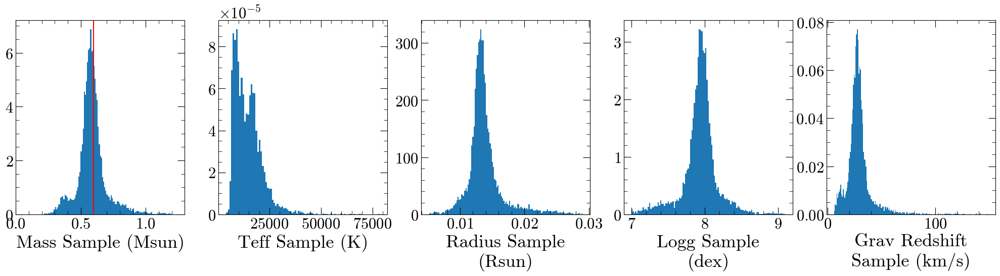

In [9]:
mass_sample,teff_sample,radius_sample,logg_sample,vg_sample=get_truth_sample(Eos_tab,len(Eos_tab), mass_dist='Kepler',plot=True)

In [10]:
def compare_to_noisy(mass_sample,teff_sample,radius_sample,logg_sample,vg_sample,
                         r_bins, g_bins,table,nsigma_noise,plot=False):
    #this function draws a noisy radius and logg sample, computed with noise=median error from our measured data
    #then the mean gravitational redshifts are re-calculated and compared to the true distribution
        
    #make a sample of noisy radius measurements where the noise is a gaussian centered at 0 multiplied by the
    #radius noise parameter, which is set by the median error from the measured radii
    radius_noise_med=np.nanmedian(table['e_radius_phot_full'])
    radius_noise_std=np.std(table['e_radius_phot_full'])
    radius_noise=radius_noise_med+nsigma_noise*radius_noise_std
    n_bin_r = len(r_bins) - 1
    noisy_radius_sample = radius_sample + radius_noise * np.random.normal(size = len(radius_sample))
    
    #repeat for logg measurements
    logg_noise_med=np.nanmedian(table['e_logg_prf_coadd_full'])
    logg_noise_std=np.std(table['e_logg_prf_coadd_full'])
    logg_noise=logg_noise_med+nsigma_noise*logg_noise_std
    n_bin_g = len(g_bins) - 1
    noisy_logg_sample = logg_sample + logg_noise * np.random.normal(size = len(logg_sample))
    
    #bin in true radius and compute the mean grav reshift and radius for each bin
    vg_bins=stats.binned_statistic(radius_sample, vg_sample,statistic = 'mean',bins = r_bins)
    mean_vg_r=vg_bins.statistic
    radius_bins=stats.binned_statistic(radius_sample, radius_sample,statistic = 'mean',bins = r_bins)
    mean_radius=radius_bins.statistic
    
    #bin in true logg and compute the mean grav reshift and logg for each bin
    vg_bins=stats.binned_statistic(logg_sample, vg_sample,statistic = 'mean',bins = g_bins)
    mean_vg_g=vg_bins.statistic
    logg_bins=stats.binned_statistic(logg_sample, logg_sample,statistic = 'mean',bins = g_bins)
    mean_logg=logg_bins.statistic
    
    #bin in noisy radius and compute the mean grav reshift and radius for each bin
    noisy_vg_bins=stats.binned_statistic(noisy_radius_sample, vg_sample,statistic = 'mean',bins = r_bins)
    noisy_mean_vg_r=noisy_vg_bins.statistic
    noisy_radius_bins=stats.binned_statistic(noisy_radius_sample, noisy_radius_sample,statistic = 'mean',bins = r_bins)
    noisy_mean_radius=noisy_radius_bins.statistic
    
    #bin in noisy radius and compute the mean grav reshift and radius for each bin
    noisy_vg_bins=stats.binned_statistic(noisy_logg_sample, vg_sample,statistic = 'mean',bins = g_bins)
    noisy_mean_vg_g=noisy_vg_bins.statistic
    noisy_logg_bins=stats.binned_statistic(noisy_logg_sample, noisy_logg_sample,statistic = 'mean',bins = g_bins)
    noisy_mean_logg=noisy_logg_bins.statistic
    
    if plot==True:
        fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2, 2,figsize=(16,16))
        #plot the samples
        (n, bins, patches)=ax1.hist(radius_sample, bins='auto', histtype='stepfilled',alpha=0.3,label='True')
        ax1.hist(noisy_radius_sample, bins=bins, histtype='stepfilled',alpha=0.3,label='Noisy')
        #ax1.axvline(0.0135,0,500,color='r')
        ax1.set_xlabel('Radius Samples (Rsun)',fontsize=30)
        ax1.set_ylabel('Counts',fontsize=30)
        ax1.legend(fontsize=26)
        
        (n, bins, patches)=ax2.hist(logg_sample, bins='auto', histtype='stepfilled',alpha=0.3,label='True')
        ax2.hist(noisy_logg_sample, bins=bins, histtype='stepfilled',alpha=0.3,label='Noisy')
        #ax2.axvline(7.95,0,500,color='r')
        ax2.set_xlabel('Logg Samples (dex)',fontsize=30)
        ax2.set_ylabel('Counts',fontsize=30)
        ax2.legend(fontsize=26)
        
        #plot the bias
        ax3.errorbar(mean_radius, mean_vg_r, linestyle = '-', marker = 's',\
                         ecolor = 'c', capsize = 3, color = 'k', label = '$\mathrm{\sigma (R)}$ = 0')
        ax3.errorbar(noisy_mean_radius, noisy_mean_vg_r, linestyle = '-', marker = 's',\
                        ecolor = 'c', capsize = 3, color = 'r', label = '$\mathrm{\sigma (R)}$ = %.4f $\mathrm{R_{\odot}}$'%radius_noise)
        #ax3.axvline(0.0135,0,120,color='r')
        ax3.set_xlabel('Radius ($\mathrm{R_{\odot}}$)',fontsize=30)
        ax3.set_ylabel('Gravitational Redshift ($\mathrm{km\ s^{-1}}$)',fontsize=30)
        ax3.legend(fontsize=24)
        
        ax4.errorbar(mean_logg, mean_vg_g, linestyle = '-', marker = 's',\
                         ecolor = 'c', capsize = 3, color = 'k', label = '$\mathrm{\sigma (Logg)}$ = 0')
        ax4.errorbar(noisy_mean_logg, noisy_mean_vg_g, linestyle = '-', marker = 's',\
                        ecolor = 'c', capsize = 3, color = 'r', label = '$\mathrm{\sigma (Logg)}$ = %.2f dex'%logg_noise)
        #ax4.axvline(7.95,0,120,color='r')
        ax4.set_xlabel('Logg (dex)',fontsize=30)
        ax4.set_ylabel('Gravitational Redshift ($\mathrm{km\ s^{-1}}$)',fontsize=30)
        ax4.legend(fontsize=24)
        
        #plt.savefig('bias.pdf', dpi=300)#, pad_inches=0.3)
        
        plt.show()
        
    return(mean_vg_r,mean_radius,noisy_mean_vg_r,noisy_mean_radius,radius_noise,
           mean_vg_g,mean_logg,noisy_mean_vg_g,noisy_mean_logg,logg_noise)


In [11]:
#get standard deviations of errors
print(np.std(Eos_tab['e_radius_phot_full']))
print(np.std(Eos_tab['e_logg_prf_coadd_full']))

0.001133948710847221
0.03761637353812713


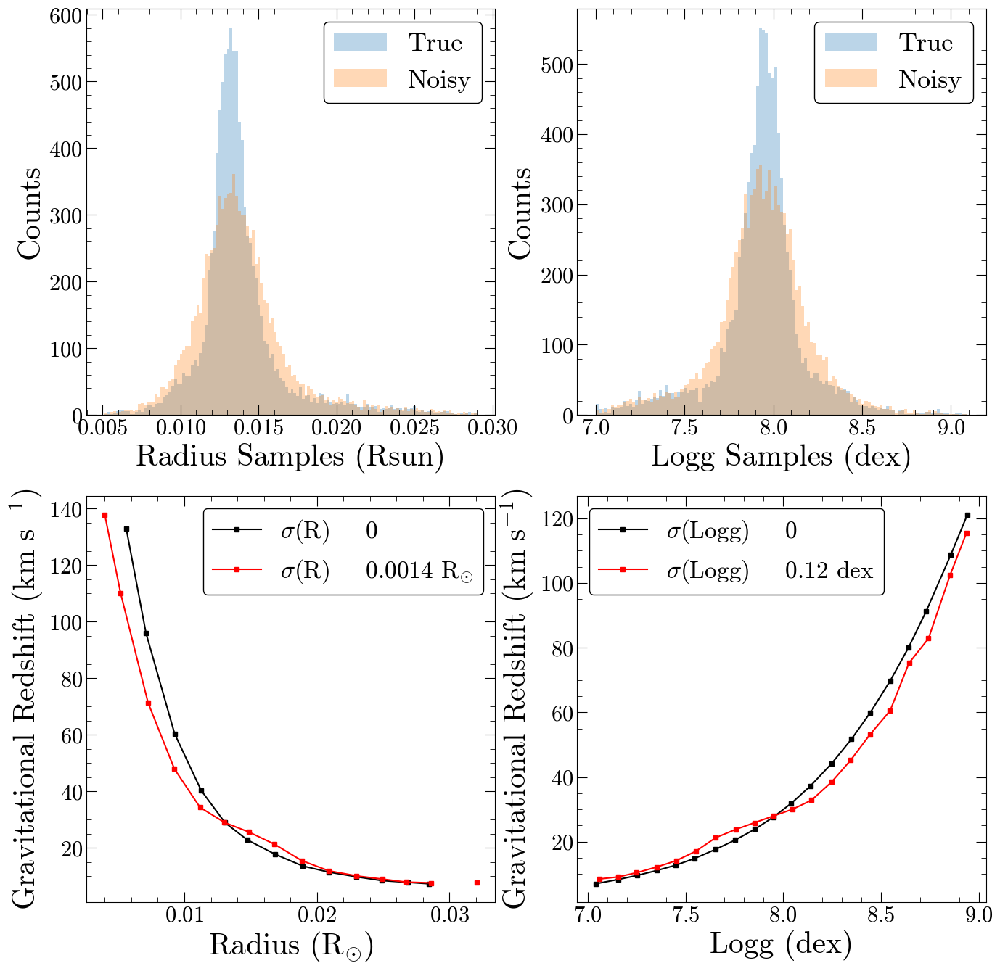

In [12]:
#plot for paper
#note this isn't for many iterations so the plot will look a little different each time you run this
nsigma_noise=0
biasfig=compare_to_noisy(mass_sample,teff_sample,radius_sample,logg_sample,vg_sample,r_bins,g_bins,Eos_tab,nsigma_noise,plot=True)


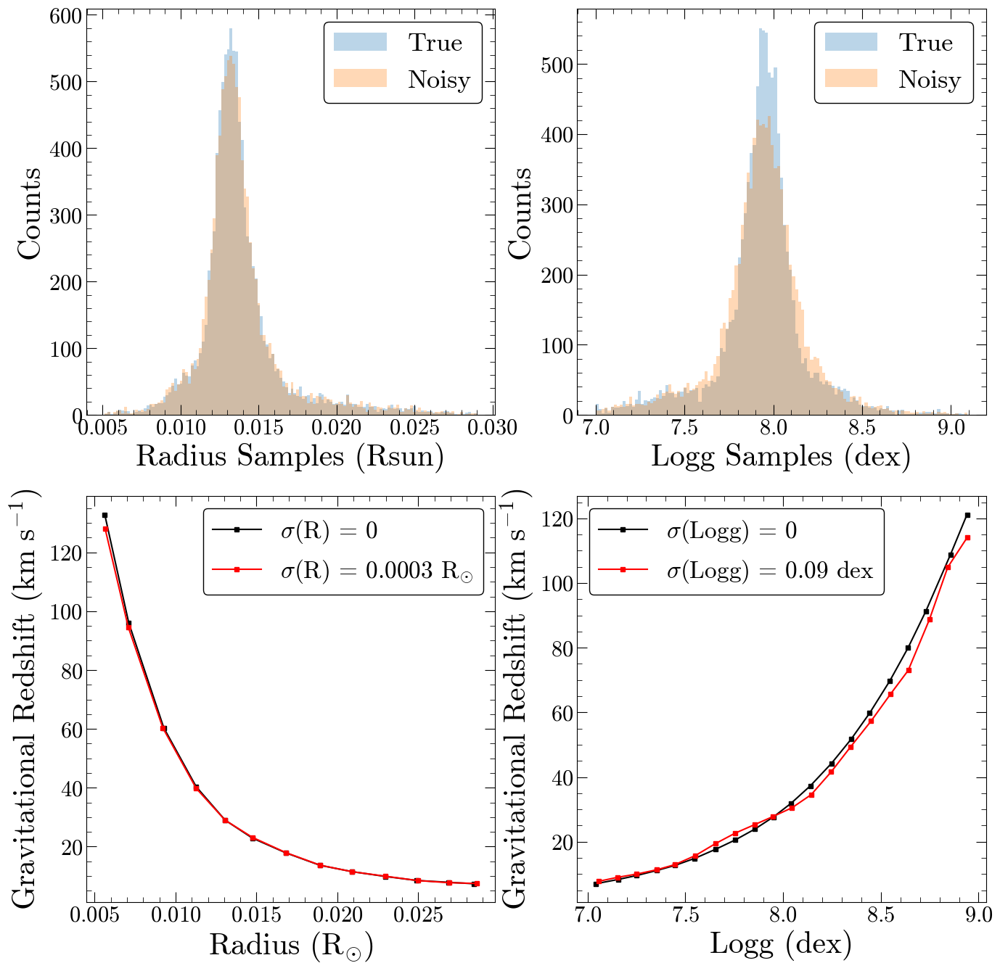

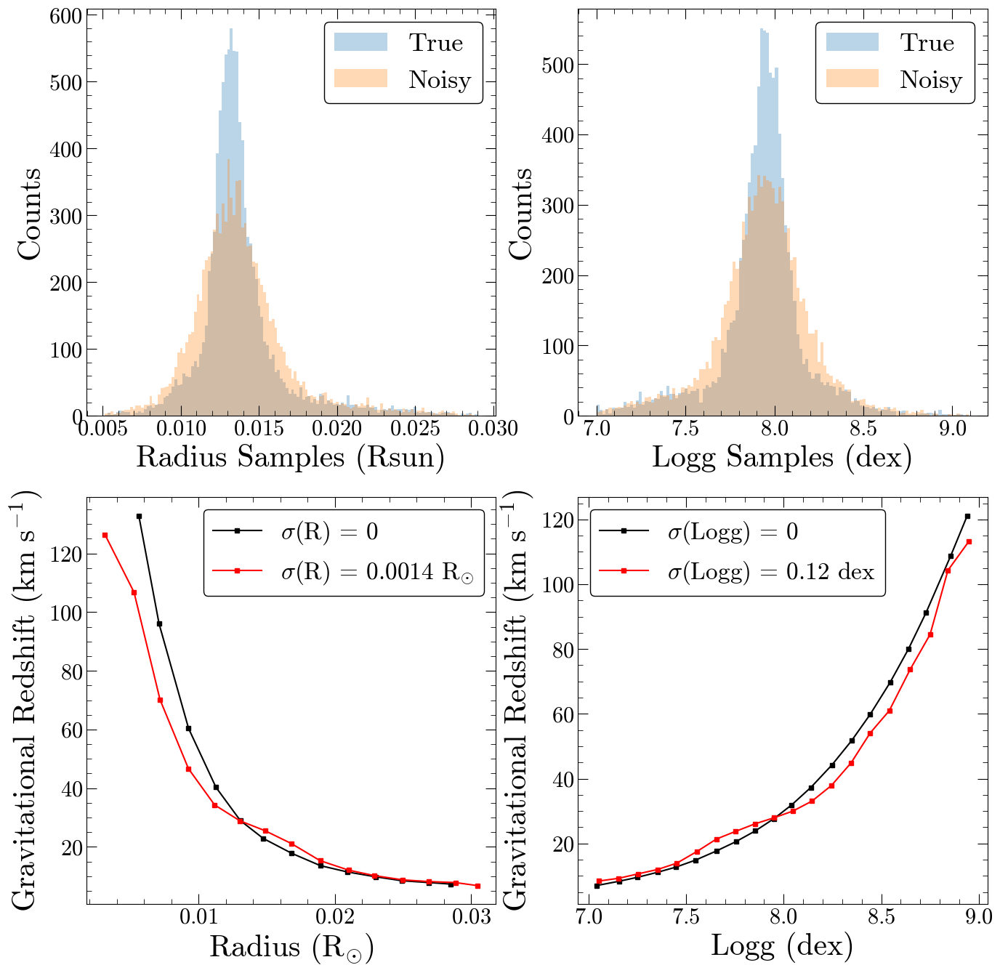

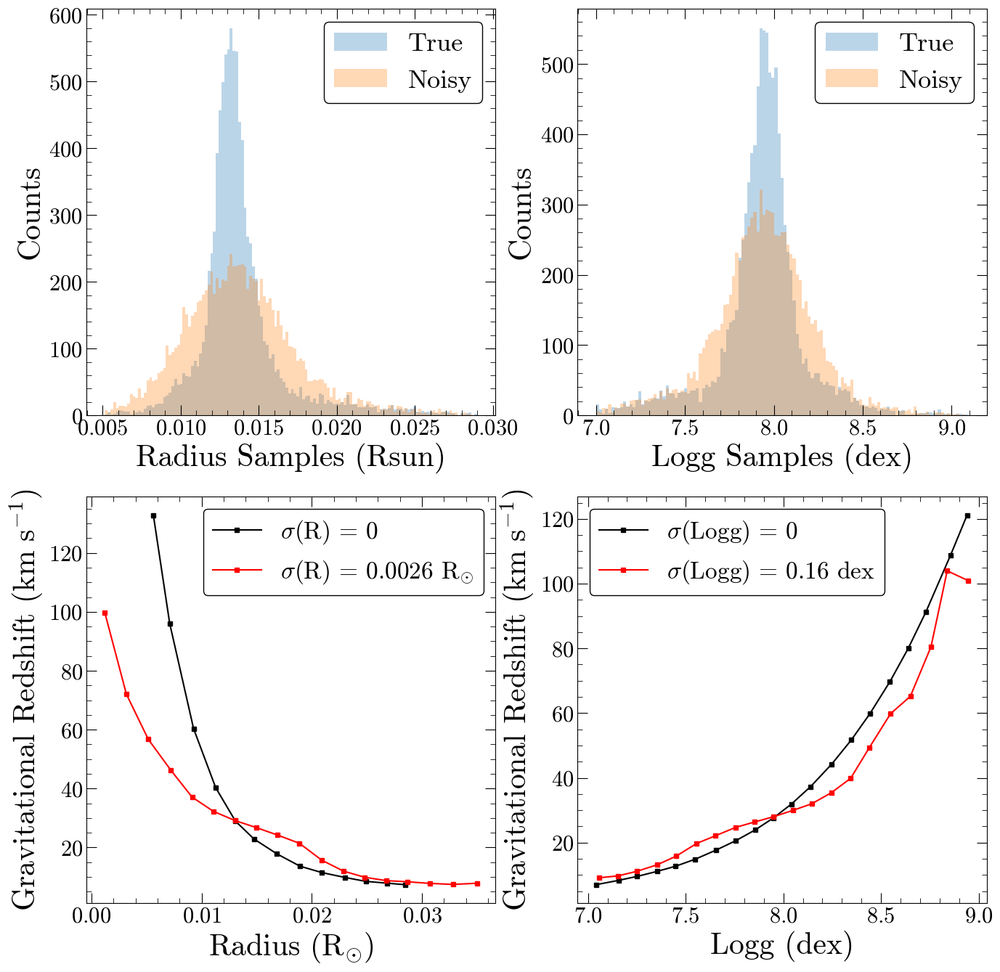

In [13]:
nsigma_noise=-1
example=compare_to_noisy(mass_sample,teff_sample,radius_sample,logg_sample,vg_sample,r_bins,g_bins,Eos_tab,nsigma_noise,plot=True)

nsigma_noise=0
example=compare_to_noisy(mass_sample,teff_sample,radius_sample,logg_sample,vg_sample,r_bins,g_bins,Eos_tab,nsigma_noise,plot=True)

nsigma_noise=1
example=compare_to_noisy(mass_sample,teff_sample,radius_sample,logg_sample,vg_sample,r_bins,g_bins,Eos_tab,nsigma_noise,plot=True)


In [14]:
def noise_mc(mass_sample,teff_sample,radius_sample,logg_sample,vg_sample,
                         r_bins,g_bins,table,nsigma_noise,n_noise_samples=100, plot=True):
    #this function draws n_noise_samples noisy radius/logg samples and compares how the noise affects the vg binning
    
    mean_vgs_r = []
    mean_radii = []
    noisy_mean_vgs_r = []
    noisy_mean_radii = []
    mean_vgs_g = []
    mean_loggs = []
    noisy_mean_vgs_g = []
    noisy_mean_loggs = []
    
    for kk in range(n_noise_samples):
        mean_vg_r,mean_radius,noisy_mean_vg_r,noisy_mean_radius,radius_noise,mean_vg_g,mean_logg,noisy_mean_vg_g,noisy_mean_logg,logg_noise=compare_to_noisy(mass_sample,teff_sample,
                                                                                                                                                             radius_sample,logg_sample,vg_sample,r_bins,g_bins,
                                                                                                                                                             table,nsigma_noise,plot=False)
        #record the results
        mean_vgs_r.append(mean_vg_r)
        mean_radii.append(mean_radius)
        noisy_mean_vgs_r.append(noisy_mean_vg_r)
        noisy_mean_radii.append(noisy_mean_radius)
        mean_vgs_g.append(mean_vg_g)
        mean_loggs.append(mean_logg)
        noisy_mean_vgs_g.append(noisy_mean_vg_g)
        noisy_mean_loggs.append(noisy_mean_logg)

    #average over all the different noise samples
    full_mean_vg_r = np.nanmean(np.asarray(mean_vgs_r),0)
    full_mean_radius = np.nanmean(np.asarray(mean_radii),0)
    full_noisy_mean_vg_r = np.nanmean(np.asarray(noisy_mean_vgs_r),0)
    full_noisy_mean_radius = np.nanmean(np.asarray(noisy_mean_radii),0)
    full_mean_vg_g = np.nanmean(np.asarray(mean_vgs_g),0)
    full_mean_logg = np.nanmean(np.asarray(mean_loggs),0)
    full_noisy_mean_vg_g = np.nanmean(np.asarray(noisy_mean_vgs_g),0)
    full_noisy_mean_logg = np.nanmean(np.asarray(noisy_mean_loggs),0)
    
    #the binning effect introduces bias in BOTH the measured gravitational redshift and the mean radius/logg of each bin
    #given a data set with noise have to do noisy_data+bias_correction=noisy_data+no_noise-noise=no_noise
    radius_bias=full_mean_radius-full_noisy_mean_radius
    vg_bias_r=full_mean_vg_r-full_noisy_mean_vg_r
    logg_bias=full_mean_logg-full_noisy_mean_logg
    vg_bias_g=full_mean_vg_g-full_noisy_mean_vg_g
    
    if plot==True:
        f, (ax0,ax2,ax3,ax1) = plt.subplots(4, 1, gridspec_kw={'height_ratios': [1,1,1,2]}, figsize = (9,15),sharex=True)

        #plot a histogram of the radius sample
        ax0.hist(radius_sample, bins = 35, histtype = 'step', label = 'Data', color = 'k', linewidth = 1,
                density = True);
        ax0.set_ylabel('Density')
        ax0.xaxis.set_tick_params(labelsize=20)
        ax0.yaxis.set_tick_params(labelsize=20)
        ax0.tick_params(which='major', length=10, width=1, direction='in', top = True, right = True)
        ax0.tick_params(which='minor', length=5, width=1, direction='in', top = True, right = True)
        locs = ax0.get_yticks()
        ax0.set_yticks(locs[1:])
        locs = ax0.get_xticks()
        ax0.set_xticks(locs[::1])
        #ax0.set_xlim(0.005, 0.025)
        
        #plot the bias between the noisy and true relations
        ax2.plot(full_mean_radius,radius_bias,color = 'k')
        #ax2.set_xlabel('Radius ($\mathrm{R_{\odot}}$)')
        ax2.set_ylabel('Mean Radius Bias\nCorrection($\mathrm{R_{\odot}}$)')
        ax2.xaxis.set_tick_params(labelsize=20)
        ax2.yaxis.set_tick_params(labelsize=20)
        ax2.minorticks_on()
        ax2.tick_params(which='major', length=10, width=1, direction='in', top = True, right = True)
        ax2.tick_params(which='minor', length=5, width=1, direction='in', top = True, right = True)
        locs = ax2.get_xticks()
        ax2.set_xticks(locs[::1])
        #ax2.set_xlim(0.0, 0.04)
        
        #plot the bias between the noisy and true relations
        ax3.plot(full_mean_radius,vg_bias_r,color = 'k')
        #ax3.set_xlabel('Radius ($\mathrm{R_{\odot}}$)')
        ax3.set_ylabel('Grav Redshift Bias\nCorrection($\mathrm{km\ s^{-1}}$)')
        ax3.xaxis.set_tick_params(labelsize=20)
        ax3.yaxis.set_tick_params(labelsize=20)
        ax3.minorticks_on()
        ax3.tick_params(which='major', length=10, width=1, direction='in', top = True, right = True)
        ax3.tick_params(which='minor', length=5, width=1, direction='in', top = True, right = True)
        locs = ax3.get_xticks()
        ax3.set_xticks(locs[::1])
        #ax3.set_xlim(0.0, 0.04)
        
        #plot the true and noisy vg-r relations
        ax1.plot(full_mean_radius, full_mean_vg_r,marker = 's', color = 'k',label = '$\mathrm{\sigma (R)}$ = 0')
        ax1.plot(full_noisy_mean_radius, full_noisy_mean_vg_r,marker = 's',color = 'r',label = '$\mathrm{\sigma (R)}$ = %.3f $\mathrm{R_{\odot}}$'%radius_noise)
        teff = np.median(table.drop_duplicates(subset='gaia_dr3_source_id')['teff_phot'])
        rsuns = np.linspace(0,0.055, 1000)
        theory = vg_from_r(rsuns, teff)
        ax1.plot(rsuns, theory, color = 'b', linestyle = '--', label = 'Theory for T='+str(np.round(teff,1))+' K')
        ax1.set_xlabel('Radius ($\mathrm{R_{\odot}}$)')
        ax1.set_ylabel('Gravitational Redshift\n($\mathrm{km\ s^{-1}}$)')
        ax1.xaxis.set_tick_params(labelsize=20)
        ax1.yaxis.set_tick_params(labelsize=20)
        ax1.minorticks_on()
        ax1.tick_params(which='major', length=10, width=1, direction='in', top = True, right = True)
        ax1.tick_params(which='minor', length=5, width=1, direction='in', top = True, right = True)
        #locs = ax1.get_xticks()
        #ax1.set_xticks(locs[::1])
        ax1.set_xlim(0.0, 0.035)
        ax1.legend()
        
        plt.tight_layout()
        #plt.savefig('noisy_radius.png', bbox_inches = 'tight')
        plt.show()
        
        f, (ax0,ax2,ax3,ax1) = plt.subplots(4, 1, gridspec_kw={'height_ratios': [1,1,1,2]}, figsize = (9,15),sharex=True)

        #plot a histogram of the logg sample
        ax0.hist(logg_sample, bins = 35, histtype = 'step', label = 'Data', color = 'k', linewidth = 1,
                density = True);
        ax0.set_ylabel('Density')
        ax0.xaxis.set_tick_params(labelsize=20)
        ax0.yaxis.set_tick_params(labelsize=20)
        ax0.tick_params(which='major', length=10, width=1, direction='in', top = True, right = True)
        ax0.tick_params(which='minor', length=5, width=1, direction='in', top = True, right = True)
        locs = ax0.get_yticks()
        ax0.set_yticks(locs[1:])
        locs = ax0.get_xticks()
        ax0.set_xticks(locs[::1])
        #ax0.set_xlim(0.005, 0.025)
        
        #plot the bias between the noisy and true relations
        ax2.plot(full_mean_logg,logg_bias,color = 'k')
        ax2.set_ylabel('Mean Logg Bias\nCorrection (dex)')
        ax2.xaxis.set_tick_params(labelsize=20)
        ax2.yaxis.set_tick_params(labelsize=20)
        ax2.minorticks_on()
        ax2.tick_params(which='major', length=10, width=1, direction='in', top = True, right = True)
        ax2.tick_params(which='minor', length=5, width=1, direction='in', top = True, right = True)
        locs = ax2.get_xticks()
        ax2.set_xticks(locs[::1])
        #ax2.set_xlim(0.0, 0.04)
        
        #plot the bias between the noisy and true relations
        ax3.plot(full_mean_logg,vg_bias_g,color = 'k')
        ax3.set_ylabel('Grav Redshift Bias\nCorrection($\mathrm{km\ s^{-1}}$)')
        ax3.xaxis.set_tick_params(labelsize=20)
        ax3.yaxis.set_tick_params(labelsize=20)
        ax3.minorticks_on()
        ax3.tick_params(which='major', length=10, width=1, direction='in', top = True, right = True)
        ax3.tick_params(which='minor', length=5, width=1, direction='in', top = True, right = True)
        locs = ax3.get_xticks()
        ax3.set_xticks(locs[::1])
        #ax3.set_xlim(0.0, 0.04)
        
        #plot the true and noisy vg-logg relations
        ax1.plot(full_mean_logg, full_mean_vg_g, marker = 's', color = 'k',label = '$\mathrm{\sigma (Logg)}$ = 0')
        ax1.plot(full_noisy_mean_logg, full_noisy_mean_vg_g, marker = 's',color = 'r',label = '$\mathrm{\sigma (Logg)}$ = %.3f dex'%logg_noise)
        teff = np.median(table['teff_phot'])
        loggs = np.linspace(7,9, 1000)
        theory = vg_from_logg(loggs, teff)
        ax1.plot(loggs, theory, color = 'b', linestyle = '--', label = 'Theory for T='+str(np.round(teff,1))+' K')
        ax1.set_xlabel('Logg (dex)')
        ax1.set_ylabel('Gravitational Redshift\n($\mathrm{km\ s^{-1}}$)')
        ax1.xaxis.set_tick_params(labelsize=20)
        ax1.yaxis.set_tick_params(labelsize=20)
        ax1.minorticks_on()
        ax1.tick_params(which='major', length=10, width=1, direction='in', top = True, right = True)
        ax1.tick_params(which='minor', length=5, width=1, direction='in', top = True, right = True)
        locs = ax1.get_xticks()
        ax1.set_xticks(locs[::1])
        ax1.set_xlim(7.0, 9.0)
        ax1.legend()
        
        plt.tight_layout()
        
        #plt.savefig('fig/noisy_logg.pdf', bbox_inches = 'tight')
        
    return radius_bias,vg_bias_r,logg_bias,vg_bias_g


/var/folders/ny/bjybyvhj6s9_2ms5cmld1xbc0000gn/T/ipykernel_73422/2204304629.py:28: RuntimeWarning: Mean of empty slice
  full_mean_vg_r = np.nanmean(np.asarray(mean_vgs_r),0)
/var/folders/ny/bjybyvhj6s9_2ms5cmld1xbc0000gn/T/ipykernel_73422/2204304629.py:29: RuntimeWarning: Mean of empty slice
  full_mean_radius = np.nanmean(np.asarray(mean_radii),0)
/var/folders/ny/bjybyvhj6s9_2ms5cmld1xbc0000gn/T/ipykernel_73422/2204304629.py:30: RuntimeWarning: Mean of empty slice
  full_noisy_mean_vg_r = np.nanmean(np.asarray(noisy_mean_vgs_r),0)
/var/folders/ny/bjybyvhj6s9_2ms5cmld1xbc0000gn/T/ipykernel_73422/2204304629.py:31: RuntimeWarning: Mean of empty slice
  full_noisy_mean_radius = np.nanmean(np.asarray(noisy_mean_radii),0)


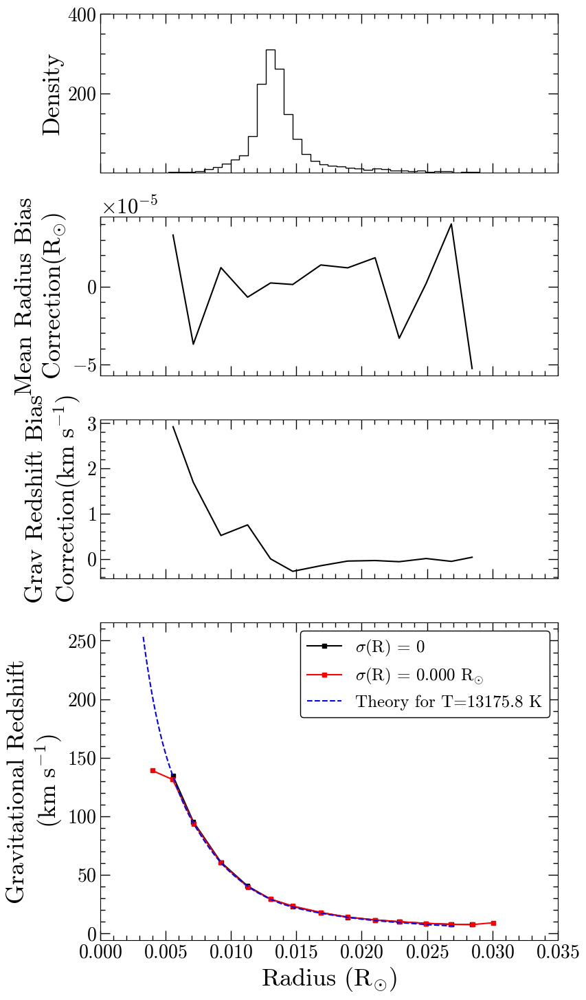

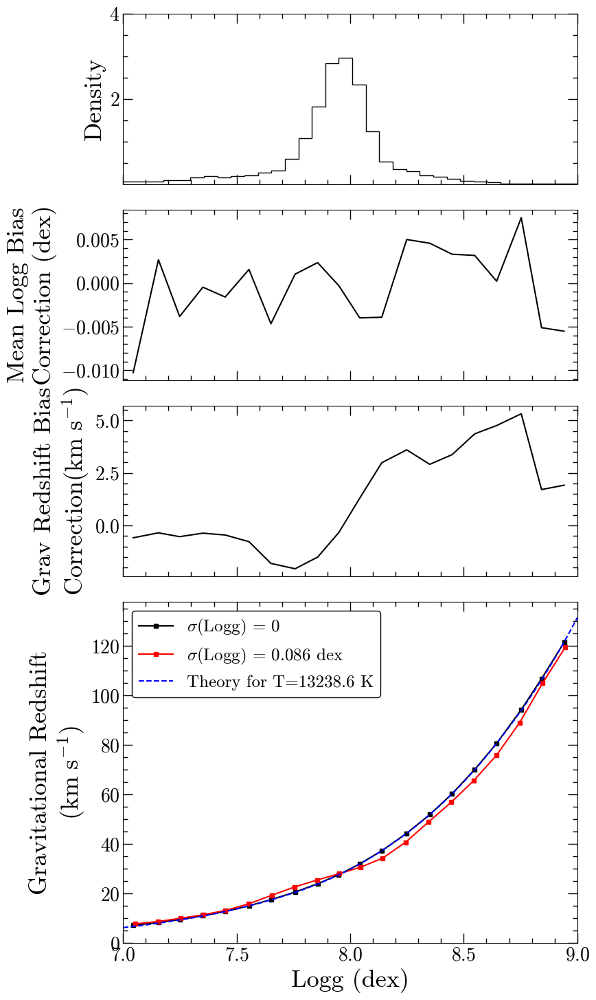

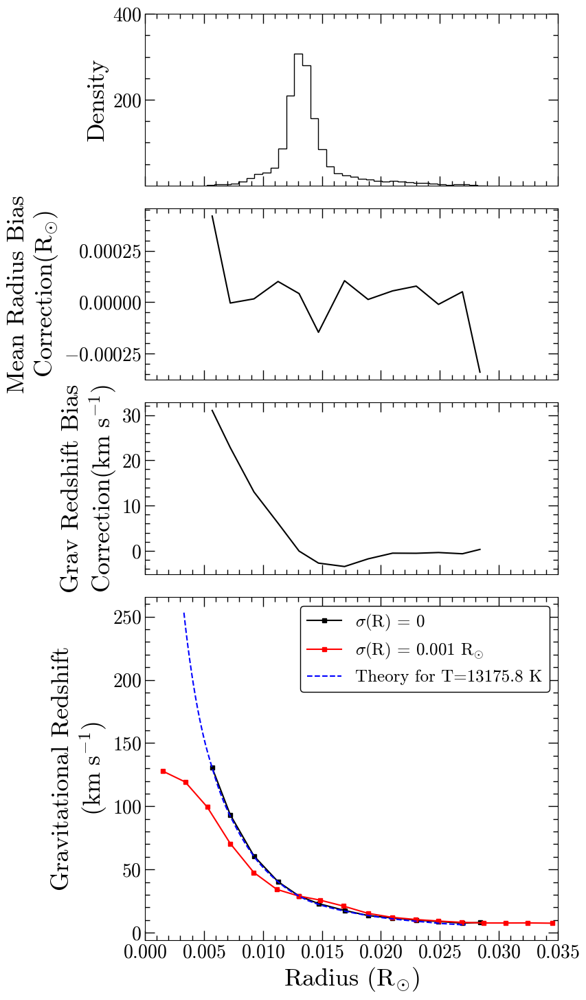

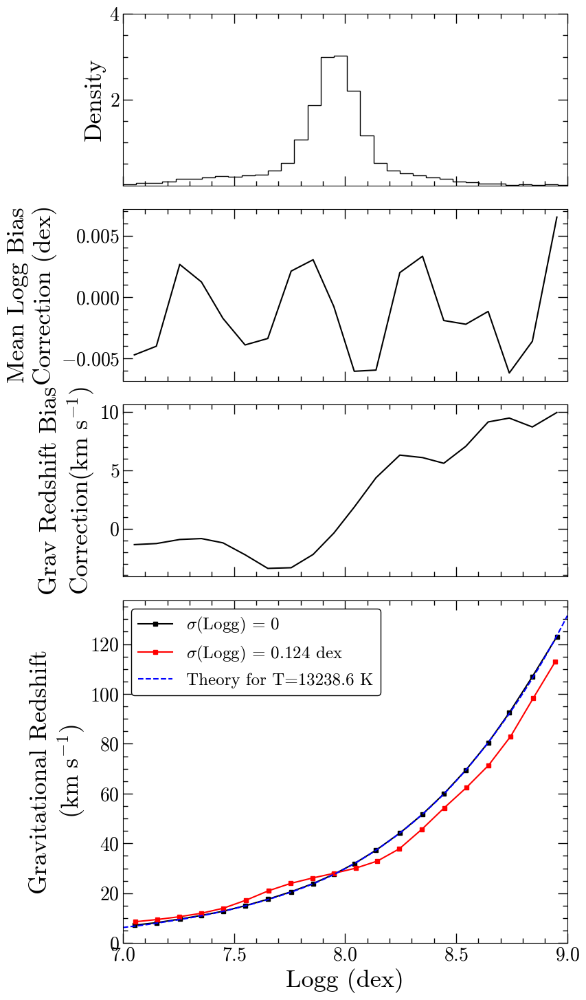

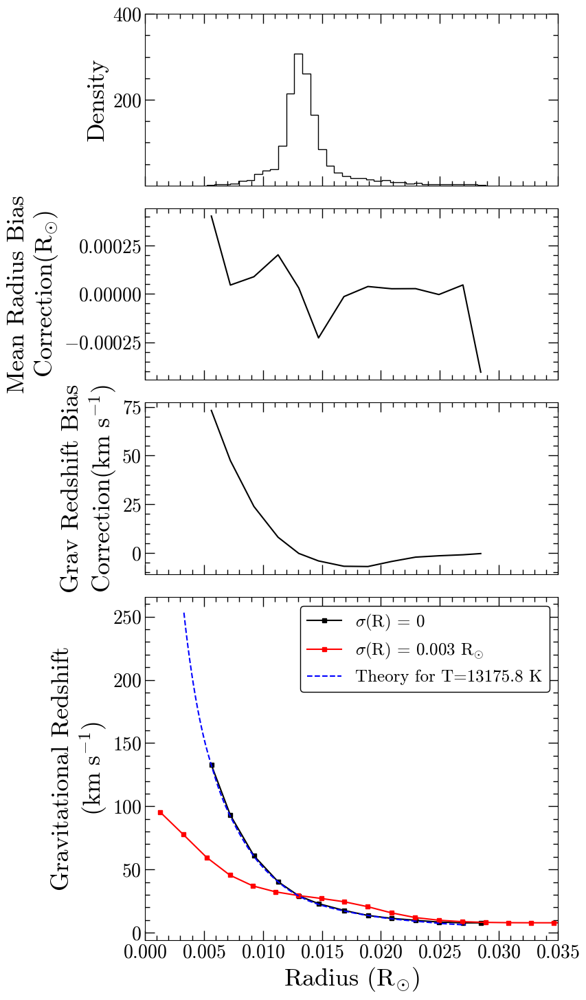

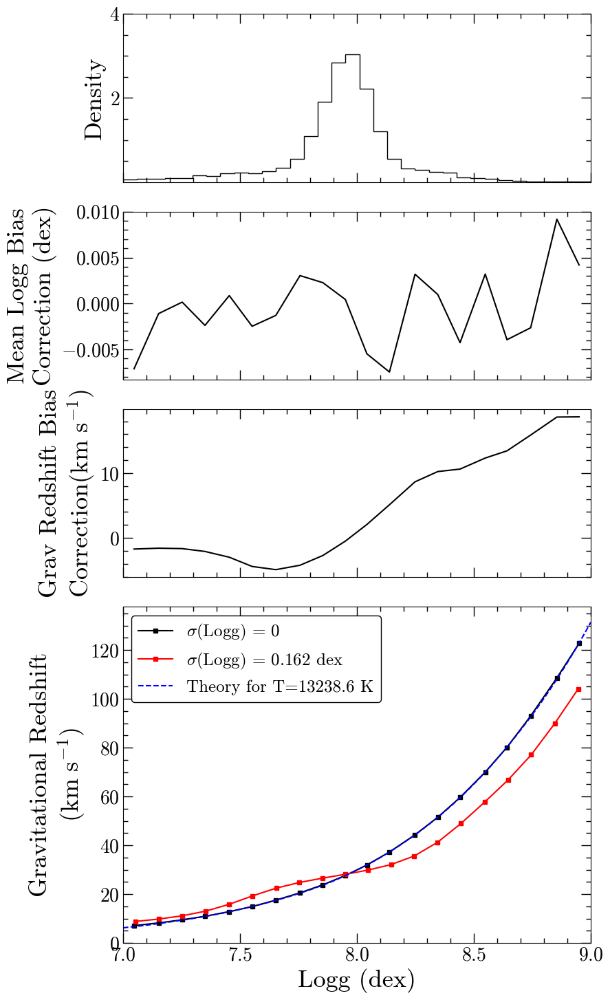

In [15]:
#now repeat the above process for 10,000 samples of radius/logg noise and get the overall bias correction

#show examples
nsigma_noise=-1
mass_sample,teff_sample,radius_sample,logg_sample,vg_sample=get_truth_sample(Eos_tab,len(Eos_tab), mass_dist='Kepler')
example=noise_mc(mass_sample,teff_sample,radius_sample,logg_sample,vg_sample,r_bins,g_bins,Eos_tab,nsigma_noise,
                 n_noise_samples=10000,plot=True)

nsigma_noise=0
mass_sample,teff_sample,radius_sample,logg_sample,vg_sample=get_truth_sample(Eos_tab,len(Eos_tab), mass_dist='Kepler')
example=noise_mc(mass_sample,teff_sample,radius_sample,logg_sample,vg_sample,r_bins,g_bins,Eos_tab,nsigma_noise,
                 n_noise_samples=10000,plot=True)

nsigma_noise=1
mass_sample,teff_sample,radius_sample,logg_sample,vg_sample=get_truth_sample(Eos_tab,len(Eos_tab), mass_dist='Kepler')
example=noise_mc(mass_sample,teff_sample,radius_sample,logg_sample,vg_sample,r_bins,g_bins,Eos_tab,nsigma_noise,
                 n_noise_samples=10000,plot=True)


### Run this bias correction for all data tables and save the result
Repeat for 10 runs to check that our results are robust against the effects of bias corrections

In [16]:
MsunCGS=1.989*10**33 #g
RsunCGS=6.955*10**10 #cm
cCGS=2.99792458*10**10 #cm/s
GCGS=6.6743*10**(-8) #cm^3 g^-1 s^-2

def data_m_from_logg_vg(loggs,vgs,e_loggs,e_vgs):
    #compute the spectroscopic mass and error on the mass in solar units
    masses=[]
    e_masses=[]
    #convert vgs from km/s to cm/s (CGS units)
    vgs=vgs*10**(5)
    e_vgs=e_vgs*10**(5)
    #get the surface gravity
    gs=10**(loggs)
    for i in range(len(loggs)):
        M=(((vgs[i]**2)*(cCGS**2))/(GCGS*gs[i]))/MsunCGS
        masses.append(M)
        E_M=(((vgs[i]*(cCGS**2))/(GCGS*gs[i]))*np.sqrt((vgs[i]**2)*((np.log(10))**2)*(e_loggs[i]**2)+4*(e_vgs[i]**2)))/MsunCGS
        e_masses.append(E_M)
    return(masses,e_masses)

def data_m_from_r_vg(radii,vgs,e_radii,e_vgs):
    #compute the photometric mass and error on the mass in solar units
    masses=[]
    e_masses=[]
    #convert vgs from km/s to cm/s (CGS units)
    vgs=vgs*10**(5)
    e_vgs=e_vgs*10**(5)
    #convert radii from solar units to CGS units
    radii=radii*RsunCGS
    e_radii=e_radii*RsunCGS
    for i in range(len(radii)):
        M=(vgs[i]*radii[i]*cCGS/GCGS)/MsunCGS #divide by Msun to get in solar units
        masses.append(M)
        E_M=((cCGS/GCGS)*np.sqrt((vgs[i]**2)*(e_radii[i]**2)+(radii[i]**2)*(e_vgs[i]**2)))/MsunCGS
        e_masses.append(E_M)
    return(masses,e_masses)

In [22]:
def parallelprocess_noise(i,run=0):
    tables=[SDSSV_eos_tab,eSDSS_eos_tab,Eos_tab,SDSSV_eos_tab_cool,eSDSS_eos_tab_cool,Eos_tab_cool,SDSSV_eos_tab_warm,
        eSDSS_eos_tab_warm,Eos_tab_warm]
    table_names=['SDSSV','eSDSS','All','cool_SDSSV','cool_eSDSS','cool_All','warm_SDSSV','warm_eSDSS','warm_All']
    nsigma_noises=[-1,0,1]
    
    radius_bias_dict={}
    logg_bias_dict={}

    table=tables[i]
    table_name=table_names[i]
    radius_bias_df=pd.DataFrame()
    logg_bias_df=pd.DataFrame()
    for nsigma_noise in nsigma_noises:
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            #this will trigger RuntimeWarnings whenever we take means of empty slices, temporarily suppress those warnings
        
            mass_sample,teff_sample,radius_sample,logg_sample,vg_sample=get_truth_sample(table,len(table), mass_dist='Kepler')
            radius_bias,radius_vg_bias,logg_bias,logg_vg_bias=noise_mc(mass_sample,teff_sample,radius_sample,logg_sample,vg_sample,
                                                       r_bins,g_bins,table,nsigma_noise,n_noise_samples=10000,plot=False)
        
        radius_bias_df['radius_bias_'+str(nsigma_noise)]=radius_bias
        radius_bias_df['vg_bias_'+str(nsigma_noise)]=radius_vg_bias
        
        logg_bias_df['logg_bias_'+str(nsigma_noise)]=logg_bias
        logg_bias_df['vg_bias_'+str(nsigma_noise)]=logg_vg_bias
    
    #save the result
    radius_bias_df.to_csv('csv/bias_correction_runs/run'+str(run)+'/radius_bias_df_'+table_name+'.csv',index=False)
    logg_bias_df.to_csv('csv/bias_correction_runs/run'+str(run)+'/logg_bias_df_'+table_name+'.csv',index=False)
        

In [25]:
runs=np.arange(0,10,1)

for run in runs:
    #run bias correction for all tables and save the results
    tables=[SDSSV_eos_tab,eSDSS_eos_tab,Eos_tab,SDSSV_eos_tab_cool,eSDSS_eos_tab_cool,Eos_tab_cool,SDSSV_eos_tab_warm,
            eSDSS_eos_tab_warm,Eos_tab_warm]
    table_names=['SDSSV','eSDSS','All','cool_SDSSV','cool_eSDSS','cool_All','warm_SDSSV','warm_eSDSS','warm_All']

    #set n_jobs=-2 to spawn n-1 CPU threads where n=total number CPUs available
    result=Parallel(n_jobs=-2, verbose=11)(delayed(parallelprocess_noise)(i,run=run) for i in range(len(tables)))
    
    #read back in the corrections
    radius_bias_dict={}
    logg_bias_dict={}
    for i in range(len(tables)):
        table=tables[i]
        table_name=table_names[i]
        radius_bias_dict[table_name]=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/radius_bias_df_'+table_name+'.csv')
        logg_bias_dict[table_name]=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/logg_bias_df_'+table_name+'.csv')

    #Apply corrections to LSR and asymmetric drift-corrected rvs
    #Since we used the same bins as the data, we can just add the corrections bin by bin
    #Add the average absolute difference between the +/- 1 sigma correction to the error in
    #quadrature to characterize the systematic error from the bias correction


    names=['SDSSV','eSDSS','All']
    for name in names:
        #apply bias correction
        Eos_tab_rad_avg['mean_radii_'+name+'_debias']=Eos_tab_rad_avg['mean_radii_'+name+'_asym']+radius_bias_dict[name]['radius_bias_0']
        #record systematic uncertainty and add in quadrature
        #don't add asym corrected mean value since this will cancel anyways
        sys_rad_err=np.abs(radius_bias_dict[name]['radius_bias_-1']-radius_bias_dict[name]['radius_bias_1'])
        Eos_tab_rad_avg['e_mean_radii_'+name+'_debias_sys']=sys_rad_err
        Eos_tab_rad_avg['e_mean_radii_'+name+'_debias']=np.sqrt(Eos_tab_rad_avg['e_mean_radii_'+name+'_asym']**2+sys_rad_err**2)
        #repeat for rvs
        Eos_tab_rad_avg['mean_RVs_'+name+'_debias']=Eos_tab_rad_avg['mean_RVs_'+name+'_asym']+radius_bias_dict[name]['vg_bias_0']
        sys_vg_err=np.abs(radius_bias_dict[name]['vg_bias_-1']-radius_bias_dict[name]['vg_bias_1'])
        Eos_tab_rad_avg['e_mean_RVs_'+name+'_debias_sys']=sys_vg_err
        Eos_tab_rad_avg['e_mean_RVs_'+name+'_debias']=np.sqrt(Eos_tab_rad_avg['e_mean_RVs_'+name+'_asym']**2+sys_vg_err**2)
        Eos_tab_rad_avg['num_obs_per_bin_'+name+'_debias']=Eos_tab_rad_avg['num_obs_per_bin_'+name+'_asym']
        
        #apply bias correction
        Eos_tab_logg_avg['mean_loggs_'+name+'_debias']=Eos_tab_logg_avg['mean_loggs_'+name+'_asym']+logg_bias_dict[name]['logg_bias_0']
        #record systematic uncertainty and add in quadrature
        sys_logg_err=np.abs(logg_bias_dict[name]['logg_bias_-1']-logg_bias_dict[name]['logg_bias_1'])
        Eos_tab_logg_avg['e_mean_loggs_'+name+'_debias_sys']=sys_logg_err
        Eos_tab_logg_avg['e_mean_loggs_'+name+'_debias']=np.sqrt(Eos_tab_logg_avg['e_mean_loggs_'+name+'_asym']**2+sys_logg_err**2)
        #repeat for rvs
        Eos_tab_logg_avg['mean_RVs_'+name+'_debias']=Eos_tab_logg_avg['mean_RVs_'+name+'_asym']+logg_bias_dict[name]['vg_bias_0']
        sys_vg_err=np.abs(logg_bias_dict[name]['vg_bias_-1']-logg_bias_dict[name]['vg_bias_1'])
        Eos_tab_logg_avg['e_mean_RVs_'+name+'_debias_sys']=sys_vg_err
        Eos_tab_logg_avg['e_mean_RVs_'+name+'_debias']=np.sqrt(Eos_tab_logg_avg['e_mean_RVs_'+name+'_asym']**2+sys_vg_err**2)
        Eos_tab_logg_avg['num_obs_per_bin_'+name+'_debias']=Eos_tab_logg_avg['num_obs_per_bin_'+name+'_asym']
        

    names=['cool_SDSSV','cool_eSDSS','cool_All','warm_SDSSV','warm_eSDSS','warm_All']
    for name in names:
        #apply bias correction
        Teff_Eos_tab_rad_avg['mean_radii_'+name+'_debias']=Teff_Eos_tab_rad_avg['mean_radii_'+name+'_asym']+radius_bias_dict[name]['radius_bias_0']
        #record systematic uncertainty and add in quadrature
        #don't add asym corrected mean value since this will cancel anyways
        sys_rad_err=np.abs(radius_bias_dict[name]['radius_bias_-1']-radius_bias_dict[name]['radius_bias_1'])
        Teff_Eos_tab_rad_avg['e_mean_radii_'+name+'_debias_sys']=sys_rad_err
        Teff_Eos_tab_rad_avg['e_mean_radii_'+name+'_debias']=np.sqrt(Teff_Eos_tab_rad_avg['e_mean_radii_'+name+'_asym']**2+sys_rad_err**2)
        #repeat for rvs
        Teff_Eos_tab_rad_avg['mean_RVs_'+name+'_debias']=Teff_Eos_tab_rad_avg['mean_RVs_'+name+'_asym']+radius_bias_dict[name]['vg_bias_0']
        sys_vg_err=np.abs(radius_bias_dict[name]['vg_bias_-1']-radius_bias_dict[name]['vg_bias_1'])
        Teff_Eos_tab_rad_avg['e_mean_RVs_'+name+'_debias_sys']=sys_vg_err
        Teff_Eos_tab_rad_avg['e_mean_RVs_'+name+'_debias']=np.sqrt(Teff_Eos_tab_rad_avg['e_mean_RVs_'+name+'_asym']**2+sys_vg_err**2)
        Teff_Eos_tab_rad_avg['num_obs_per_bin_'+name+'_debias']=Teff_Eos_tab_rad_avg['num_obs_per_bin_'+name+'_asym']
        
        #apply bias correction
        Teff_Eos_tab_logg_avg['mean_loggs_'+name+'_debias']=Teff_Eos_tab_logg_avg['mean_loggs_'+name+'_asym']+logg_bias_dict[name]['logg_bias_0']
        #record systematic uncertainty and add in quadrature
        sys_logg_err=np.abs(logg_bias_dict[name]['logg_bias_-1']-logg_bias_dict[name]['logg_bias_1'])
        Teff_Eos_tab_logg_avg['e_mean_loggs_'+name+'_debias_sys']=sys_logg_err
        Teff_Eos_tab_logg_avg['e_mean_loggs_'+name+'_debias']=np.sqrt(Teff_Eos_tab_logg_avg['e_mean_loggs_'+name+'_asym']**2+sys_logg_err**2)
        #repeat for rvs
        Teff_Eos_tab_logg_avg['mean_RVs_'+name+'_debias']=Teff_Eos_tab_logg_avg['mean_RVs_'+name+'_asym']+logg_bias_dict[name]['vg_bias_0']
        sys_vg_err=np.abs(logg_bias_dict[name]['vg_bias_-1']-logg_bias_dict[name]['vg_bias_1'])
        Teff_Eos_tab_logg_avg['e_mean_RVs_'+name+'_debias_sys']=sys_vg_err
        Teff_Eos_tab_logg_avg['e_mean_RVs_'+name+'_debias']=np.sqrt(Teff_Eos_tab_logg_avg['e_mean_RVs_'+name+'_asym']**2+sys_vg_err**2)
        Teff_Eos_tab_logg_avg['num_obs_per_bin_'+name+'_debias']=Teff_Eos_tab_logg_avg['num_obs_per_bin_'+name+'_asym']
        
    #get debiased masses
    names=['SDSSV','eSDSS','All']
    for name in names:
        Eos_tab_rad_avg['mass_'+name+'_debias'],Eos_tab_rad_avg['e_mass_'+name+'_debias']=data_m_from_r_vg(Eos_tab_rad_avg['mean_radii_'+name+'_debias'],Eos_tab_rad_avg['mean_RVs_'+name+'_debias'],Eos_tab_rad_avg['e_mean_radii_'+name+'_debias'],Eos_tab_rad_avg['e_mean_RVs_'+name+'_debias'])
        Eos_tab_logg_avg['mass_'+name+'_debias'],Eos_tab_logg_avg['e_mass_'+name+'_debias']=data_m_from_logg_vg(Eos_tab_logg_avg['mean_loggs_'+name+'_debias'],Eos_tab_logg_avg['mean_RVs_'+name+'_debias'],Eos_tab_logg_avg['e_mean_loggs_'+name+'_debias'],Eos_tab_logg_avg['e_mean_RVs_'+name+'_debias'])
    names=['cool_SDSSV','cool_eSDSS','cool_All','warm_SDSSV','warm_eSDSS','warm_All']
    for name in names:
        Teff_Eos_tab_rad_avg['mass_'+name+'_debias'],Teff_Eos_tab_rad_avg['e_mass_'+name+'_debias']=data_m_from_r_vg(Teff_Eos_tab_rad_avg['mean_radii_'+name+'_debias'],Teff_Eos_tab_rad_avg['mean_RVs_'+name+'_debias'],Teff_Eos_tab_rad_avg['e_mean_radii_'+name+'_debias'],Teff_Eos_tab_rad_avg['e_mean_RVs_'+name+'_debias'])
        Teff_Eos_tab_logg_avg['mass_'+name+'_debias'],Teff_Eos_tab_logg_avg['e_mass_'+name+'_debias']=data_m_from_logg_vg(Teff_Eos_tab_logg_avg['mean_loggs_'+name+'_debias'],Teff_Eos_tab_logg_avg['mean_RVs_'+name+'_debias'],Teff_Eos_tab_logg_avg['e_mean_loggs_'+name+'_debias'],Teff_Eos_tab_logg_avg['e_mean_RVs_'+name+'_debias'])
        
    #check for negative errors
    #these can result from averaging too few WDs to get the grav redshift
    tables=[Eos_tab_rad_avg,Eos_tab_logg_avg,Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg]
    for table in tables:
        columns=table.columns.to_list()[3:]
        for col in columns:
            negatives=table.query(col+'<0')[col].index.to_list()
            if len(negatives)>0:
                table[col].loc[negatives]=np.nan

    #save the tables
    Eos_tab_rad_avg.to_csv('csv/bias_correction_runs/run'+str(run)+'/Eos_tab_rad_avg.csv',index=False)
    Eos_tab_logg_avg.to_csv('csv/bias_correction_runs/run'+str(run)+'/Eos_tab_logg_avg.csv',index=False)
    
    Teff_Eos_tab_rad_avg.to_csv('csv/bias_correction_runs/run'+str(run)+'/Teff_Eos_tab_rad_avg.csv',index=False)
    Teff_Eos_tab_logg_avg.to_csv('csv/bias_correction_runs/run'+str(run)+'/Teff_Eos_tab_logg_avg.csv',index=False)
        

[Parallel(n_jobs=-2)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=-2)]: Done   1 tasks      | elapsed:   31.5s
[Parallel(n_jobs=-2)]: Done   2 out of   9 | elapsed:   34.7s remaining:  2.0min
[Parallel(n_jobs=-2)]: Done   3 out of   9 | elapsed:  1.0min remaining:  2.0min
[Parallel(n_jobs=-2)]: Done   4 out of   9 | elapsed:  1.1min remaining:  1.3min
[Parallel(n_jobs=-2)]: Done   5 out of   9 | elapsed:  1.2min remaining:   59.5s
[Parallel(n_jobs=-2)]: Done   6 out of   9 | elapsed:  1.4min remaining:   43.1s
[Parallel(n_jobs=-2)]: Done   7 out of   9 | elapsed:  1.7min remaining:   28.7s
[Parallel(n_jobs=-2)]: Done   9 out of   9 | elapsed:  2.6min finished
[Parallel(n_jobs=-2)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=-2)]: Done   1 tasks      | elapsed:   27.3s
[Parallel(n_jobs=-2)]: Done   2 out of   9 | elapsed:   29.8s remaining:  1.7min
[Parallel(n_jobs=-2)]: Done   3 out of   9 | elapsed:   53.2s remaining:  1.8min
[Para

# DUPLICATE THE RUNS WITH THE \_nb08 BACKUP TAG

In [26]:
run=0

runs=np.arange(0,10,1)
tables=[SDSSV_eos_tab,eSDSS_eos_tab,Eos_tab,SDSSV_eos_tab_cool,eSDSS_eos_tab_cool,Eos_tab_cool,SDSSV_eos_tab_warm,
            eSDSS_eos_tab_warm,Eos_tab_warm]
table_names=['SDSSV','eSDSS','All','cool_SDSSV','cool_eSDSS','cool_All','warm_SDSSV','warm_eSDSS','warm_All']
    
#read back in the corrections and the tables
radius_bias_dict={}
logg_bias_dict={}
for i in range(len(tables)):
    table=tables[i]
    table_name=table_names[i]
    radius_bias_dict[table_name]=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/radius_bias_df_'+table_name+'.csv')
    logg_bias_dict[table_name]=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/logg_bias_df_'+table_name+'.csv')


Eos_tab_rad_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Eos_tab_rad_avg.csv')
Eos_tab_logg_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Eos_tab_logg_avg.csv')

Teff_Eos_tab_rad_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Teff_Eos_tab_rad_avg.csv')
Teff_Eos_tab_logg_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Teff_Eos_tab_logg_avg.csv')



Text(0, 0.5, 'RV Error (km/s)')

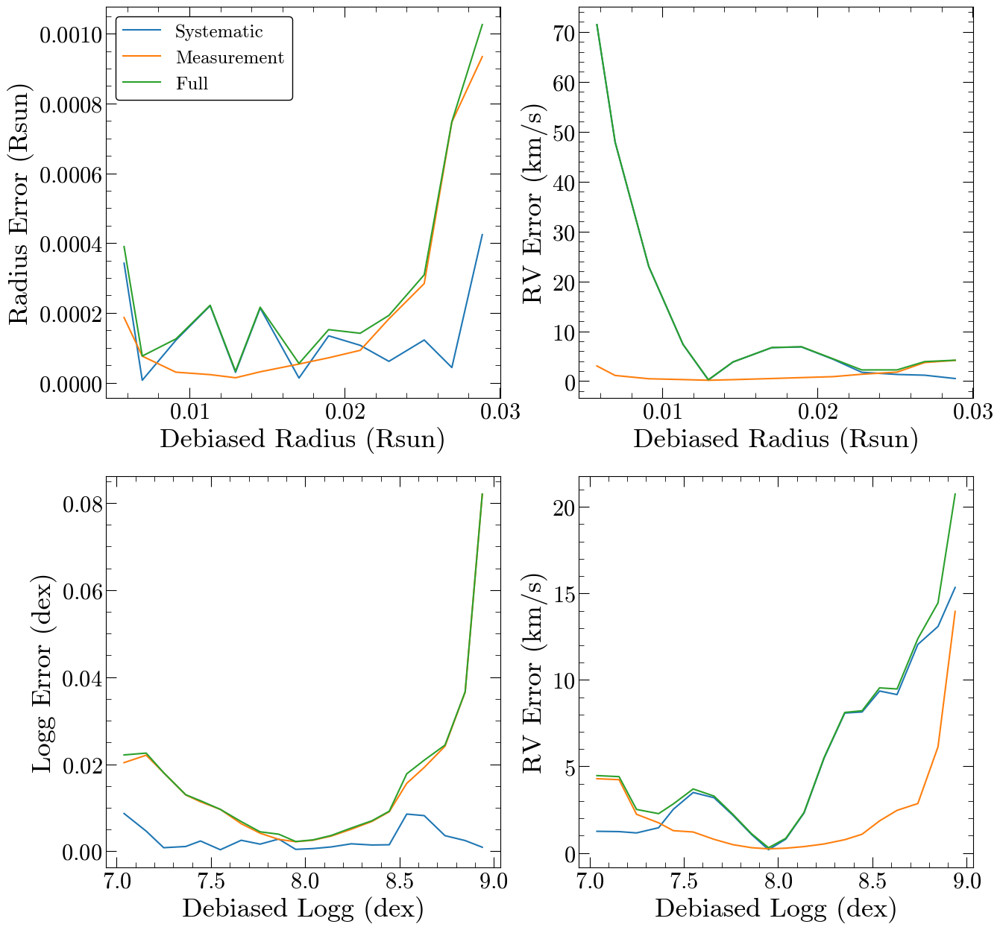

In [27]:
#plot the different errors
name='All'
fig, ((ax1,ax2),(ax3,ax4))=plt.subplots(2,2,figsize=(15,15))
ax1.plot(Eos_tab_rad_avg['mean_radii_'+name+'_debias'],Eos_tab_rad_avg['e_mean_radii_'+name+'_debias_sys'],label='Systematic')
ax1.plot(Eos_tab_rad_avg['mean_radii_'+name+'_debias'],Eos_tab_rad_avg['e_mean_radii_'+name+'_asym'],label='Measurement')
ax1.plot(Eos_tab_rad_avg['mean_radii_'+name+'_debias'],Eos_tab_rad_avg['e_mean_radii_'+name+'_debias'],label='Full')
ax1.legend()
ax1.set_xlabel('Debiased Radius (Rsun)')
ax1.set_ylabel('Radius Error (Rsun)')

ax2.plot(Eos_tab_rad_avg['mean_radii_'+name+'_debias'],Eos_tab_rad_avg['e_mean_RVs_'+name+'_debias_sys'],label='Systematic')
ax2.plot(Eos_tab_rad_avg['mean_radii_'+name+'_debias'],Eos_tab_rad_avg['e_mean_RVs_'+name+'_asym'],label='Measurement')
ax2.plot(Eos_tab_rad_avg['mean_radii_'+name+'_debias'],Eos_tab_rad_avg['e_mean_RVs_'+name+'_debias'],label='Full')
ax2.set_xlabel('Debiased Radius (Rsun)')
ax2.set_ylabel('RV Error (km/s)')

ax3.plot(Eos_tab_logg_avg['mean_loggs_'+name+'_debias'],Eos_tab_logg_avg['e_mean_loggs_'+name+'_debias_sys'],label='Systematic')
ax3.plot(Eos_tab_logg_avg['mean_loggs_'+name+'_debias'],Eos_tab_logg_avg['e_mean_loggs_'+name+'_asym'],label='Measurement')
ax3.plot(Eos_tab_logg_avg['mean_loggs_'+name+'_debias'],Eos_tab_logg_avg['e_mean_loggs_'+name+'_debias'],label='Full')
ax3.set_xlabel('Debiased Logg (dex)')
ax3.set_ylabel('Logg Error (dex)')

ax4.plot(Eos_tab_logg_avg['mean_loggs_'+name+'_debias'],Eos_tab_logg_avg['e_mean_RVs_'+name+'_debias_sys'],label='Systematic')
ax4.plot(Eos_tab_logg_avg['mean_loggs_'+name+'_debias'],Eos_tab_logg_avg['e_mean_RVs_'+name+'_asym'],label='Measurement')
ax4.plot(Eos_tab_logg_avg['mean_loggs_'+name+'_debias'],Eos_tab_logg_avg['e_mean_RVs_'+name+'_debias'],label='Full')
ax4.set_xlabel('Debiased Logg (dex)')
ax4.set_ylabel('RV Error (km/s)')

#the radius/logg errors are dominated by the measurement errors, the RV errors by the systematic errors

# Functions for plotting

In [28]:
def theo_r_from_m_teff(mass_array, teff_array):
    #this function takes in an array of masses in solar units and temperatures in K
    #returns the predicted radius in solar units from a model
    radius_wd=radius_from_mass_teff(mass_array, teff_array)
    return radius_wd

def theo_vg_from_r_teff(radius_array, teff_array):
    #this function takes in an array of radii in solar units and temperatures in K
    #returns the predicted gravitational redshift in km/s from a model
    
    #WD mass in CGS units
    mass_wd = mass_from_radius_teff(radius_array, teff_array)* MsunCGS
    
    #gravitational redshift in km/s
    rv = (GCGS * mass_wd / (cCGS * radius_array*RsunCGS))*10**(-5)

    return rv

def theo_vg_from_logg_teff(logg_array, teff_array):
    #this function takes in an array of loggs in CGS units and temperatures in K
    #returns the predicted gravitational redshift in km/s from a Fontaine Model
    
    mass_wd = mass_from_logg_teff(logg_array, teff_array)* MsunCGS
    
    #gravitational redshift in km/s
    rv = np.sqrt(mass_wd*GCGS*(10**logg_array)/cCGS**2)*10**(-5)

    return rv

def theo_m_from_vg_r(vg, r):
    #take vg in km/s and r in Rsun and get M in Msun
    M=(vg*(10**5)*r*RsunCGS*cCGS/GCGS)/MsunCGS
    return(M)
  
def theo_m_from_vg_logg(vg, logg):
    #take vg in km/s and logg in CGS units and get M in Msun
    vg2=(vg*10**5)**2
    c2=cCGS**2
    g=10**logg
    M=((vg2*c2)/(GCGS*g))/MsunCGS
    return(M)

# Plots
## Agreement with La Plata

In [29]:
def plot_eos(table_phot,table_spec,key,num_obs_per_bin=None,radlim=None,logglim=None,savefig=False):
    #key = 'LSR' for LSR-corrected RVs
    #key = 'asym' for LSR-corrected+Asymmetric drift-corrected RVs
    #key = 'debias' for LSR-corrected+Asymmetric drift+sharp peak bias-corrected RVs
    
    fig, ((ax1,ax2),(ax4,ax5)) =plt.subplots(2,2,figsize=(15,15))
    plt.style.use('stefan.mplstyle')
    
    #crop all the tables to have only bins with num_obs_per_bin>threshold
    table_phot_All=table_phot.query('num_obs_per_bin_All_'+key+'>@num_obs_per_bin')
    table_phot_SDSSV=table_phot.query('num_obs_per_bin_SDSSV_'+key+'>@num_obs_per_bin')
    table_phot_eSDSS=table_phot.query('num_obs_per_bin_eSDSS_'+key+'>@num_obs_per_bin')
    table_spec_All=table_spec.query('num_obs_per_bin_All_'+key+'>@num_obs_per_bin')
    table_spec_SDSSV=table_spec.query('num_obs_per_bin_SDSSV_'+key+'>@num_obs_per_bin')
    table_spec_eSDSS=table_spec.query('num_obs_per_bin_eSDSS_'+key+'>@num_obs_per_bin')
    
    tables=[table_phot_All,table_phot_SDSSV,table_phot_eSDSS,table_spec_All,table_spec_SDSSV,table_spec_eSDSS]
    for table in tables:
        #reset the indices
        indices=np.arange(0,len(table))
        table.set_index(indices,inplace=True)

    #get theoretical R-vg relation
    theo_radii = np.linspace(0.006,0.04, 1000)
    theo_vg_r_lowT = theo_vg_from_r_teff(theo_radii, 4000)
    theo_vg_r_highT = theo_vg_from_r_teff(theo_radii, 40000)
    #plot theoretical R-vg relation
    ax1.plot(theo_radii, theo_vg_r_lowT, 'red', linestyle = '-', label = '4,000 K Model', linewidth = 1)
    ax1.plot(theo_radii, theo_vg_r_highT, 'blue', label = '40,000 K Model', linewidth = 1)
    #plot data
    ax1.errorbar(table_phot_All['mean_radii_All_'+key],table_phot_All['mean_RVs_All_'+key],
                 xerr=table_phot_All['e_mean_radii_All_'+key],yerr=table_phot_All['e_mean_RVs_All_'+key],fmt='ko',label='All SDSS WDs')
    ax1.errorbar(table_phot_SDSSV['mean_radii_SDSSV_'+key],table_phot_SDSSV['mean_RVs_SDSSV_'+key],
                 xerr=table_phot_SDSSV['e_mean_radii_SDSSV_'+key],yerr=table_phot_SDSSV['e_mean_RVs_SDSSV_'+key],fmt='cs',label='SDSS-V WDs')
    ax1.errorbar(table_phot_eSDSS['mean_radii_eSDSS_'+key],table_phot_eSDSS['mean_RVs_eSDSS_'+key],
                 xerr=table_phot_eSDSS['e_mean_radii_eSDSS_'+key],yerr=table_phot_eSDSS['e_mean_RVs_eSDSS_'+key],fmt='mD',label='Earlier SDSS WDs')
    #exclude Binary Evolution
    ax1.axvspan(0.016, 0.045, hatch ='/', color = 'grey', alpha = 0.3,label='Binary Evolution')
    ax1.legend()
    #ax1.set_xlabel('Photometric Radius ($R_\odot$)')
    ax1.set_ylabel('Gravitational Redshift ($km$ $s^{-1}$)')
    if radlim!=None:
        ax1.set_xlim(radlim[0],radlim[1])
    
    #get theoretical logg-vg relation
    theo_loggs = np.linspace(7,9, 1000)
    theo_vg_logg_lowT = theo_vg_from_logg_teff(theo_loggs, 4000)
    theo_vg_logg_highT = theo_vg_from_logg_teff(theo_loggs, 40000)
    #plot theoretical logg-vg relation
    ax2.plot(theo_loggs, theo_vg_logg_lowT, 'red', linestyle = '-', label = '4,000 K Model', linewidth = 1)
    ax2.plot(theo_loggs, theo_vg_logg_highT, 'blue', label = '40,000 K Model', linewidth = 1)
    #plot data
    ax2.errorbar(table_spec_All['mean_loggs_All_'+key],table_spec_All['mean_RVs_All_'+key],
                 xerr=table_spec_All['e_mean_loggs_All_'+key],yerr=table_spec_All['e_mean_RVs_All_'+key],fmt='ko',label='All SDSS WDs')
    ax2.errorbar(table_spec_SDSSV['mean_loggs_SDSSV_'+key],table_spec_SDSSV['mean_RVs_SDSSV_'+key],
                 xerr=table_spec_SDSSV['e_mean_loggs_SDSSV_'+key],yerr=table_spec_SDSSV['e_mean_RVs_SDSSV_'+key],fmt='cs',label='SDSS-V WDs')
    ax2.errorbar(table_spec_eSDSS['mean_loggs_eSDSS_'+key],table_spec_eSDSS['mean_RVs_eSDSS_'+key],
                 xerr=table_spec_eSDSS['e_mean_loggs_eSDSS_'+key],yerr=table_spec_eSDSS['e_mean_RVs_eSDSS_'+key],fmt='mD',label='Earlier SDSS WDs')
    #exclude Binary Evolution
    ax2.axvspan(6.9, 7.7, hatch ='/', color = 'grey', alpha = 0.3,label='Binary Evolution')
    #ax2.set_xlabel('Spectroscopic Logg ($dex$)')
    #ax2.set_ylabel('Gravitational Redshift ($km$ $s^{-1}$)')
    if logglim!=None:
        ax2.set_xlim(logglim[0],logglim[1])
    
    #plot theoretical M-R relation
    ax4.plot(theo_radii, theo_m_from_vg_r(theo_vg_r_lowT, theo_radii), 'red', linestyle = '-', label = '4,000 K Model', linewidth = 1)
    ax4.plot(theo_radii, theo_m_from_vg_r(theo_vg_r_highT, theo_radii), 'blue', label = '40,000 K Model', linewidth = 1)
    #plot data
    ax4.errorbar(table_phot_All['mean_radii_All_'+key],table_phot_All['mass_All_'+key],
                 xerr=table_phot_All['e_mean_radii_All_'+key],yerr=table_phot_All['e_mass_All_'+key],fmt='ko',label='All SDSS WDs')
    ax4.errorbar(table_phot_SDSSV['mean_radii_SDSSV_'+key],table_phot_SDSSV['mass_SDSSV_'+key],
                 xerr=table_phot_SDSSV['e_mean_radii_SDSSV_'+key],yerr=table_phot_SDSSV['e_mass_SDSSV_'+key],fmt='cs',label='SDSS-V WDs')
    ax4.errorbar(table_phot_eSDSS['mean_radii_eSDSS_'+key],table_phot_eSDSS['mass_eSDSS_'+key],
                 xerr=table_phot_eSDSS['e_mean_radii_eSDSS_'+key],yerr=table_phot_eSDSS['e_mass_eSDSS_'+key],fmt='mD',label='Earlier SDSS WDs')
    #exclude Binary Evolution
    ax4.axvspan(0.016, 0.045, hatch ='/', color = 'grey', alpha = 0.3,label='Binary Evolution')
    ax4.set_xlabel('Photometric Radius ($R_\odot$)')
    ax4.set_ylabel('Mass ($M_\odot$)')
    if radlim!=None:
        ax4.set_xlim(radlim[0],radlim[1])
    
    #plot theoretical M-logg relation
    ax5.plot(theo_loggs, theo_m_from_vg_logg(theo_vg_logg_lowT, theo_loggs), 'red', linestyle = '-', label = '4,000 K Model', linewidth = 1)
    ax5.plot(theo_loggs, theo_m_from_vg_logg(theo_vg_logg_highT, theo_loggs), 'blue', label = '40,000 K Model', linewidth = 1)
    #plot data
    ax5.errorbar(table_spec_All['mean_loggs_All_'+key],table_spec_All['mass_All_'+key],
                 xerr=table_spec_All['e_mean_loggs_All_'+key],yerr=table_spec_All['e_mass_All_'+key],fmt='ko',label='All SDSS WDs')
    ax5.errorbar(table_spec_SDSSV['mean_loggs_SDSSV_'+key],table_spec_SDSSV['mass_SDSSV_'+key],
                 xerr=table_spec_SDSSV['e_mean_loggs_SDSSV_'+key],yerr=table_spec_SDSSV['e_mass_SDSSV_'+key],fmt='cs',label='SDSS-V WDs')
    ax5.errorbar(table_spec_eSDSS['mean_loggs_eSDSS_'+key],table_spec_eSDSS['mass_eSDSS_'+key],
                 xerr=table_spec_eSDSS['e_mean_loggs_eSDSS_'+key],yerr=table_spec_eSDSS['e_mass_eSDSS_'+key],fmt='mD',label='Earlier SDSS WDs')
    #exclude Binary Evolution
    ax5.axvspan(6.9, 7.7, hatch ='/', color = 'grey', alpha = 0.3,label='Binary Evolution')
    ax5.set_xlabel('Spectroscopic Logg ($dex$)')
    #ax5.set_ylabel('Spectroscopic Mass ($M_\odot$)')
    if logglim!=None:
        ax5.set_xlim(logglim[0],logglim[1])
        
    #make x limits consistent
    ax1.set_xlim(0.005,0.029)
    ax4.set_xlim(0.005,0.029)
    ax2.set_xlim(7.2,8.7)
    ax5.set_xlim(7.2,8.7)
    #make y limits consistent
    ax1.set_ylim(2,160)
    ax2.set_ylim(2,160)
    ax4.set_ylim(0.01,1.7)
    ax5.set_ylim(0.01,1.7)
    #hide tick labels
    ax2.yaxis.set_ticklabels([])
    ax5.yaxis.set_ticklabels([])
    ax1.xaxis.set_ticklabels([])
    ax2.xaxis.set_ticklabels([])
    
    plt.subplots_adjust(wspace = 0,hspace=0)
    
    if savefig==True:
        plt.savefig('eos_'+key+'.pdf', dpi=300)
    else:
        plt.show()
    

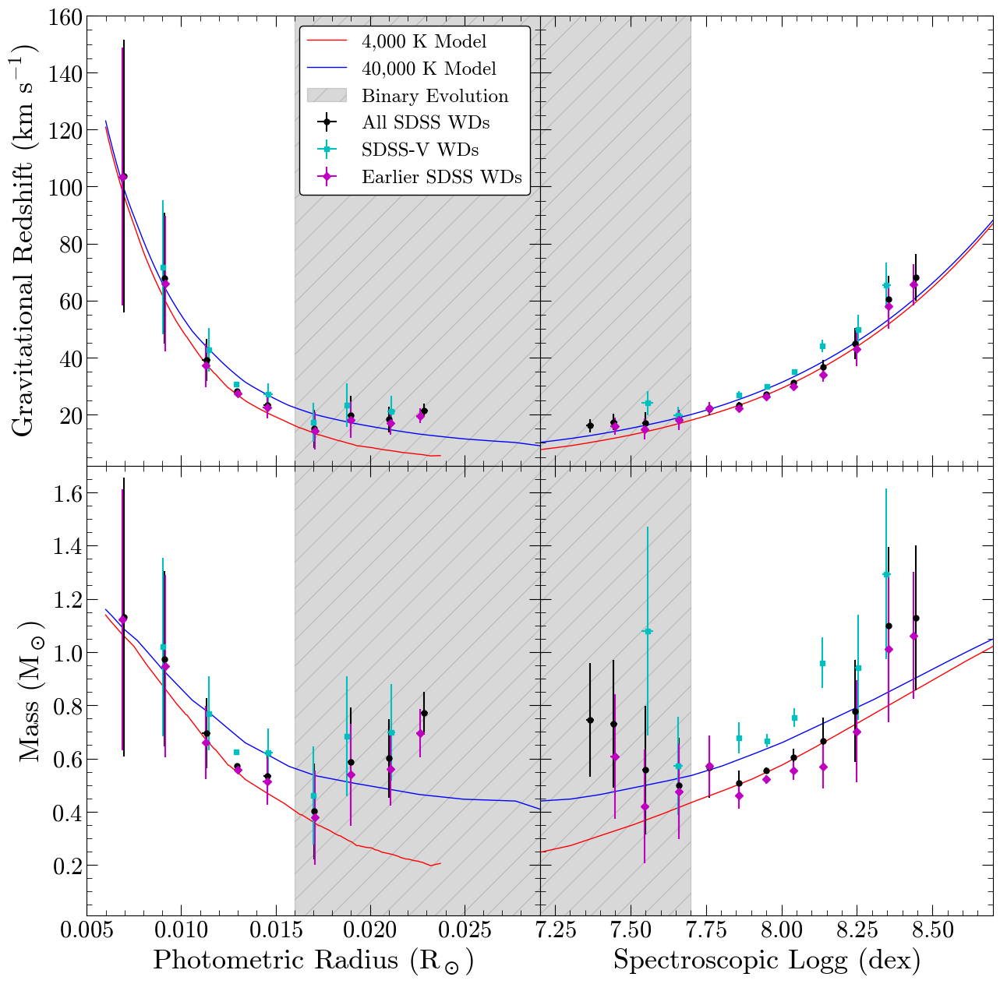

In [30]:
plot_eos(Eos_tab_rad_avg,Eos_tab_logg_avg,'debias',50,radlim=[0.005,0.025],logglim=[7.2,8.7])

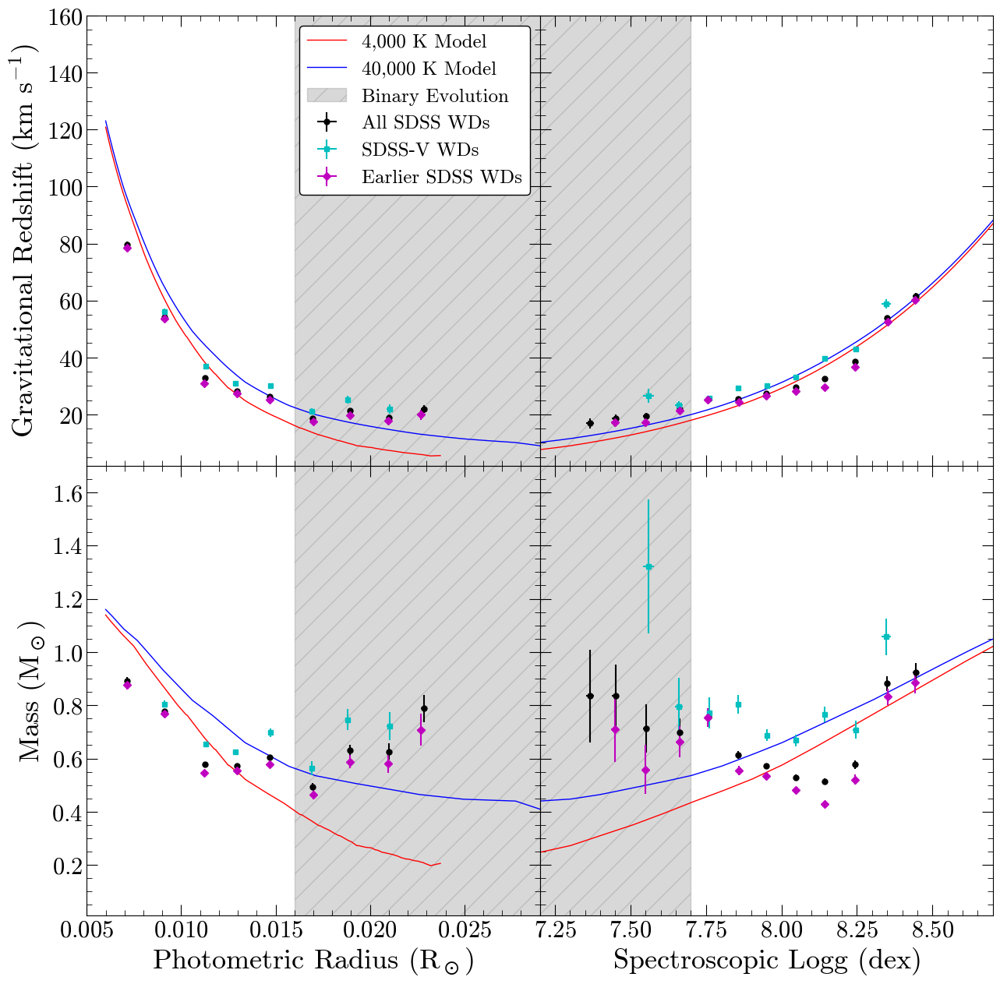

In [31]:
plot_eos(Eos_tab_rad_avg,Eos_tab_logg_avg,'asym',50,radlim=[0.005,0.025],logglim=[7.2,8.7])

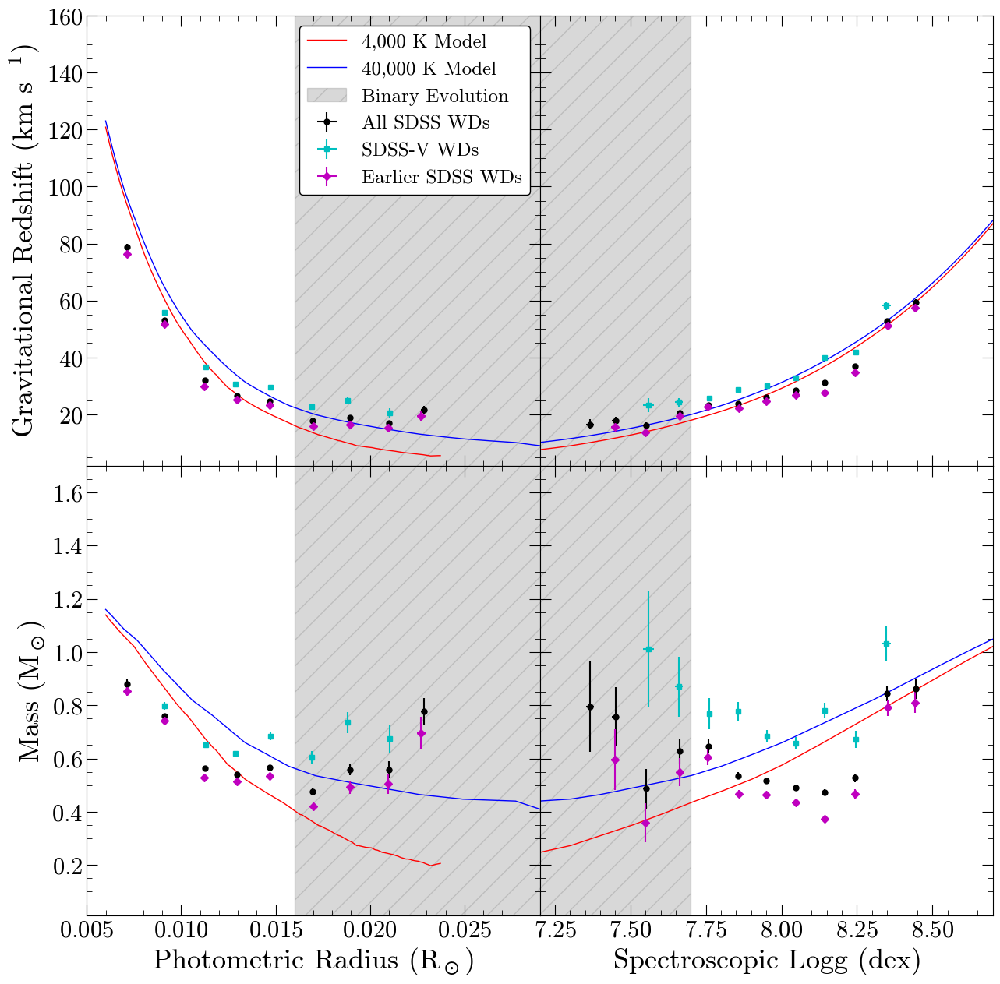

In [32]:
plot_eos(Eos_tab_rad_avg,Eos_tab_logg_avg,'LSR',50,radlim=[0.005,0.025],logglim=[7.2,8.7])

### Agreement with theory at the peak of the distribution


In [33]:
def get_peak_info(param,key,Eos_tab_rad_avg,Eos_tab_logg_avg):
    #param='radius','logg','3Dlogg'
    #key='All','SDSSV','eSDSS'
    
    if param=='radius':
        #get peak location
        peak_num=max(Eos_tab_rad_avg['num_obs_per_bin_'+key+'_debias'])
        peak_tab=Eos_tab_rad_avg.query('num_obs_per_bin_'+key+'_debias==@peak_num')
        #get peak bin number
        binnum=peak_tab['radius_bin_id'].to_list()[0]
        #get peak radius
        peak_param=peak_tab['mean_radii_'+key+'_debias'].to_list()[0]
        e_peak_param=peak_tab['e_mean_radii_'+key+'_debias'].to_list()[0]
        #get peak radius grav redshift and error on peak grav redshift (neglect uncertainty on mean peak radius)
        peak_vg=peak_tab['mean_RVs_'+key+'_debias'].to_list()[0]
        e_peak_vg=peak_tab['e_mean_RVs_'+key+'_debias'].to_list()[0]
        #get all data in that bin
        all_dat_tab=Eos_tab.query('radius_bin_id==@binnum')
        #get mean photometric temperature
        mean_teff=np.mean(all_dat_tab['teff_phot'])
        std_teff=np.std(all_dat_tab['teff_phot'])
        #find the corresponding La Plata grav redshift
        laplata_vg=theo_vg_from_r_teff(peak_param, mean_teff)
        laplata_vg1=theo_vg_from_r_teff(peak_param, mean_teff+std_teff)
        laplata_vg_1=theo_vg_from_r_teff(peak_param, mean_teff-std_teff)
    if param=='logg':
        #get peak location
        peak_num=max(Eos_tab_logg_avg['num_obs_per_bin_'+key+'_debias'])
        peak_tab=Eos_tab_logg_avg.query('num_obs_per_bin_'+key+'_debias==@peak_num')
        #get peak bin number
        binnum=peak_tab['logg_bin_id'].to_list()[0]
        #get peak logg
        peak_param=peak_tab['mean_loggs_'+key+'_debias'].to_list()[0]
        e_peak_param=peak_tab['e_mean_loggs_'+key+'_debias'].to_list()[0]
        #get peak logg grav redshift and error on peak grav redshift (neglect uncertainty on mean peak logg)
        peak_vg=peak_tab['mean_RVs_'+key+'_debias'].to_list()[0]
        e_peak_vg=peak_tab['e_mean_RVs_'+key+'_debias'].to_list()[0]
        #get all data in that bin
        all_dat_tab=Eos_tab.query('logg_bin_id==@binnum')
        #get mean photometric temperature
        mean_teff=np.mean(all_dat_tab['teff_phot'])
        std_teff=np.std(all_dat_tab['teff_phot'])
        #find the corresponding La Plata grav redshift
        laplata_vg=theo_vg_from_logg_teff(peak_param, mean_teff)
        laplata_vg1=theo_vg_from_logg_teff(peak_param, mean_teff+std_teff)
        laplata_vg_1=theo_vg_from_logg_teff(peak_param, mean_teff-std_teff)
        
    return(binnum,peak_param,e_peak_param,peak_vg,e_peak_vg,all_dat_tab,mean_teff,std_teff,laplata_vg,laplata_vg1,laplata_vg_1)

In [34]:
#plot behavior at peak for radius and logg data from combined catalog

def plot_peak_comparison(Eos_tab_rad_avg,Eos_tab_logg_avg,savefig=False):

    fig, ((ax1),(ax2)) =plt.subplots(2,1,figsize=(7,14),sharex=True,sharey=True)
    
    #radius peak
    binnum_rad,peak_rad,e_peak_rad,peak_vg_rad,e_peak_vg_rad,all_dat_tab_rad,mean_teff_rad,std_teff_rad,laplata_vg_rad,laplata_vg1_rad,laplata_vg_1_rad=get_peak_info('radius','All',Eos_tab_rad_avg,Eos_tab_logg_avg)
    rad_peak_range=Eos_tab_rad_avg.query('radius_bin_id==@binnum_rad')['Bin_range'].to_list()[0]
    #plot a histogram of all the LSR and asym drift-corrected RVs in the bin
    #with shaded regions for our measured grav redshift pm error and laplataaine theoretical grav redshift pm error
    ax1.hist(all_dat_tab_rad['rv_corv_asym_corr'],density=True,label='Radial\nVelocities')
    ax1.axvline(peak_vg_rad,color='black',label='Measured\nRedshift')
    ax1.axvspan(peak_vg_rad-e_peak_vg_rad, peak_vg_rad+e_peak_vg_rad, alpha=0.5, color='black')
    ax1.axvline(laplata_vg_rad,color='green',label='Theoretical\nRedshift')
    ax1.axvspan(laplata_vg1_rad, laplata_vg_1_rad, alpha=0.5,color='green')
    ax1.set_xlim(-175,250)
    ax1.set_ylim(0, 0.016)
    ax1.set_ylabel('Count Density')
    ax1.set_title('Radius Peak Bin=\n'+str(rad_peak_range)+' $R_\odot$')
    ax1.legend(loc='upper left')
    #add insert to show behavior at peak
    axins1 = zoomed_inset_axes(ax1, 15, loc=1)
    axins1.hist(all_dat_tab_rad['rv_corv_asym_corr'],density=True)
    axins1.axvline(peak_vg_rad,color='black')
    axins1.axvspan(peak_vg_rad-e_peak_vg_rad, peak_vg_rad+e_peak_vg_rad, alpha=0.3, color='black')
    axins1.axvline(laplata_vg_rad,color='green')
    axins1.axvspan(laplata_vg1_rad, laplata_vg_1_rad, alpha=0.3,color='green')
    axins1.set_xlim(25, 35) 
    axins1.set_ylim(0.0151, 0.0157)
    plt.xticks(visible=False)
    plt.yticks(visible=False)
    mark_inset(ax1, axins1, loc1=2, loc2=3, fc="none", ec="0.5")
    
    #logg peak
    binnum_logg,peak_logg,e_peak_logg,peak_vg_logg,e_peak_vg_logg,all_dat_tab_logg,mean_teff_logg,std_teff_logg,laplata_vg_logg,laplata_vg1_logg,laplata_vg_1_logg=get_peak_info('logg','All',Eos_tab_rad_avg,Eos_tab_logg_avg)
    logg_peak_range=Teff_Eos_tab_logg_avg.query('logg_bin_id==@binnum_logg')['Bin_range'].to_list()[0]
    logg_peak_range = logg_peak_range[:7] + '0' + logg_peak_range[8:]
    #plot a histogram of all the LSR and asym drift-corrected RVs in the bin
    #with shaded regions for our measured grav redshift pm error and laplataaine theoretical grav redshift pm error
    ax2.hist(all_dat_tab_logg['rv_corv_asym_corr'],density=True,label='Radial\nVelocities')
    ax2.axvline(peak_vg_logg,color='black',label='Measured\nRedshift')
    ax2.axvspan(peak_vg_logg-e_peak_vg_logg, peak_vg_logg+e_peak_vg_logg, alpha=0.5, color='black')
    ax2.axvline(laplata_vg_logg,color='green',label='Theoretical\nRedshift')
    ax2.axvspan(laplata_vg1_logg, laplata_vg_1_logg, alpha=0.5,color='green')
    ax2.legend(loc='upper left')
    ax2.set_xlim(-175,250)
    ax2.set_ylim(0, 0.016)
    ax2.set_ylabel('Count Density')
    ax2.set_xlabel('Radial Velocity (km/s)')
    ax2.set_title('Logg Peak Bin=\n'+str(logg_peak_range)+' dex')
    #add insert to show behavior at peak
    axins2 = zoomed_inset_axes(ax2, 15, loc=1)
    axins2.hist(all_dat_tab_logg['rv_corv_asym_corr'],density=True)
    axins2.axvline(peak_vg_logg,color='black')
    axins2.axvspan(peak_vg_logg-e_peak_vg_logg, peak_vg_logg+e_peak_vg_logg, alpha=0.3, color='black')
    axins2.axvline(laplata_vg_logg,color='green')
    axins2.axvspan(laplata_vg1_logg, laplata_vg_1_logg, alpha=0.3,color='green')
    axins2.set_xlim(25, 35) 
    axins2.set_ylim(0.0151, 0.0157)
    plt.xticks(visible=False)
    plt.yticks(visible=False)
    mark_inset(ax2, axins2, loc1=2, loc2=3, fc="none", ec="0.5")

    plt.subplots_adjust(hspace = 0.27)
    
    if savefig==True:
        plt.savefig('peak_comparison.pdf',dpi=300)#, pad_inches=0.3)
    else:
        plt.show()
        
    print('Radius')
    print('Measured Redshift='+str(np.round(peak_vg_rad,1))+' pm '+str(np.round(e_peak_vg_rad,1))+' km/s')
    theory_min=str(np.round(laplata_vg1_rad,1))
    theory_max=str(np.round(laplata_vg_1_rad,1))
    print('Theory Redshift='+str(np.round(laplata_vg_rad,1))+' ^'+theory_min+' _'+theory_max+' km/s')
    
    print('')
    
    print('Logg')
    print('Measured Redshift='+str(np.round(peak_vg_logg,1))+' pm '+str(np.round(e_peak_vg_logg,1))+' km/s')
    theory_min=str(np.round(laplata_vg1_logg,1))
    theory_max=str(np.round(laplata_vg_1_logg,1))
    print('Theory Redshift='+str(np.round(laplata_vg_logg,1))+' ^'+theory_min+' _'+theory_max+' km/s')
    

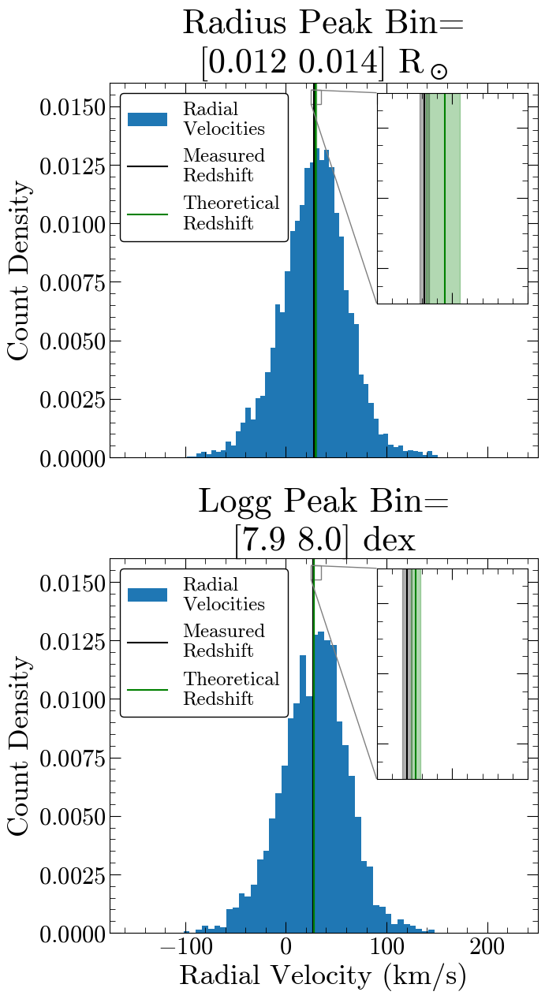

Radius
Measured Redshift=28.2 pm 0.3 km/s
Theory Redshift=29.5 ^30.5 _28.3 km/s

Logg
Measured Redshift=27.0 pm 0.3 km/s
Theory Redshift=27.6 ^27.9 _27.3 km/s


In [35]:
plot_peak_comparison(Eos_tab_rad_avg,Eos_tab_logg_avg,savefig=False)

### Plot these results for all data runs to check for consistency across bias corrections

The data points do wiggle around a bit, but they do so within the error bars.

The general agreement between the measurements and theory does not change

0


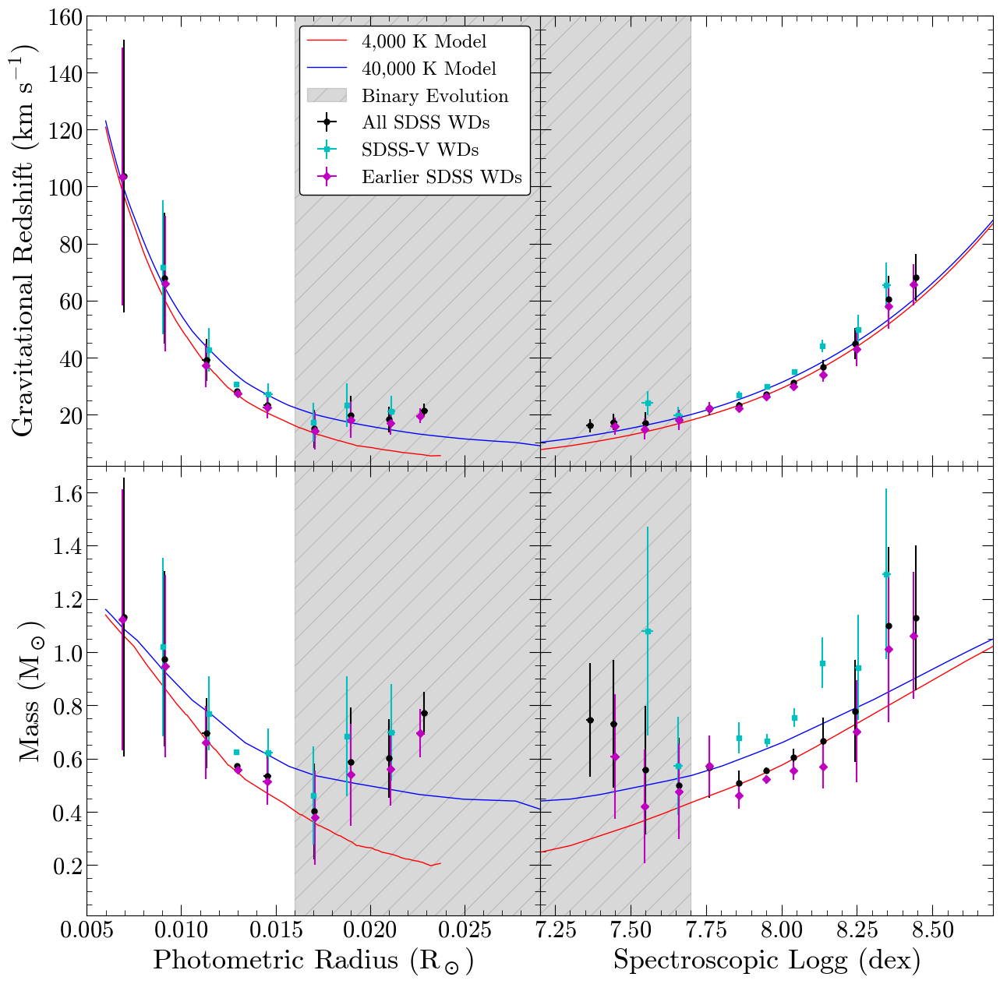

1


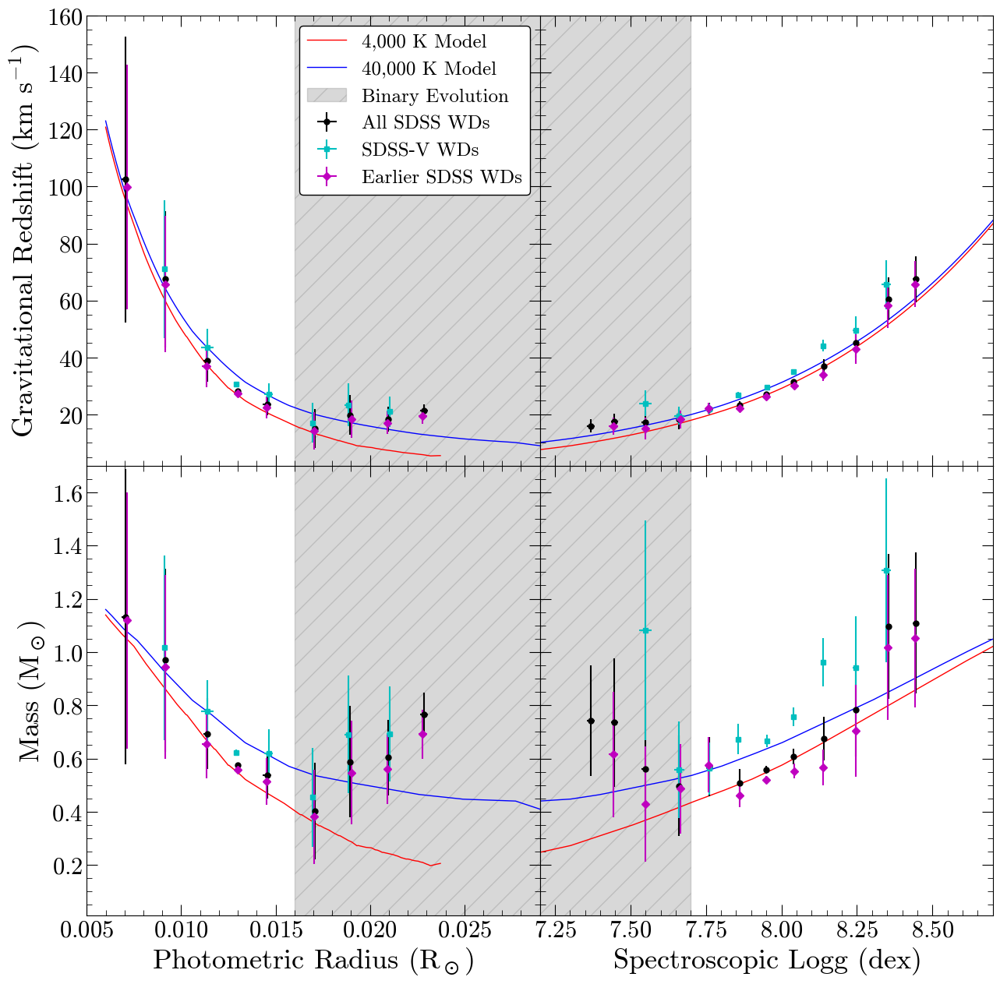

2


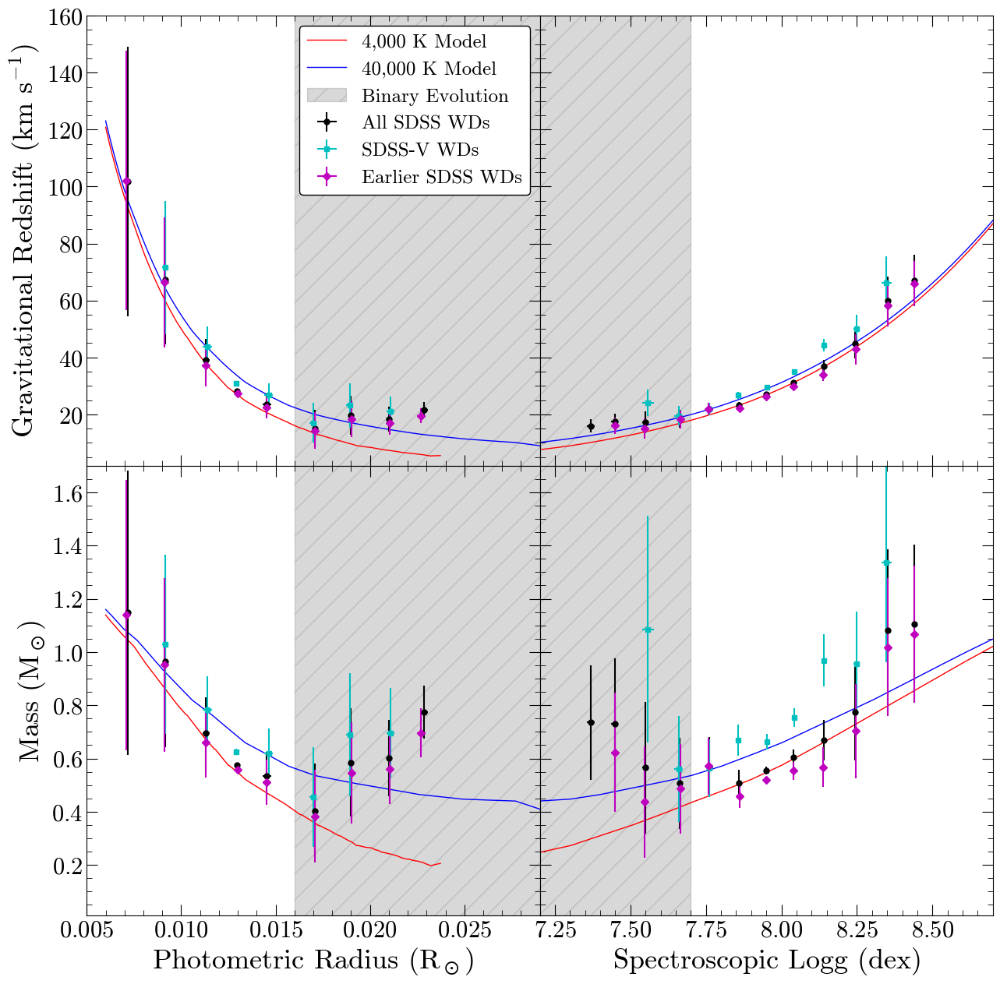

3


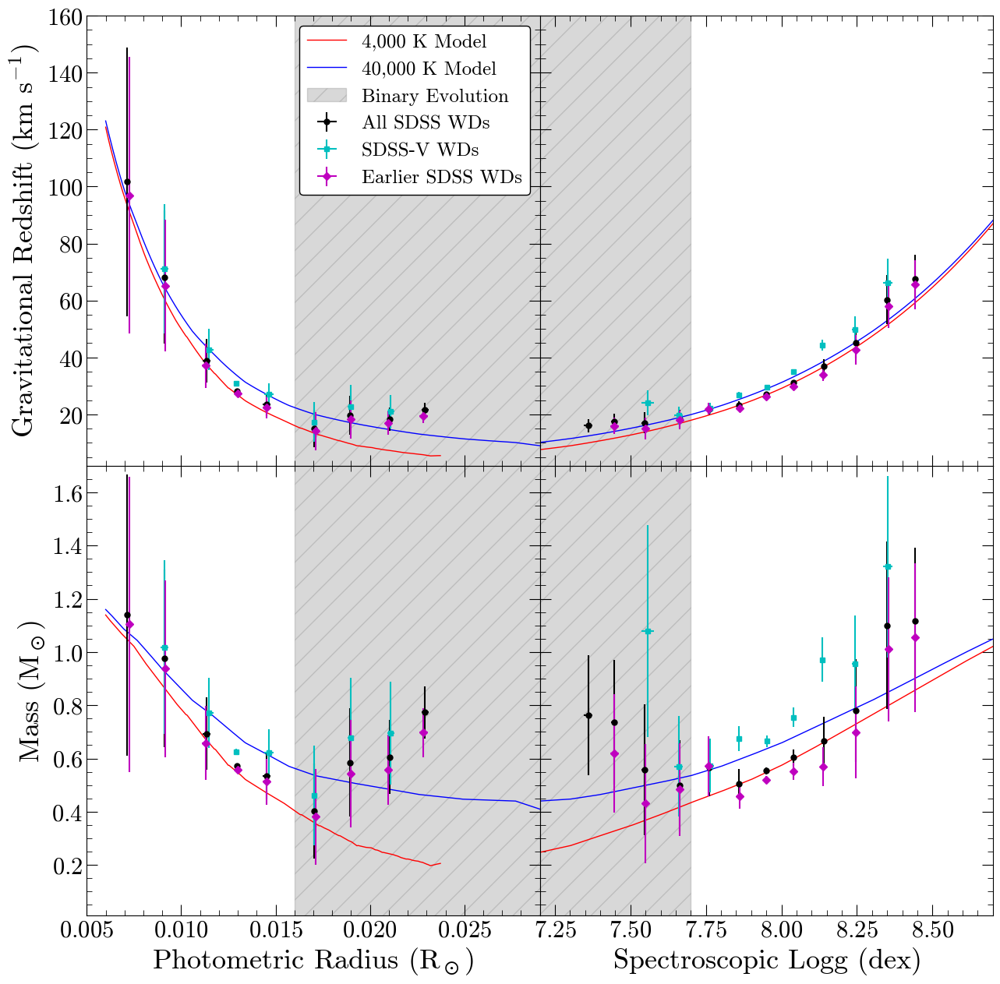

4


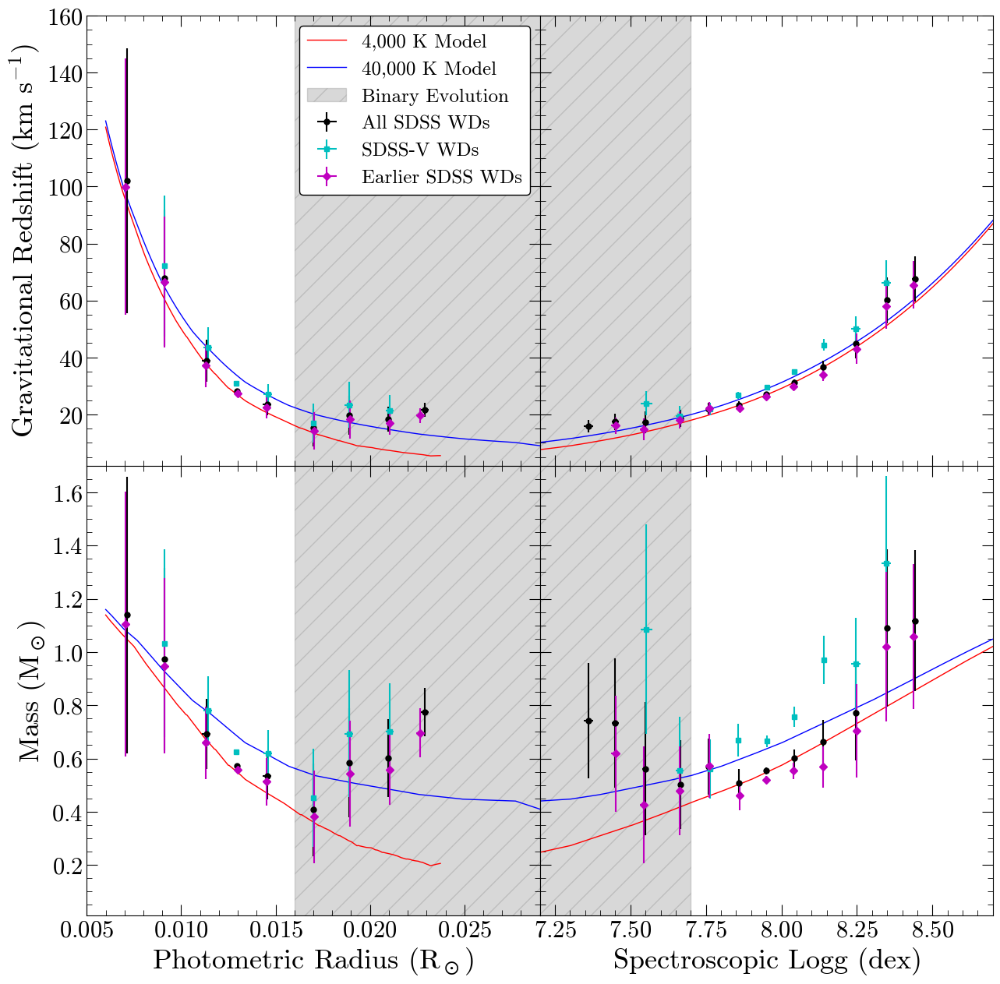

5


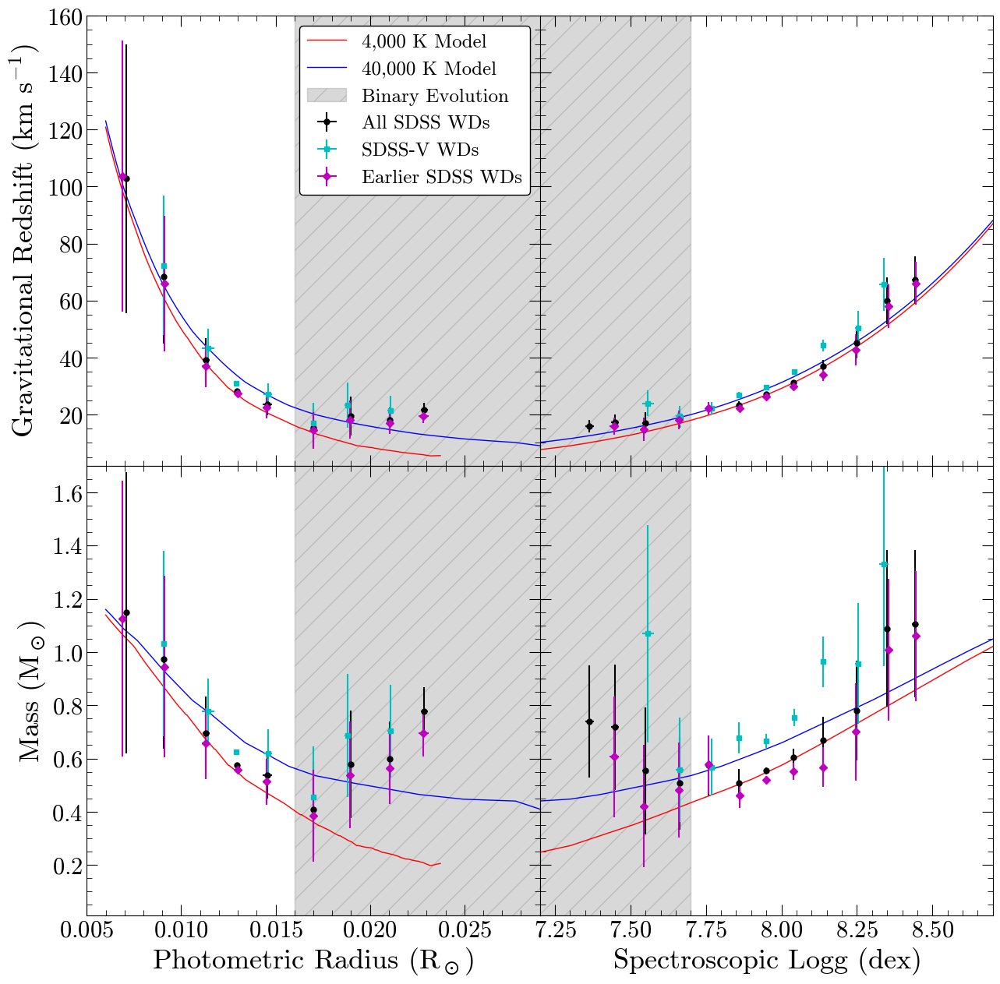

6


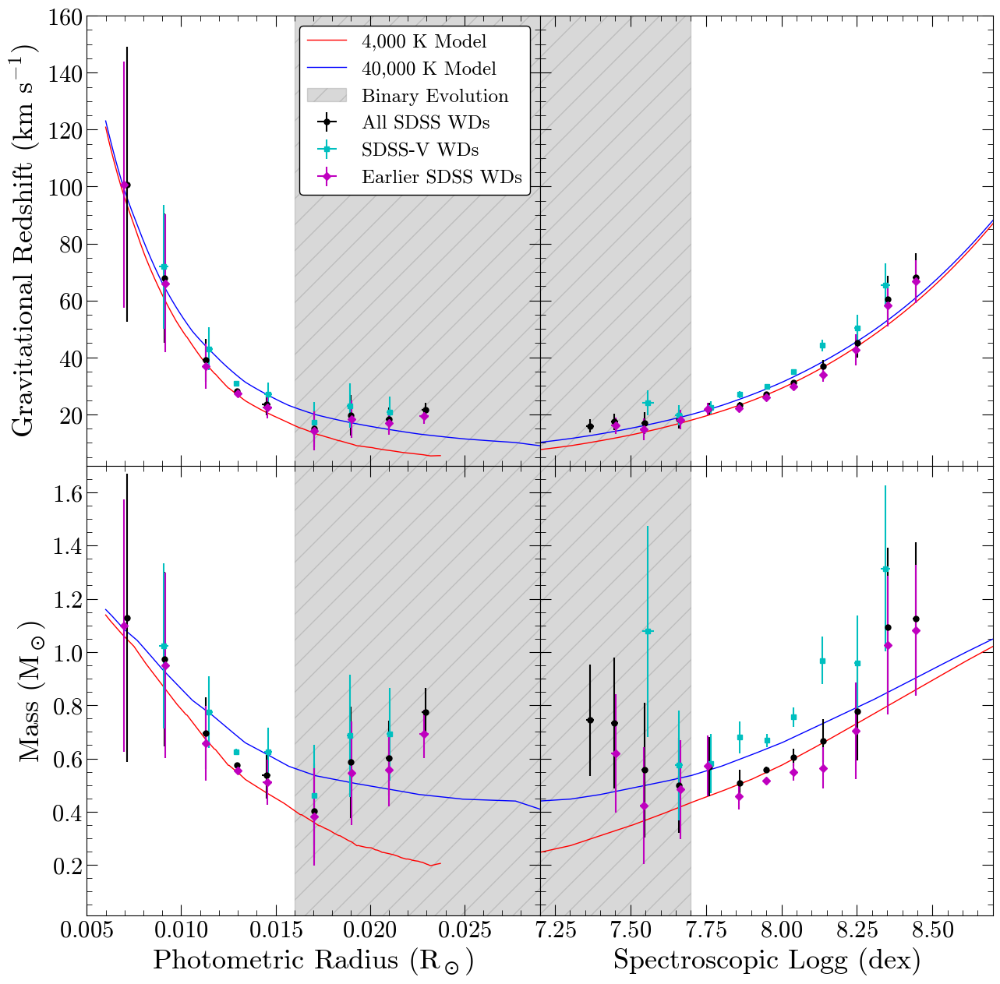

7


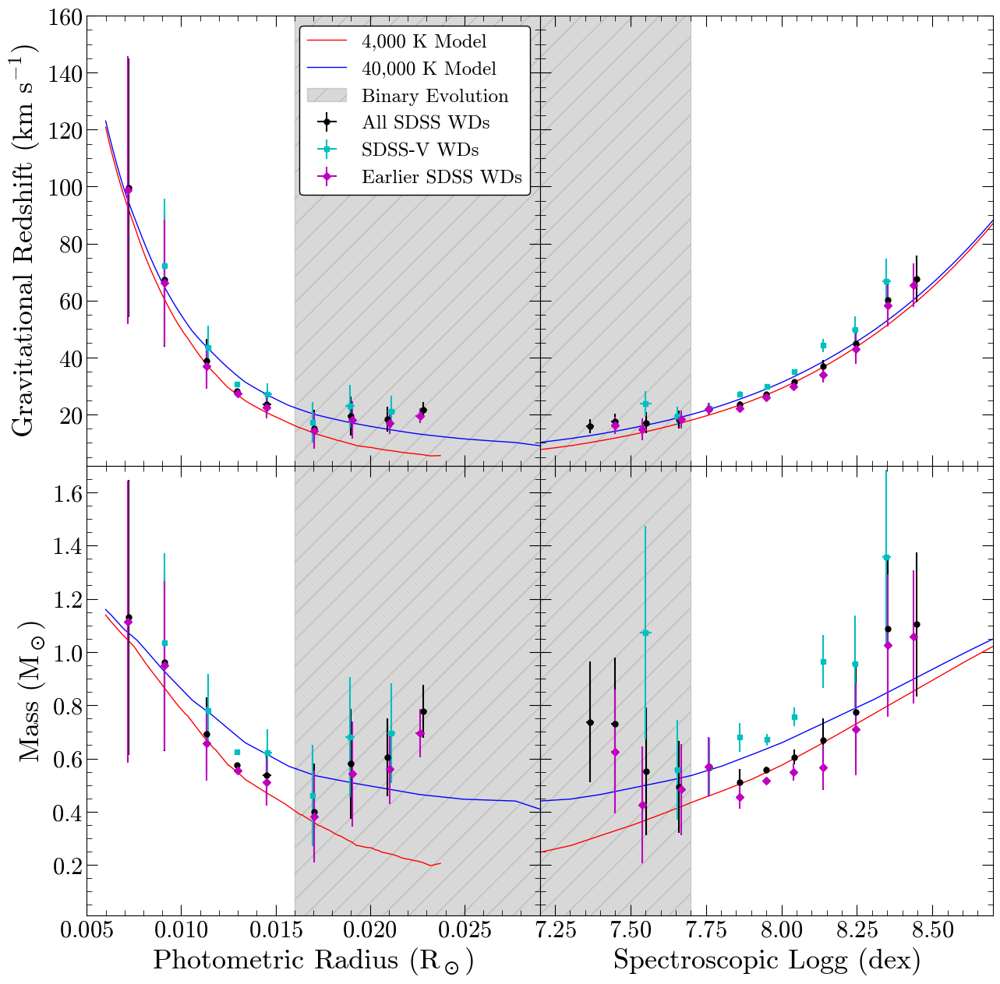

8


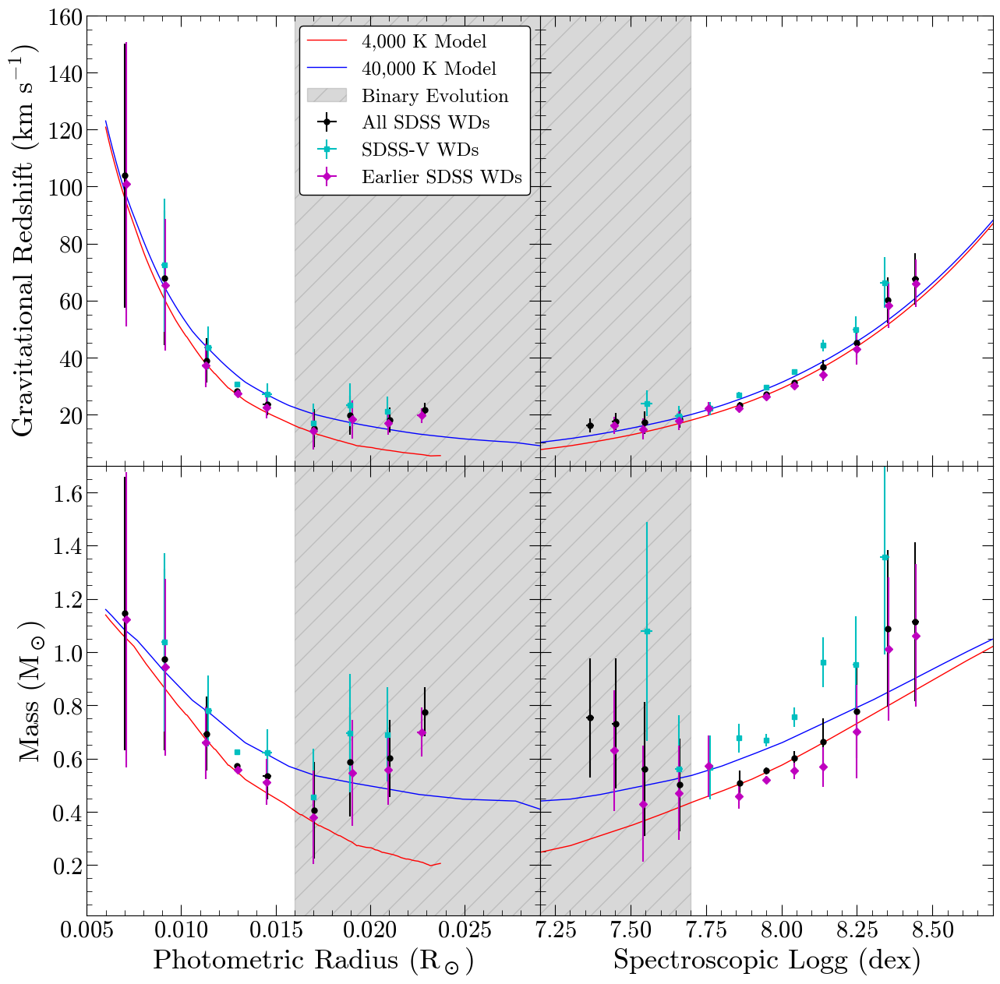

9


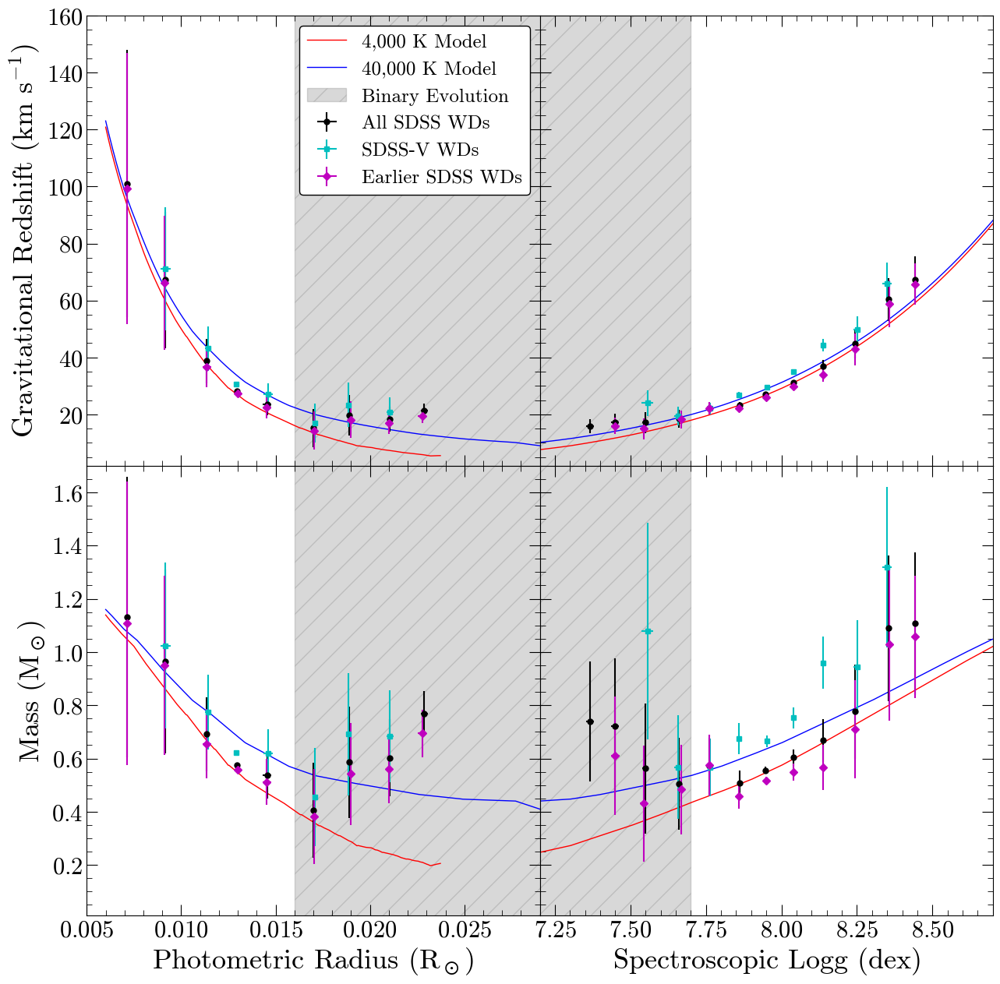

In [36]:
for run in runs:
    print(run)
    Eos_tab_rad_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Eos_tab_rad_avg.csv')
    Eos_tab_logg_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Eos_tab_logg_avg.csv')
    
    plot_eos(Eos_tab_rad_avg,Eos_tab_logg_avg,'debias',50,radlim=[0.005,0.025],logglim=[7.2,8.7])

0


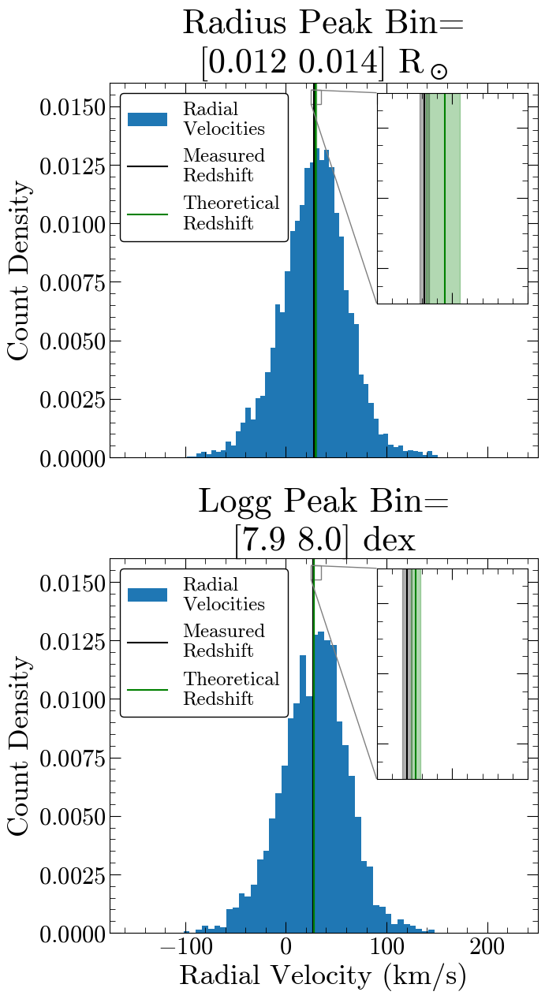

Radius
Measured Redshift=28.2 pm 0.3 km/s
Theory Redshift=29.5 ^30.5 _28.3 km/s

Logg
Measured Redshift=27.0 pm 0.3 km/s
Theory Redshift=27.6 ^27.9 _27.3 km/s
1


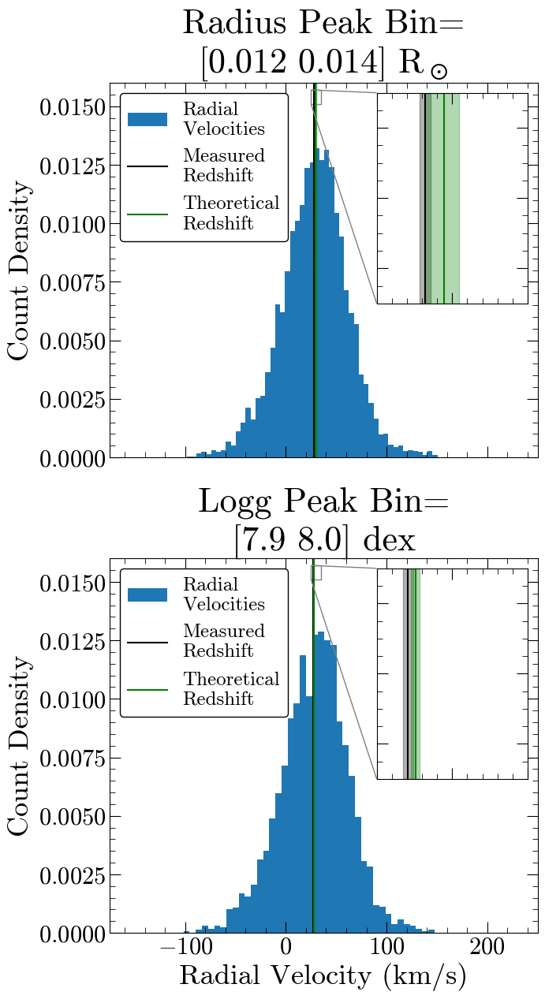

Radius
Measured Redshift=28.2 pm 0.4 km/s
Theory Redshift=29.5 ^30.5 _28.2 km/s

Logg
Measured Redshift=27.1 pm 0.3 km/s
Theory Redshift=27.6 ^27.9 _27.3 km/s
2


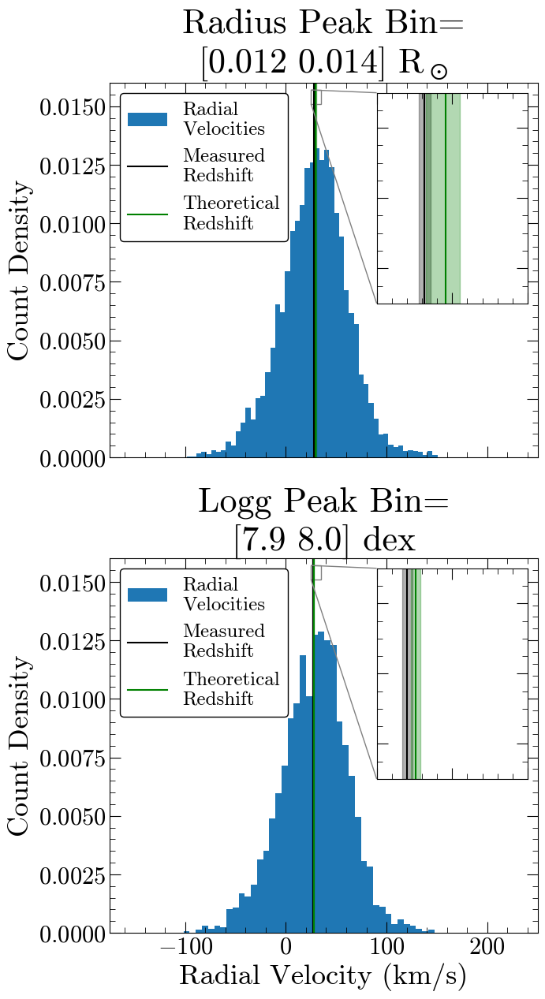

Radius
Measured Redshift=28.2 pm 0.4 km/s
Theory Redshift=29.5 ^30.5 _28.3 km/s

Logg
Measured Redshift=27.0 pm 0.3 km/s
Theory Redshift=27.6 ^27.9 _27.3 km/s
3


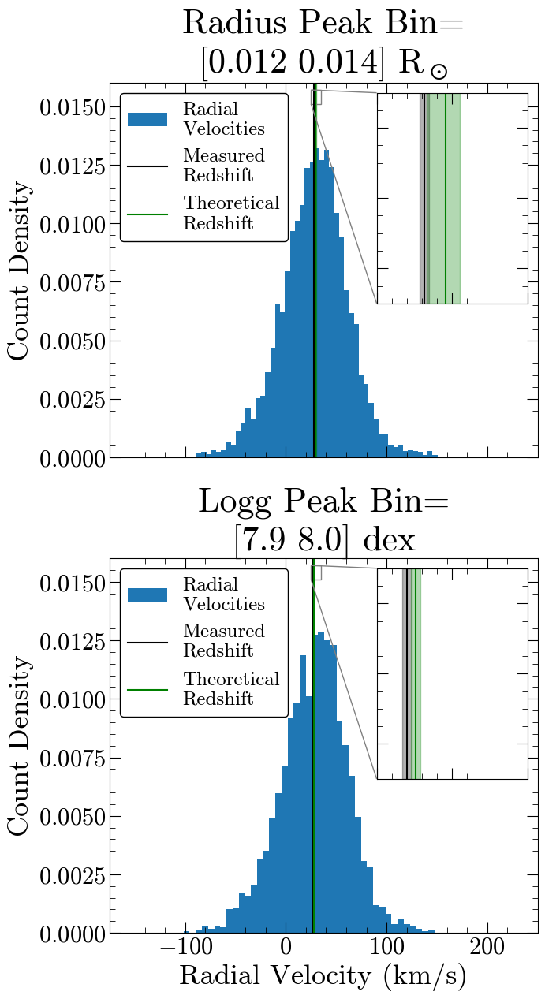

Radius
Measured Redshift=28.2 pm 0.3 km/s
Theory Redshift=29.5 ^30.5 _28.3 km/s

Logg
Measured Redshift=27.0 pm 0.3 km/s
Theory Redshift=27.6 ^27.9 _27.3 km/s
4


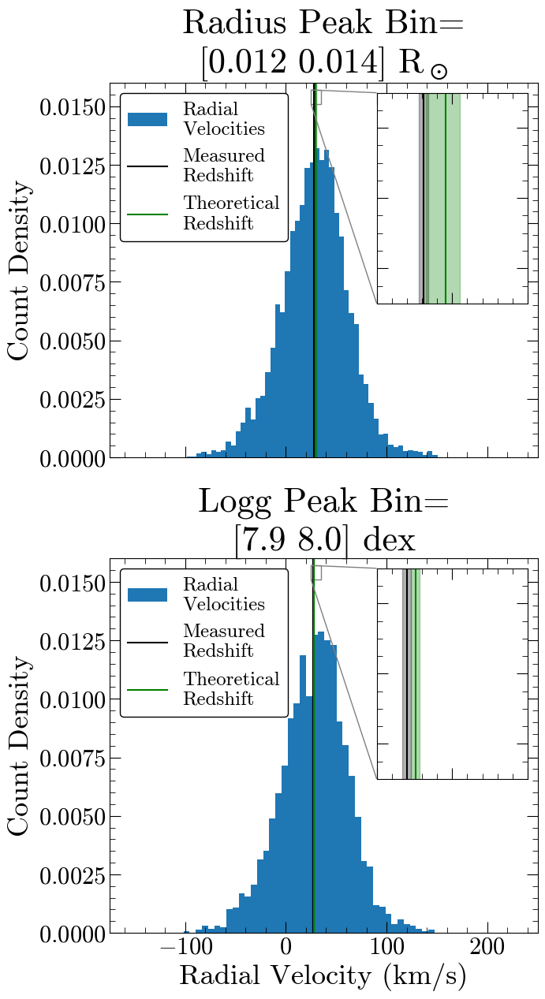

Radius
Measured Redshift=28.1 pm 0.3 km/s
Theory Redshift=29.5 ^30.5 _28.3 km/s

Logg
Measured Redshift=27.0 pm 0.3 km/s
Theory Redshift=27.6 ^27.9 _27.3 km/s
5


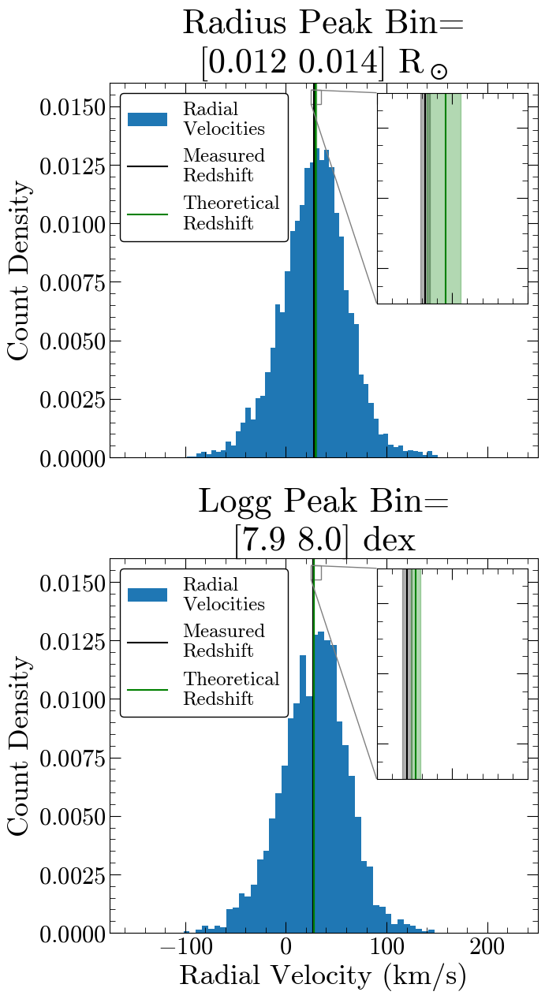

Radius
Measured Redshift=28.2 pm 0.3 km/s
Theory Redshift=29.6 ^30.6 _28.3 km/s

Logg
Measured Redshift=27.0 pm 0.3 km/s
Theory Redshift=27.6 ^27.9 _27.3 km/s
6


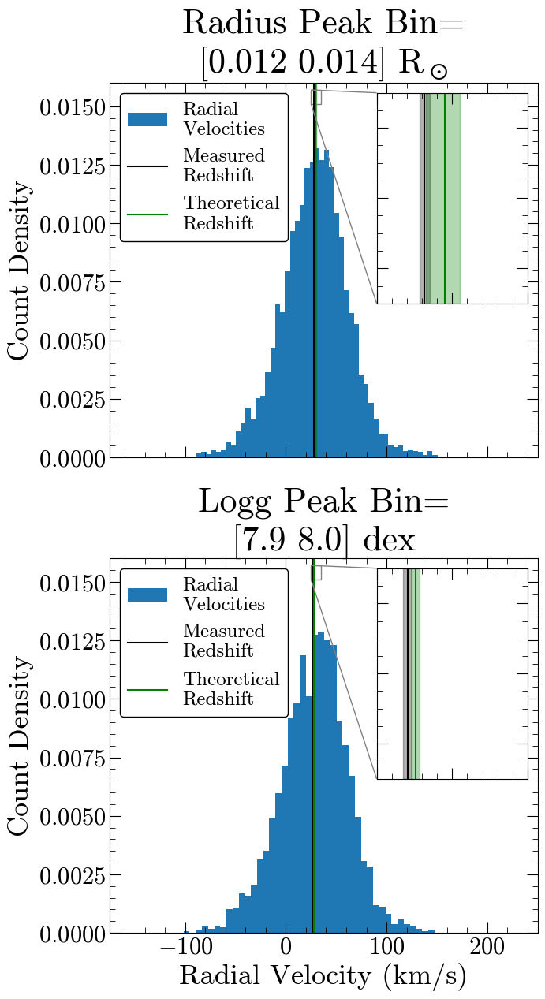

Radius
Measured Redshift=28.2 pm 0.3 km/s
Theory Redshift=29.5 ^30.5 _28.3 km/s

Logg
Measured Redshift=27.0 pm 0.3 km/s
Theory Redshift=27.6 ^27.9 _27.3 km/s
7


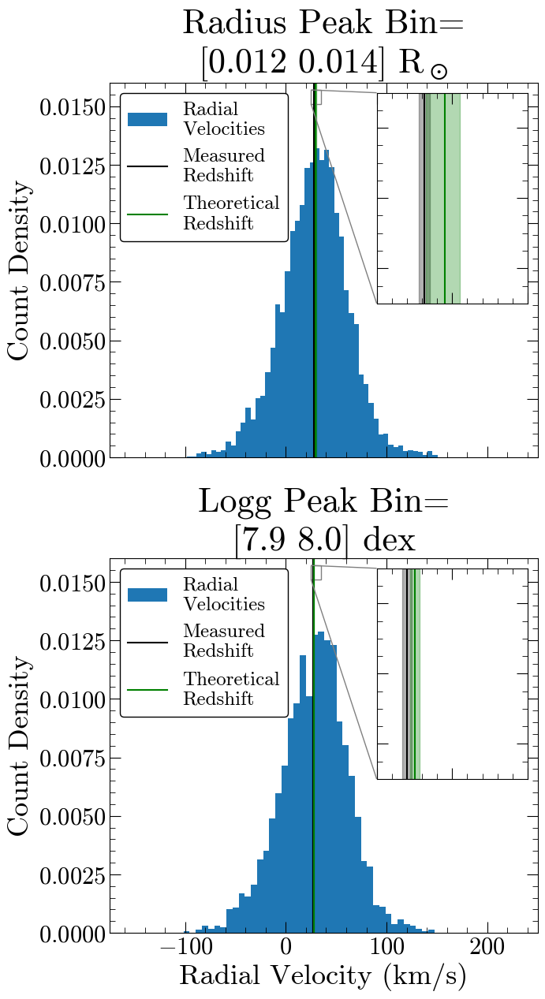

Radius
Measured Redshift=28.2 pm 0.4 km/s
Theory Redshift=29.5 ^30.5 _28.3 km/s

Logg
Measured Redshift=27.0 pm 0.3 km/s
Theory Redshift=27.5 ^27.8 _27.2 km/s
8


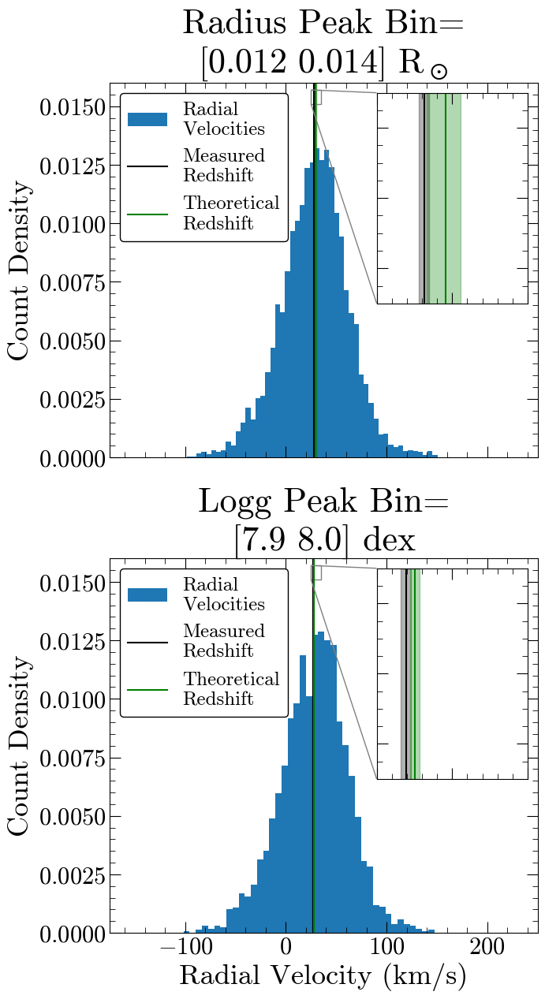

Radius
Measured Redshift=28.1 pm 0.3 km/s
Theory Redshift=29.6 ^30.5 _28.3 km/s

Logg
Measured Redshift=26.9 pm 0.3 km/s
Theory Redshift=27.5 ^27.8 _27.2 km/s
9


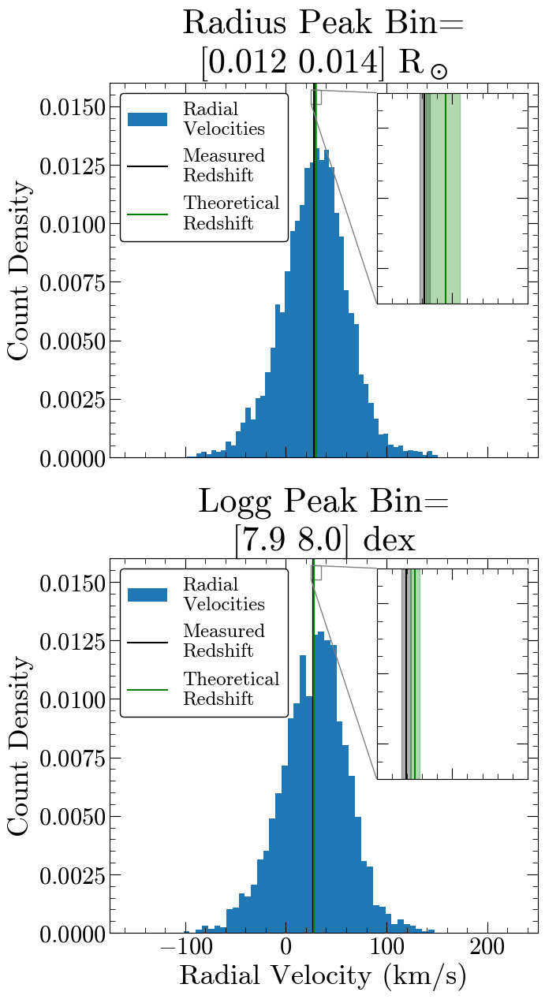

Radius
Measured Redshift=28.2 pm 0.4 km/s
Theory Redshift=29.5 ^30.5 _28.3 km/s

Logg
Measured Redshift=27.0 pm 0.3 km/s
Theory Redshift=27.5 ^27.8 _27.2 km/s


In [37]:
for run in runs:
    print(run)
    Eos_tab_rad_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Eos_tab_rad_avg.csv')
    Eos_tab_logg_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Eos_tab_logg_avg.csv')
    
    plot_peak_comparison(Eos_tab_rad_avg,Eos_tab_logg_avg,savefig=False)


## Temperature Dependence 

In [38]:
def plot_teff_eos(table_phot,table_spec,SDSSType,key,num_obs_per_bin=None,radlim=None,logglim=None,title=True,savefig=False):
    #SDSSType='SDSSV','eSDSS', or 'All'
    #key = 'LSR' for LSR-corrected RVs
    #key = 'asym' for LSR-corrected+Asymmetric drift-corrected RVs
    #key = 'debias' for LSR-corrected+Asymmetric drift+sharp peak bias-corrected RVs
    
    fig, ((ax1,ax2),(ax4,ax5)) =plt.subplots(2,2,figsize=(15,15))
    plt.style.use('stefan.mplstyle')
    
    #crop all the tables to have only bins with num_obs_per_bin>threshold
    table_phot_cool=table_phot.query('num_obs_per_bin_cool_'+SDSSType+'_'+key+'>@num_obs_per_bin')
    table_phot_warm=table_phot.query('num_obs_per_bin_warm_'+SDSSType+'_'+key+'>@num_obs_per_bin')
    
    table_spec_cool=table_spec.query('num_obs_per_bin_cool_'+SDSSType+'_'+key+'>@num_obs_per_bin')
    table_spec_warm=table_spec.query('num_obs_per_bin_warm_'+SDSSType+'_'+key+'>@num_obs_per_bin')
    
    tables=[table_phot_cool,table_phot_warm,table_spec_cool,table_spec_warm]
    for table in tables:
        #reset the indices
        indices=np.arange(0,len(table))
        table.set_index(indices,inplace=True)

    #get theoretical R-vg relation
    theo_radii = np.linspace(0.006,0.04, 1000)
    theo_vg_r_lowT = theo_vg_from_r_teff(theo_radii, 4000)
    theo_vg_r_highT = theo_vg_from_r_teff(theo_radii, 40000)
    #plot theoretical R-vg relation
    ax1.plot(theo_radii, theo_vg_r_lowT, 'red', linestyle = '-', label = '4,000 K Model', linewidth = 1)
    ax1.plot(theo_radii, theo_vg_r_highT, 'blue', label = '40,000 K Model', linewidth = 1)
    #plot data
    ax1.errorbar(table_phot_cool['mean_radii_cool_'+SDSSType+'_'+key],table_phot_cool['mean_RVs_cool_'+SDSSType+'_'+key],
                 xerr=table_phot_cool['e_mean_radii_cool_'+SDSSType+'_'+key],yerr=table_phot_cool['e_mean_RVs_cool_'+SDSSType+'_'+key],fmt='ro',label='Cool WDs')
    ax1.errorbar(table_phot_warm['mean_radii_warm_'+SDSSType+'_'+key],table_phot_warm['mean_RVs_warm_'+SDSSType+'_'+key],
                 xerr=table_phot_warm['e_mean_radii_warm_'+SDSSType+'_'+key],yerr=table_phot_warm['e_mean_RVs_warm_'+SDSSType+'_'+key],fmt='bo',label='Warm WDs')
    #exclude Binary Evolution
    ax1.axvspan(0.016, 0.045, hatch ='/', color = 'grey', alpha = 0.3,label='Binary Evolution')
    ax1.legend()
    #ax1.set_xlabel('Photometric Radius ($R_\odot$)')
    ax1.set_ylabel('Gravitational Redshift ($km$ $s^{-1}$)')
    if radlim!=None:
        ax1.set_xlim(radlim[0],radlim[1])
    
    #get theoretical logg-vg relation
    theo_loggs = np.linspace(7,9, 1000)
    theo_vg_logg_lowT = theo_vg_from_logg_teff(theo_loggs, 4000)
    theo_vg_logg_highT = theo_vg_from_logg_teff(theo_loggs, 40000)
    #plot theoretical logg-vg relation
    ax2.plot(theo_loggs, theo_vg_logg_lowT, 'red', linestyle = '-', label = '4,000 K Model', linewidth = 1)
    ax2.plot(theo_loggs, theo_vg_logg_highT, 'blue', label = '40,000 K Model', linewidth = 1)
    #plot data
    ax2.errorbar(table_spec_cool['mean_loggs_cool_'+SDSSType+'_'+key],table_spec_cool['mean_RVs_cool_'+SDSSType+'_'+key],
                 xerr=table_spec_cool['e_mean_loggs_cool_'+SDSSType+'_'+key],yerr=table_spec_cool['e_mean_RVs_cool_'+SDSSType+'_'+key],fmt='ro',label='Cool WDs')
    ax2.errorbar(table_spec_warm['mean_loggs_warm_'+SDSSType+'_'+key],table_spec_warm['mean_RVs_warm_'+SDSSType+'_'+key],
                 xerr=table_spec_warm['e_mean_loggs_warm_'+SDSSType+'_'+key],yerr=table_spec_warm['e_mean_RVs_warm_'+SDSSType+'_'+key],fmt='bo',label='Warm WDs')
    #exclude Binary Evolution
    ax2.axvspan(6.9, 7.7, hatch ='/', color = 'grey', alpha = 0.3,label='Binary Evolution')
    #ax2.set_xlabel('Spectroscopic Logg ($dex$)')
    #ax2.set_ylabel('Gravitational Redshift ($km$ $s^{-1}$)')
    if logglim!=None:
        ax2.set_xlim(logglim[0],logglim[1])
    
    #plot theoretical M-R relation
    ax4.plot(theo_radii, theo_m_from_vg_r(theo_vg_r_lowT, theo_radii), 'red', linestyle = '-', label = '4,000 K Model', linewidth = 1)
    ax4.plot(theo_radii, theo_m_from_vg_r(theo_vg_r_highT, theo_radii), 'blue', label = '40,000 K Model', linewidth = 1)
    #plot data
    ax4.errorbar(table_phot_cool['mean_radii_cool_'+SDSSType+'_'+key],table_phot_cool['mass_cool_'+SDSSType+'_'+key],
                 xerr=table_phot_cool['e_mean_radii_cool_'+SDSSType+'_'+key],yerr=table_phot_cool['e_mass_cool_'+SDSSType+'_'+key],fmt='ro',label='Cool WDs')
    ax4.errorbar(table_phot_warm['mean_radii_warm_'+SDSSType+'_'+key],table_phot_warm['mass_warm_'+SDSSType+'_'+key],
                 xerr=table_phot_warm['e_mean_radii_warm_'+SDSSType+'_'+key],yerr=table_phot_warm['e_mass_warm_'+SDSSType+'_'+key],fmt='bo',label='Warm WDs')
    #exclude Binary Evolution
    ax4.axvspan(0.016, 0.045, hatch ='/', color = 'grey', alpha = 0.3,label='Binary Evolution')
    ax4.set_xlabel('Photometric Radius ($R_\odot$)')
    ax4.set_ylabel('Mass ($M_\odot$)')
    if radlim!=None:
        ax4.set_xlim(radlim[0],radlim[1])
    
    #plot theoretical M-logg relation
    ax5.plot(theo_loggs, theo_m_from_vg_logg(theo_vg_logg_lowT, theo_loggs), 'red', linestyle = '-', label = '4,000 K Model', linewidth = 1)
    ax5.plot(theo_loggs, theo_m_from_vg_logg(theo_vg_logg_highT, theo_loggs), 'blue', label = '40,000 K Model', linewidth = 1)
    #plot data
    ax5.errorbar(table_spec_cool['mean_loggs_cool_'+SDSSType+'_'+key],table_spec_cool['mass_cool_'+SDSSType+'_'+key],
                 xerr=table_spec_cool['e_mean_loggs_cool_'+SDSSType+'_'+key],yerr=table_spec_cool['e_mass_cool_'+SDSSType+'_'+key],fmt='ro',label='Cool WDs')
    ax5.errorbar(table_spec_warm['mean_loggs_warm_'+SDSSType+'_'+key],table_spec_warm['mass_warm_'+SDSSType+'_'+key],
                 xerr=table_spec_warm['e_mean_loggs_warm_'+SDSSType+'_'+key],yerr=table_spec_warm['e_mass_warm_'+SDSSType+'_'+key],fmt='bo',label='Warm WDs')
    #exclude Binary Evolution
    ax5.axvspan(6.9, 7.7, hatch ='/', color = 'grey', alpha = 0.3,label='Binary Evolution')
    ax5.set_xlabel('Spectroscopic Logg ($dex$)')
    #ax5.set_ylabel('Spectroscopic Mass ($M_\odot$)')
    if logglim!=None:
        ax5.set_xlim(logglim[0],logglim[1])
        
    #make x limits consistent
    ax1.set_xlim(0.005,0.029)
    ax4.set_xlim(0.005,0.029)
    ax2.set_xlim(7.2,8.7)
    ax5.set_xlim(7.2,8.7)
    #make y limits consistent
    ax1.set_ylim(2,160)
    ax2.set_ylim(2,160)
    ax4.set_ylim(0.01,1.7)
    ax5.set_ylim(0.01,1.7)
    #hide tick labels
    ax2.yaxis.set_ticklabels([])
    ax5.yaxis.set_ticklabels([])
    ax1.xaxis.set_ticklabels([])
    ax2.xaxis.set_ticklabels([])
    
    plt.subplots_adjust(wspace = 0,hspace=0)
    
    if title==True:
        if SDSSType=='All':
            fig.suptitle("All SDSS WDs",fontsize=40,y=0.93)
        if SDSSType=='SDSSV':
            fig.suptitle("SDSS-V WDs",fontsize=40,y=0.93)
        if SDSSType=='eSDSS':
            fig.suptitle("Earlier SDSS WDs",fontsize=40,y=0.93)
            
    if savefig==True:    
        plt.savefig('teff_eos_'+SDSSType+'_'+key+'.pdf', dpi=300)
    else:
        plt.show()
        

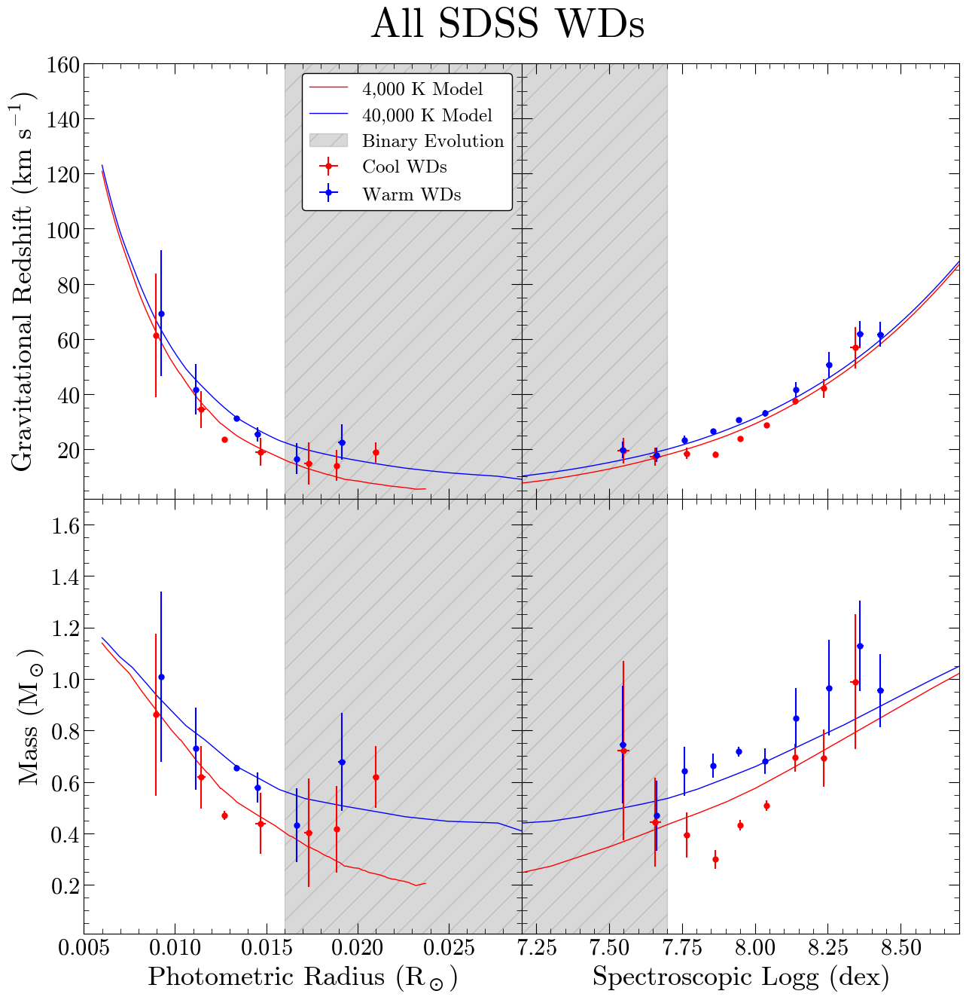

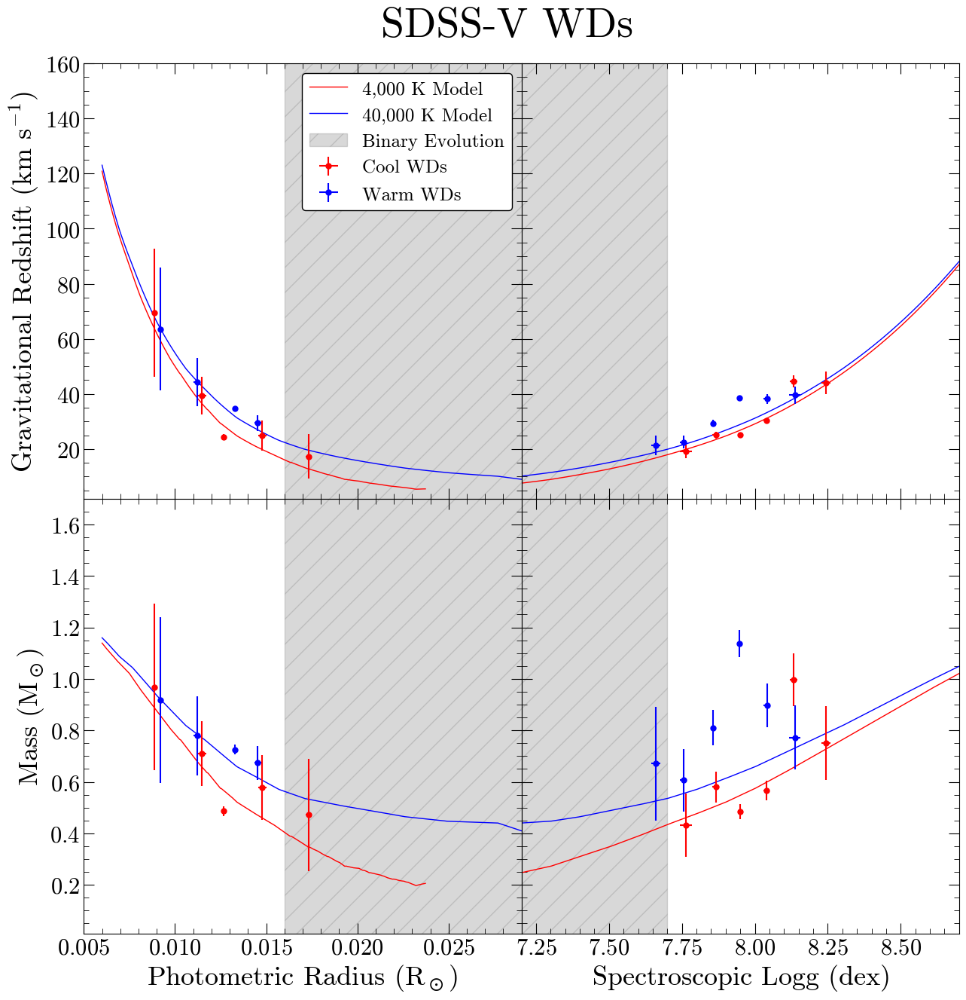

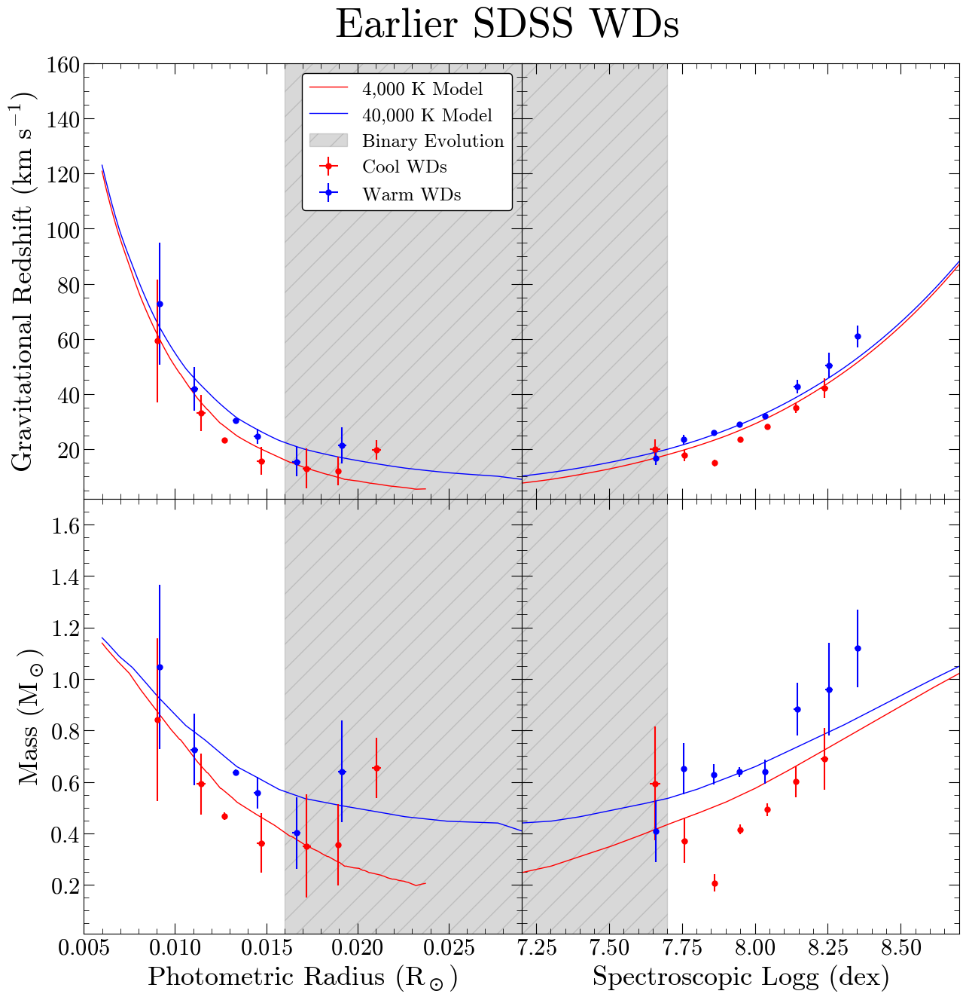

In [39]:
plot_teff_eos(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,'All','debias',50,radlim=[0.005,0.025],logglim=[7.2,8.7])
plot_teff_eos(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,'SDSSV','debias',50,radlim=[0.005,0.025],logglim=[7.2,8.7])
plot_teff_eos(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,'eSDSS','debias',50,radlim=[0.005,0.025],logglim=[7.2,8.7])

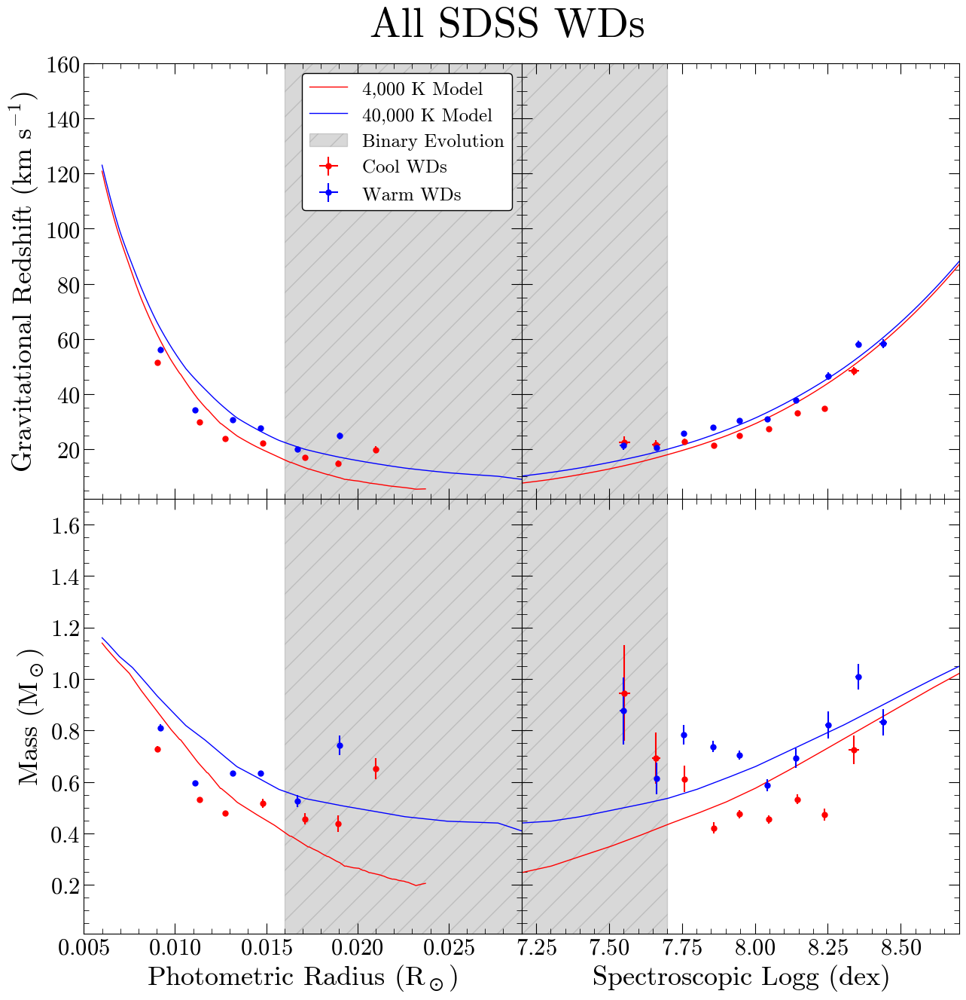

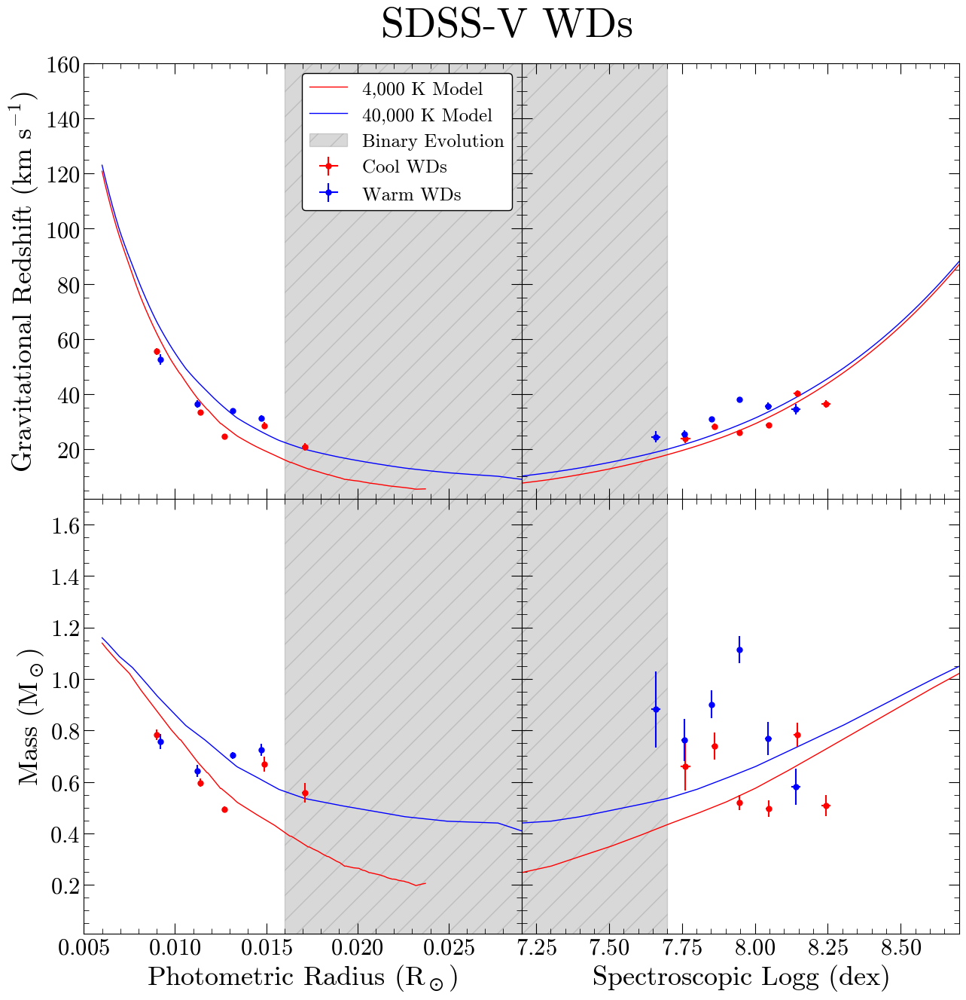

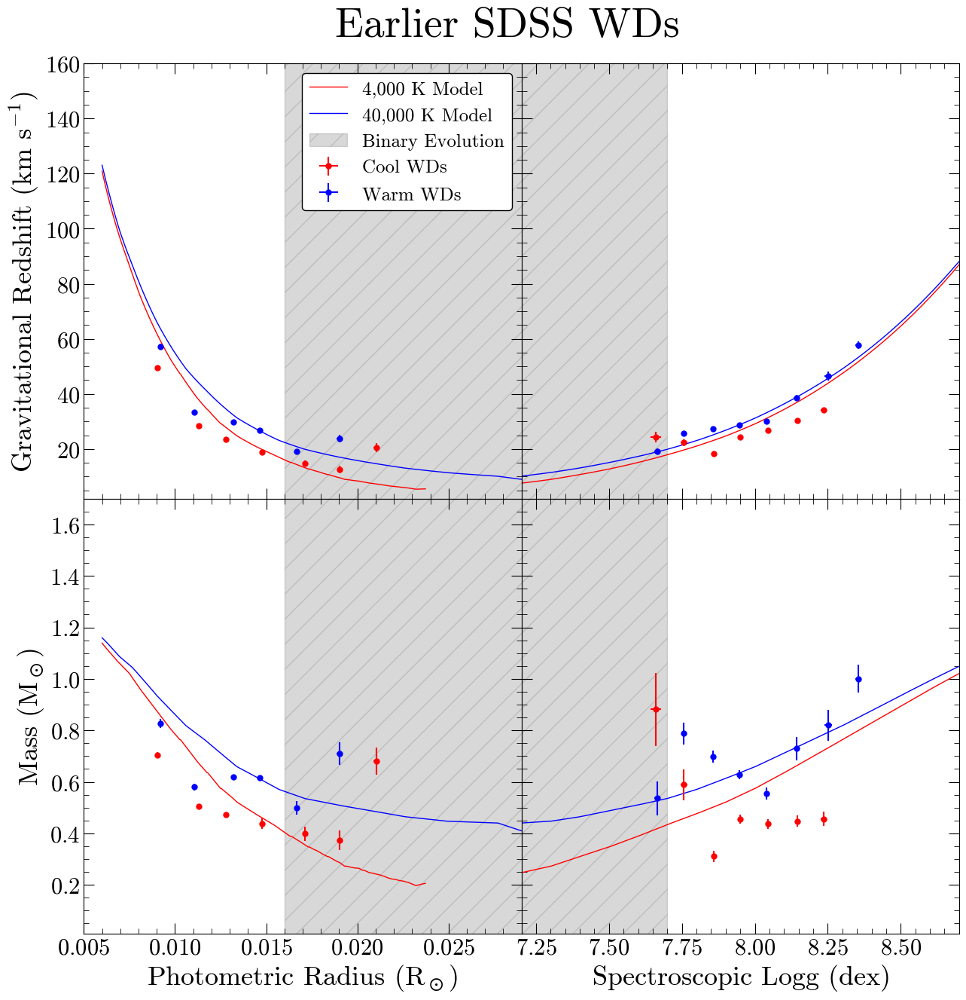

In [40]:
plot_teff_eos(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,'All','asym',50,radlim=[0.005,0.025],logglim=[7.2,8.7])
plot_teff_eos(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,'SDSSV','asym',50,radlim=[0.005,0.025],logglim=[7.2,8.7])
plot_teff_eos(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,'eSDSS','asym',50,radlim=[0.005,0.025],logglim=[7.2,8.7])

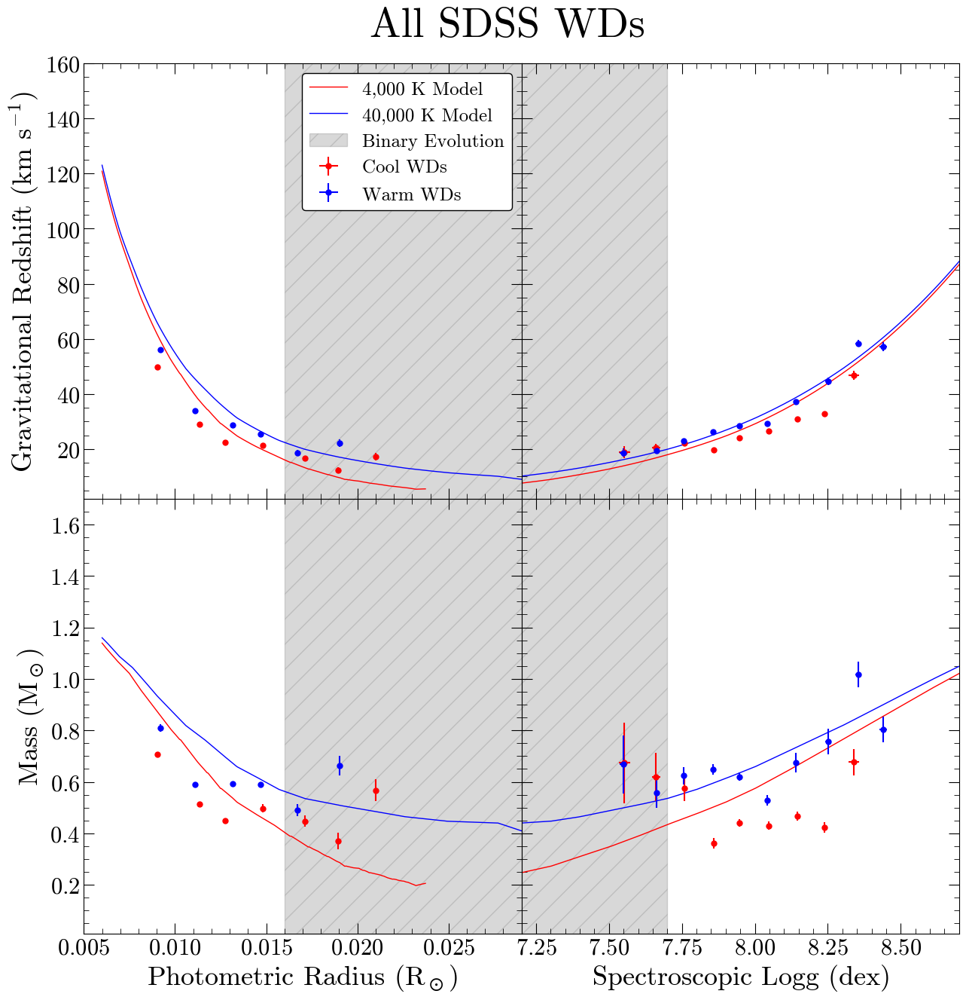

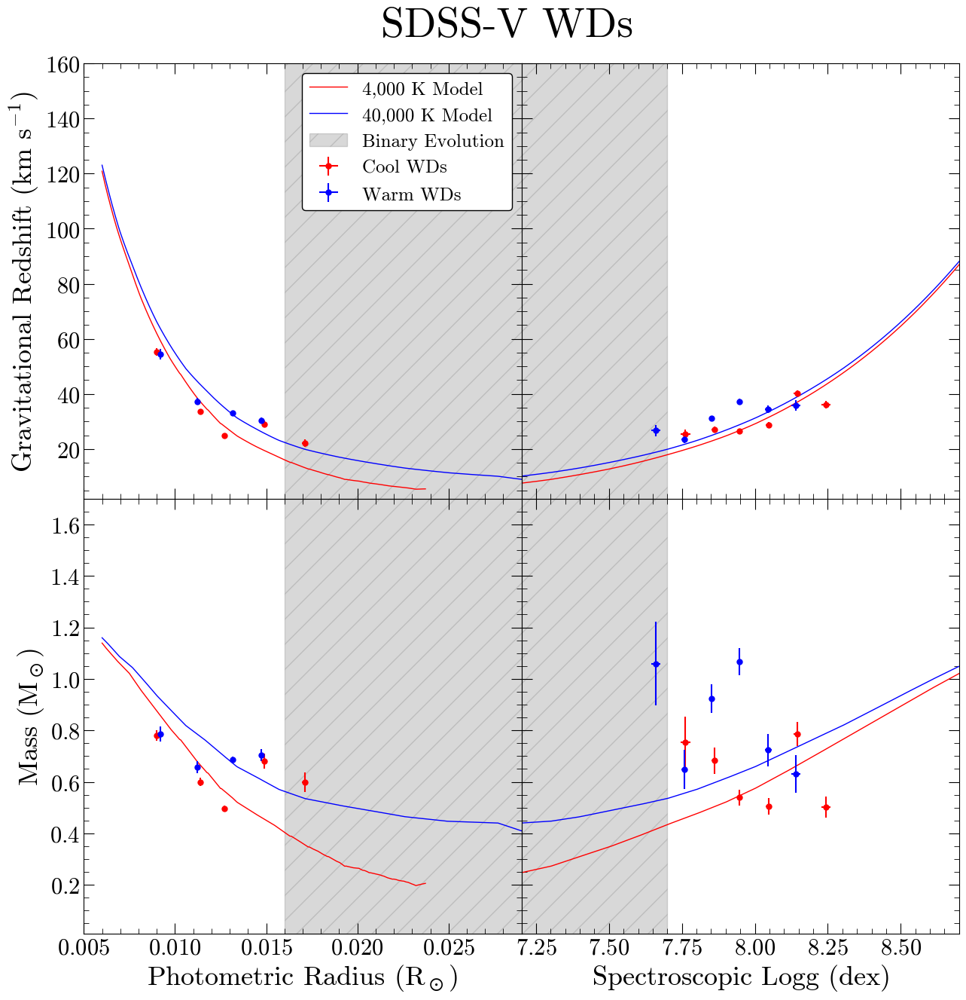

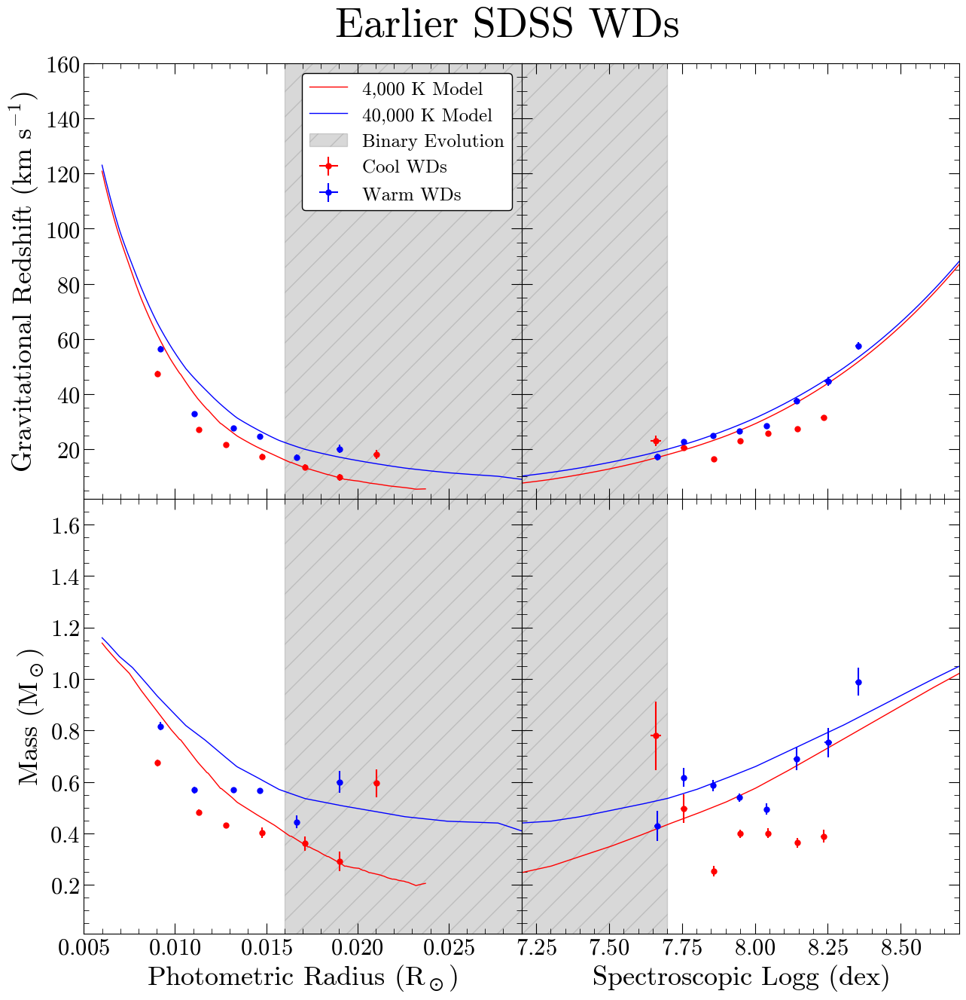

In [41]:
plot_teff_eos(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,'All','LSR',50,radlim=[0.005,0.025],logglim=[7.2,8.7])
plot_teff_eos(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,'SDSSV','LSR',50,radlim=[0.005,0.025],logglim=[7.2,8.7])
plot_teff_eos(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,'eSDSS','LSR',50,radlim=[0.005,0.025],logglim=[7.2,8.7])

### Temperature dependence at peak

In [42]:
def teff_get_peak_info(param,peak_temp,teff_Eos_tab_rad_avg,teff_Eos_tab_logg_avg):
    #param='radius','logg'
    #peak_temp='cool', 'warm' to indicate which peak you want (sometimes peaks might fall into different bins)
    
    key='All'
    
    if peak_temp=='cool':
        temps=['cool','warm']
    if peak_temp=='warm':
        temps=['warm','cool']
        
    cool_lim=11000
    warm_lim=16000
    if param=='radius':
        temp=temps[0]
        #get peak location
        peak_num=max(teff_Eos_tab_rad_avg['num_obs_per_bin_'+temp+'_'+key+'_debias'])
        peak_tab=teff_Eos_tab_rad_avg.query('num_obs_per_bin_'+temp+'_'+key+'_debias==@peak_num')
        #get peak bin number
        binnum=peak_tab['radius_bin_id'].to_list()[0]
        #get peak rad
        peak_param1=peak_tab['mean_radii_'+temp+'_'+key+'_debias'].to_list()[0]
        e_peak_param1=peak_tab['e_mean_radii_'+temp+'_'+key+'_debias'].to_list()[0]
        #get peak rad grav redshift and error on peak grav redshift (neglect uncertainty on mean peak rad)
        peak_vg1=peak_tab['mean_RVs_'+temp+'_'+key+'_debias'].to_list()[0]
        e_peak_vg1=peak_tab['e_mean_RVs_'+temp+'_'+key+'_debias'].to_list()[0]
        #get all data in that bin
        if temp=='cool':
            all_dat_tab=Eos_tab.query('teff_phot<@cool_lim')
        if temp=='warm':
            all_dat_tab=Eos_tab.query('teff_phot>@warm_lim')
        all_dat_tab1=all_dat_tab.query('radius_bin_id==@binnum')
        #get mean photometric temperature
        mean_teff1=np.mean(all_dat_tab1['teff_phot'])
        std_teff1=np.std(all_dat_tab1['teff_phot'])
        #get info for other temperature sample
        temp=temps[1]
        #get peak rad
        peak_param2=peak_tab['mean_radii_'+temp+'_'+key+'_debias'].to_list()[0]
        e_peak_param2=peak_tab['e_mean_radii_'+temp+'_'+key+'_debias'].to_list()[0]
        #get peak rad grav redshift and error on peak grav redshift (neglect uncertainty on mean peak rad)
        peak_vg2=peak_tab['mean_RVs_'+temp+'_'+key+'_debias'].to_list()[0]
        e_peak_vg2=peak_tab['e_mean_RVs_'+temp+'_'+key+'_debias'].to_list()[0]
        #get all data in that bin
        if temp=='cool':
            all_dat_tab=Eos_tab.query('teff_phot<@cool_lim')
        if temp=='warm':
            all_dat_tab=Eos_tab.query('teff_phot>@warm_lim')
        all_dat_tab2=all_dat_tab.query('radius_bin_id==@binnum')
        #get mean photometric temperature
        mean_teff2=np.mean(all_dat_tab2['teff_phot'])
        std_teff2=np.std(all_dat_tab2['teff_phot'])
    if param=='logg':
        temp=temps[0]
        #get peak location
        peak_num=max(teff_Eos_tab_logg_avg['num_obs_per_bin_'+temp+'_'+key+'_debias'])
        peak_tab=teff_Eos_tab_logg_avg.query('num_obs_per_bin_'+temp+'_'+key+'_debias==@peak_num')
        #get peak bin number
        binnum=peak_tab['logg_bin_id'].to_list()[0]
        #get peak logg
        peak_param1=peak_tab['mean_loggs_'+temp+'_'+key+'_debias'].to_list()[0]
        e_peak_param1=peak_tab['e_mean_loggs_'+temp+'_'+key+'_debias'].to_list()[0]
        #get peak logg grav redshift and error on peak grav redshift (neglect uncertainty on mean peak logg)
        peak_vg1=peak_tab['mean_RVs_'+temp+'_'+key+'_debias'].to_list()[0]
        e_peak_vg1=peak_tab['e_mean_RVs_'+temp+'_'+key+'_debias'].to_list()[0]
        #get all data in that bin
        if temp=='cool':
            all_dat_tab=Eos_tab.query('teff_phot<@cool_lim')
        if temp=='warm':
            all_dat_tab=Eos_tab.query('teff_phot>@warm_lim')
        all_dat_tab1=all_dat_tab.query('logg_bin_id==@binnum')
        #get mean photometric temperature
        mean_teff1=np.mean(all_dat_tab1['teff_phot'])
        std_teff1=np.std(all_dat_tab1['teff_phot'])
        #get info for other temperature sample
        temp=temps[1]
        #get peak logg
        peak_param2=peak_tab['mean_loggs_'+temp+'_'+key+'_debias'].to_list()[0]
        e_peak_param2=peak_tab['e_mean_loggs_'+temp+'_'+key+'_debias'].to_list()[0]
        #get peak logg grav redshift and error on peak grav redshift (neglect uncertainty on mean peak logg)
        peak_vg2=peak_tab['mean_RVs_'+temp+'_'+key+'_debias'].to_list()[0]
        e_peak_vg2=peak_tab['e_mean_RVs_'+temp+'_'+key+'_debias'].to_list()[0]
        #get all data in that bin
        if temp=='cool':
            all_dat_tab=Eos_tab.query('teff_phot<@cool_lim')
        if temp=='warm':
            all_dat_tab=Eos_tab.query('teff_phot>@warm_lim')
        all_dat_tab2=all_dat_tab.query('logg_bin_id==@binnum')
        #get mean photometric temperature
        mean_teff2=np.mean(all_dat_tab2['teff_phot'])
        std_teff2=np.std(all_dat_tab2['teff_phot'])
    
    return(binnum,peak_param1,e_peak_param1,peak_vg1,e_peak_vg1,all_dat_tab1,mean_teff1,std_teff1,peak_param2,e_peak_param2,peak_vg2,e_peak_vg2,all_dat_tab2,mean_teff2,std_teff2)

In [43]:
def plot_peak_teff_comparison(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,savefig=False):

    #plot location of peak for radius and logg data from combined catalog
    
    fig, ((ax1),(ax2)) =plt.subplots(2,1,figsize=(7,14))#,sharey=True)
    
    #radius peak
    #calculate weighted mean radius and error on weighted mean radius
    rad_cool=Eos_tab_cool.drop_duplicates(subset='gaia_dr3_source_id')['radius_phot']
    rad_cool_weights=(1/Eos_tab_cool.drop_duplicates(subset='gaia_dr3_source_id')['e_radius_phot_full'])**2
    peak_rad_cool=np.average(rad_cool,weights=rad_cool_weights)
    e_peak_rad_cool=1/np.sqrt(np.sum(rad_cool_weights))
    rad_warm=Eos_tab_warm.drop_duplicates(subset='gaia_dr3_source_id')['radius_phot']
    rad_warm_weights=(1/Eos_tab_warm.drop_duplicates(subset='gaia_dr3_source_id')['e_radius_phot_full'])**2
    peak_rad_warm=np.average(rad_warm,weights=rad_warm_weights)
    e_peak_rad_warm=1/np.sqrt(np.sum(rad_warm_weights))
    #plot a histogram of all measured radii, divided by temperature
    #with shaded regions for our measured mean radius standard error divided by temeperature
    ax1.hist(Eos_tab_cool.drop_duplicates(subset='gaia_dr3_source_id')['radius_phot'],color='red',density=True,bins=r_bins,alpha=0.3,label='Cool\nRadii')
    ax1.axvline(peak_rad_cool,color='red',label='Cool\nPeak')
    ax1.axvspan(peak_rad_cool-e_peak_rad_cool, peak_rad_cool+e_peak_rad_cool, alpha=0.5, color='red')
    ax1.hist(Eos_tab_warm.drop_duplicates(subset='gaia_dr3_source_id')['radius_phot'],color='blue',density=True,bins=r_bins,alpha=0.3,label='Warm\nRadii')
    ax1.axvline(peak_rad_warm,color='blue',label='Warm\nPeak')
    ax1.axvspan(peak_rad_warm-e_peak_rad_warm, peak_rad_warm+e_peak_rad_warm, alpha=0.5, color='blue')
    ax1.set_xlim(0.001,0.03)
    ax1.set_ylim(0,300)
    ax1.set_xlabel('Measured Radius ($R_\odot$)')
    ax1.set_ylabel('Count Density')
    ax1.legend(fontsize=16,loc='upper left')
    #add insert to show behavior at peak
    axins1 = zoomed_inset_axes(ax1, 4, loc=1)
    axins1.hist(Eos_tab_cool.drop_duplicates(subset='gaia_dr3_source_id')['radius_phot'],color='red',density=True,bins=r_bins,alpha=0.3,label='Cool\nRadii')
    axins1.axvline(peak_rad_cool,color='red',label='Cool\nPeak')
    axins1.axvspan(peak_rad_cool-e_peak_rad_cool, peak_rad_cool+e_peak_rad_cool, alpha=0.5, color='red')
    axins1.hist(Eos_tab_warm.drop_duplicates(subset='gaia_dr3_source_id')['radius_phot'],color='blue',density=True,bins=r_bins,alpha=0.3,label='Warm\nRadii')
    axins1.axvline(peak_rad_warm,color='blue',label='Warm\nPeak')
    axins1.axvspan(peak_rad_warm-e_peak_rad_warm, peak_rad_warm+e_peak_rad_warm, alpha=0.5, color='blue')
    #set title
    ax1.set_title('Radius Peak')
    #add tscore to insert
    tscore=np.abs(peak_rad_cool-peak_rad_warm)/np.sqrt(e_peak_rad_cool**2+e_peak_rad_warm**2)
    axins1.annotate('', xy=(peak_rad_cool, 260), xytext=(peak_rad_warm, 260),arrowprops=dict(arrowstyle="<->"))
    axins1.annotate(str(np.round(tscore,1))+'$\sigma$',fontsize=16, xy=(peak_rad_cool, 257),xytext=(peak_rad_cool+0.0007, 257))
    axins1.set_xlim(0.0118,0.0145)
    axins1.set_ylim(252,268)
    plt.xticks(visible=False)
    plt.yticks(visible=False)
    mark_inset(ax1, axins1, loc1=2, loc2=3, fc="none", ec="0.5")
    
    #logg peak
    #calculate weighted mean logg and error on weighted mean loggius
    logg_cool=Eos_tab_cool.drop_duplicates(subset='gaia_dr3_source_id')['logg_prf_coadd']
    logg_cool_weights=(1/Eos_tab_cool.drop_duplicates(subset='gaia_dr3_source_id')['e_logg_prf_coadd_full'])**2
    peak_logg_cool=np.average(logg_cool,weights=logg_cool_weights)
    e_peak_logg_cool=1/np.sqrt(np.sum(logg_cool_weights))
    logg_warm=Eos_tab_warm.drop_duplicates(subset='gaia_dr3_source_id')['logg_prf_coadd']
    logg_warm_weights=(1/Eos_tab_warm.drop_duplicates(subset='gaia_dr3_source_id')['e_logg_prf_coadd_full'])**2
    peak_logg_warm=np.average(logg_warm,weights=logg_warm_weights)
    e_peak_logg_warm=1/np.sqrt(np.sum(logg_warm_weights))
    #plot a histogram of all measured loggs, divided by temperature
    #with shaded regions for our measured mean logg standard error divided by temeperature
    ax2.hist(Eos_tab_cool.drop_duplicates(subset='gaia_dr3_source_id')['logg_prf_coadd'],color='red',density=True,bins=g_bins,alpha=0.3,label='Cool\nLoggs')
    ax2.axvline(peak_logg_cool,color='red',label='Cool\nPeak')
    ax2.axvspan(peak_logg_cool-e_peak_logg_cool, peak_logg_cool+e_peak_logg_cool, alpha=0.5, color='red')
    ax2.hist(Eos_tab_warm.drop_duplicates(subset='gaia_dr3_source_id')['logg_prf_coadd'],color='blue',density=True,bins=g_bins,alpha=0.3,label='Warm\nLoggs')
    ax2.axvline(peak_logg_warm,color='blue',label='Warm\nPeak')
    ax2.axvspan(peak_logg_warm-e_peak_logg_warm, peak_logg_warm+e_peak_logg_warm, alpha=0.5, color='blue')
    ax2.set_xlim(6.9,9)
    ax2.set_ylim(0,4)
    ax2.set_xlabel('Measured Logg (dex)')
    ax2.set_ylabel('Count Density')
    ax2.legend(fontsize=16,loc='upper left')
    #add insert to show behavior at peak
    axins2 = zoomed_inset_axes(ax2, 4, loc=1)
    axins2.hist(Eos_tab_cool.drop_duplicates(subset='gaia_dr3_source_id')['logg_prf_coadd'],color='red',density=True,bins=g_bins,alpha=0.3,label='Cool\nLoggs')
    axins2.axvline(peak_logg_cool,color='red',label='Cool\nPeak')
    axins2.axvspan(peak_logg_cool-e_peak_logg_cool, peak_logg_cool+e_peak_logg_cool, alpha=0.5, color='red')
    axins2.hist(Eos_tab_warm.drop_duplicates(subset='gaia_dr3_source_id')['logg_prf_coadd'],color='blue',density=True,bins=g_bins,alpha=0.3,label='Warm\nLoggs')
    axins2.axvline(peak_logg_warm,color='blue',label='Warm\nPeak')
    axins2.axvspan(peak_logg_warm-e_peak_logg_warm, peak_logg_warm+e_peak_logg_warm, alpha=0.5, color='blue')
    #set title
    ax2.set_title('Logg Peak')
    #add tscore to insert
    tscore=np.abs(peak_logg_cool-peak_logg_warm)/np.sqrt(e_peak_logg_cool**2+e_peak_logg_warm**2)
    axins2.annotate('', xy=(peak_logg_cool, 3.5), xytext=(peak_logg_warm, 3.5),arrowprops=dict(arrowstyle="<->"))
    axins2.annotate(str(np.round(tscore,1))+'$\sigma$',fontsize=16,xy=(peak_logg_cool, 3.46),xytext=(peak_logg_cool+0.013, 3.46))
    axins2.set_xlim(7.86, 8.05) 
    axins2.set_ylim(3.4, 3.6)
    plt.xticks(visible=False)
    plt.yticks(visible=False)
    mark_inset(ax2, axins2, loc1=2, loc2=3, fc="none", ec="0.5")

    plt.subplots_adjust(hspace = 0.27)
    
    if savefig==True:
        plt.savefig('teff_peak_comparison.pdf',dpi=300)#, pad_inches=0.3)
    else:
        plt.show()
 
    print('Radius')
    print('Cool peak='+str(np.round(peak_rad_cool,3))+' pm '+str(np.round(e_peak_rad_cool,5))+' Rsun')
    print('Warm peak='+str(np.round(peak_rad_warm,3))+' pm '+str(np.round(e_peak_rad_warm,5))+' Rsun')

    print('')
    
    print('Logg')
    print('Cool peak='+str(np.round(peak_logg_cool,1))+' pm '+str(np.round(e_peak_logg_cool,3))+' dex')
    print('Warm peak='+str(np.round(peak_logg_warm,1))+' pm '+str(np.round(e_peak_logg_warm,3))+' dex')
    

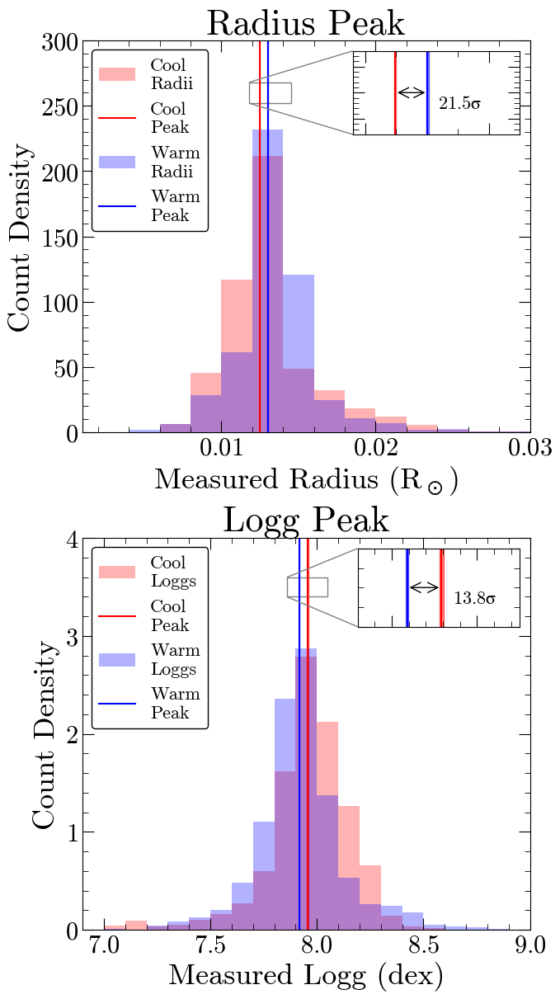

Radius
Cool peak=0.012 pm 2e-05 Rsun
Warm peak=0.013 pm 2e-05 Rsun

Logg
Cool peak=8.0 pm 0.002 dex
Warm peak=7.9 pm 0.002 dex


In [44]:
plot_peak_teff_comparison(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,savefig=False)

In [45]:
def plot_peak_vg_teff_comparison(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,savefig=False):

    #plot behavior at peak for radius, logg, and 3D logg data from combined catalog
    #don't correct for differences in mean radius/logg between cold/warm samples
    
    fig, ((ax1),(ax2)) =plt.subplots(2,1,figsize=(7,14),sharex=True,sharey=True)
    
    #radius peak
    binnum_rad,peak_rad_cool,e_peak_rad_cool,peak_vg_rad_cool,e_peak_vg_rad_cool,all_dat_tab_rad_cool,mean_teff_rad_cool,std_teff_rad_cool,peak_rad_warm,e_peak_rad_warm,peak_vg_rad_warm,e_peak_vg_rad_warm,all_dat_tab_rad_warm,mean_teff_rad_warm,std_teff_rad_warm=teff_get_peak_info('radius','cool',Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg)
    rad_peak_range=Teff_Eos_tab_rad_avg.query('radius_bin_id==@binnum_rad')['Bin_range'].to_list()[0]
    #plot a histogram of all the LSR and asym drift-corrected RVs in the bin, divided by temperature
    #with shaded regions for our measured grav redshifts pm error divided by temeperature
    ax1.hist(all_dat_tab_rad_cool['rv_corv_asym_corr'],color='red',density=True,alpha=0.3,label='Cool Radial\nVelocities')
    ax1.axvline(peak_vg_rad_cool,color='red',label='Cool\nRedshift')
    ax1.axvspan(peak_vg_rad_cool-e_peak_vg_rad_cool, peak_vg_rad_cool+e_peak_vg_rad_cool, alpha=0.5, color='red')
    ax1.hist(all_dat_tab_rad_warm['rv_corv_asym_corr'],color='blue',density=True,alpha=0.3,label='Warm Radial\nVelocities')
    ax1.axvline(peak_vg_rad_warm,color='blue',label='Warm\nRedshift')
    ax1.axvspan(peak_vg_rad_warm-e_peak_vg_rad_warm, peak_vg_rad_warm+e_peak_vg_rad_warm, alpha=0.5, color='blue')
    ax1.set_xlim(-190,250)
    ax1.set_ylim(0, 0.016)
    ax1.set_ylabel('Count Density')
    ax1.legend(fontsize=16,loc='upper left')
    #add insert to show behavior at peak
    axins1 = zoomed_inset_axes(ax1, 8, loc=1)
    axins1.hist(all_dat_tab_rad_cool['rv_corv_asym_corr'],color='red',density=True,alpha=0.3,label='Cool Radial\nVelocities')
    axins1.axvline(peak_vg_rad_cool,color='red',label='Cool\nRedshift')
    axins1.axvspan(peak_vg_rad_cool-e_peak_vg_rad_cool, peak_vg_rad_cool+e_peak_vg_rad_cool, alpha=0.5, color='red')
    axins1.hist(all_dat_tab_rad_warm['rv_corv_asym_corr'],color='blue',density=True,alpha=0.3,label='Warm Radial\nVelocities')
    axins1.axvline(peak_vg_rad_warm,color='blue',label='Warm\nRedshift')
    axins1.axvspan(peak_vg_rad_warm-e_peak_vg_rad_warm, peak_vg_rad_warm+e_peak_vg_rad_warm, alpha=0.5, color='blue')
    #set title
    mean_peak_rad=np.round((peak_rad_cool+peak_rad_warm)/2,3)
    ax1.set_title('Radius Peak Bin=\n'+str(rad_peak_range)+' $R_\odot$')
    #add tscore to insert
    tscore=np.abs(peak_vg_rad_cool-peak_vg_rad_warm)/np.sqrt(e_peak_vg_rad_cool**2+e_peak_vg_rad_warm**2)
    axins1.annotate('', xy=(peak_vg_rad_cool, 0.0155), xytext=(peak_vg_rad_warm, 0.0155),arrowprops=dict(arrowstyle="<->"))
    axins1.annotate(str(np.round(tscore,1))+'$\sigma$',fontsize=16, xy=(peak_vg_rad_cool, 0.0155),xytext=(peak_vg_rad_cool+1.3, 0.0154))
    axins1.set_xlim(20, 40) 
    axins1.set_ylim(0.0151, 0.0157)
    plt.xticks(visible=False)
    plt.yticks(visible=False)
    mark_inset(ax1, axins1, loc1=2, loc2=3, fc="none", ec="0.5")
    
    #logg peak
    binnum_logg,peak_logg_cool,e_peak_logg_cool,peak_vg_logg_cool,e_peak_vg_logg_cool,all_dat_tab_logg_cool,mean_teff_logg_cool,std_teff_logg_cool,peak_logg_warm,e_peak_logg_warm,peak_vg_logg_warm,e_peak_vg_logg_warm,all_dat_tab_logg_warm,mean_teff_logg_warm,std_teff_logg_warm=teff_get_peak_info('logg','cool',Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg)
    logg_peak_range=Teff_Eos_tab_logg_avg.query('logg_bin_id==@binnum_logg')['Bin_range'].to_list()[0]
    logg_peak_range = logg_peak_range[:7] + '0' + logg_peak_range[8:]
    #plot a histogram of all the LSR and asym drift-corrected RVs in the bin, divided by temperature
    #with shaded regions for our measured grav redshifts pm error divided by temeperature
    ax2.hist(all_dat_tab_logg_cool['rv_corv_asym_corr'],color='red',density=True,alpha=0.3,label='Cool Radial\nVelocities')
    ax2.axvline(peak_vg_logg_cool,color='red',label='Cool\nRedshift')
    ax2.axvspan(peak_vg_logg_cool-e_peak_vg_logg_cool, peak_vg_logg_cool+e_peak_vg_logg_cool, alpha=0.5, color='red')
    ax2.hist(all_dat_tab_logg_warm['rv_corv_asym_corr'],color='blue',density=True,alpha=0.3,label='Warm Radial\nVelocities')
    ax2.axvline(peak_vg_logg_warm,color='blue',label='Warm\nRedshift')
    ax2.axvspan(peak_vg_logg_warm-e_peak_vg_logg_warm, peak_vg_logg_warm+e_peak_vg_logg_warm, alpha=0.5, color='blue')
    ax2.set_xlim(-190,250)
    ax2.set_ylim(0, 0.016)
    ax2.set_xlabel('Radial Velocity (km/s)')
    ax2.set_ylabel('Count Density')
    #add insert to show behavior at peak
    axins3 = zoomed_inset_axes(ax2, 8, loc=1)
    axins3.hist(all_dat_tab_logg_cool['rv_corv_asym_corr'],color='red',density=True,alpha=0.3,label='Cool Radial\nVelocities')
    axins3.axvline(peak_vg_logg_cool,color='red',label='Cool\nRedshift')
    axins3.axvspan(peak_vg_logg_cool-e_peak_vg_logg_cool, peak_vg_logg_cool+e_peak_vg_logg_cool, alpha=0.5, color='red')
    axins3.hist(all_dat_tab_logg_warm['rv_corv_asym_corr'],color='blue',density=True,alpha=0.3,label='Warm Radial\nVelocities')
    axins3.axvline(peak_vg_logg_warm,color='blue',label='Warm\nRedshift')
    axins3.axvspan(peak_vg_logg_warm-e_peak_vg_logg_warm, peak_vg_logg_warm+e_peak_vg_logg_warm, alpha=0.5, color='blue')
    #set title
    mean_peak_logg=(peak_logg_cool+peak_logg_warm)/2
    ax2.set_title('Logg Peak Bin=\n'+str(logg_peak_range)+' dex')
    #add tscore to insert
    tscore=np.abs(peak_vg_logg_cool-peak_vg_logg_warm)/np.sqrt(e_peak_vg_logg_cool**2+e_peak_vg_logg_warm**2)
    axins3.annotate('', xy=(peak_vg_logg_cool, 0.0155), xytext=(peak_vg_logg_warm, 0.0155),arrowprops=dict(arrowstyle="<->"))
    axins3.annotate(str(np.round(tscore,1))+'$\sigma$',fontsize=16,xy=(peak_vg_logg_cool, 0.0155),xytext=(peak_vg_logg_cool+1.0, 0.0154))
    axins3.set_xlim(20, 40) 
    axins3.set_ylim(0.0151, 0.0157)
    plt.xticks(visible=False)
    plt.yticks(visible=False)
    mark_inset(ax2, axins3, loc1=2, loc2=3, fc="none", ec="0.5")

    plt.subplots_adjust(wspace = 0.05,hspace = 0.27)
    
    if savefig==True:
        plt.savefig('teff_vg_peak_comparison.pdf',dpi=300)#, pad_inches=0.3)
    else:
        plt.show()
        
    print('Radius')
    print('Cool peak='+str(np.round(peak_vg_rad_cool,1))+' pm '+str(np.round(e_peak_vg_rad_cool,1))+' km/s')
    print('Warm peak='+str(np.round(peak_vg_rad_warm,1))+' pm '+str(np.round(e_peak_vg_rad_warm,1))+' km/s')

    print('')
    
    print('Logg')
    print('Cool peak='+str(np.round(peak_vg_logg_cool,1))+' pm '+str(np.round(e_peak_vg_logg_cool,1))+' km/s')
    print('Warm peak='+str(np.round(peak_vg_logg_warm,1))+' pm '+str(np.round(e_peak_vg_logg_warm,1))+' km/s')
    

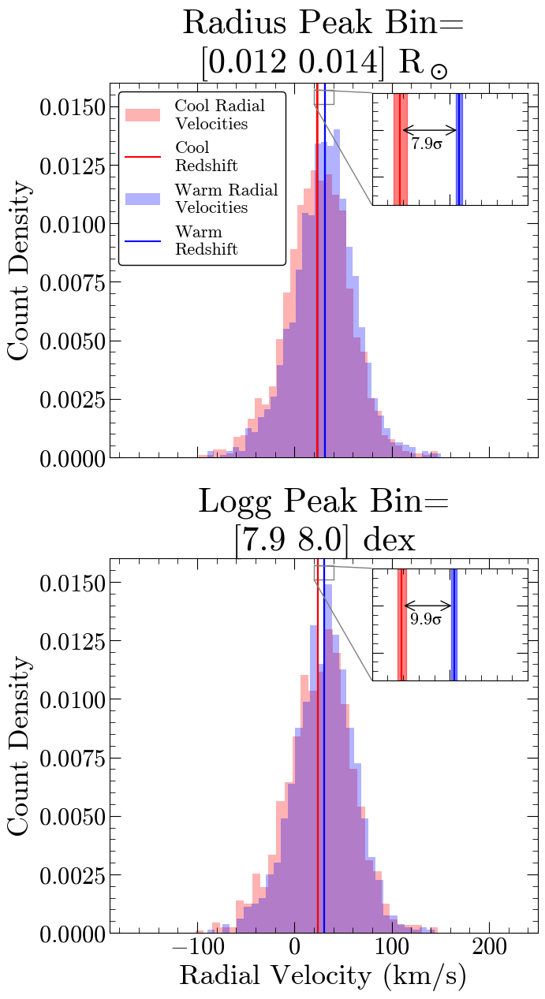

Radius
Cool peak=23.6 pm 0.9 km/s
Warm peak=31.2 pm 0.4 km/s

Logg
Cool peak=23.8 pm 0.6 km/s
Warm peak=30.5 pm 0.4 km/s


In [46]:
plot_peak_vg_teff_comparison(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,savefig=False)

In [47]:
def correct_to_mean_param(param,peak_param1,peak_vg1,e_peak_vg1,mean_teff1,peak_param2,peak_vg2,e_peak_vg2,mean_teff2):
    #this function accounts for the difference in mean logg/radius between the cool and warm samples
    #param='radius','logg'
    
    mean_param=(peak_param1+peak_param2)/2
    
    if param=='radius':
        correction1=theo_vg_from_r_teff(mean_param,mean_teff1)-theo_vg_from_r_teff(peak_param1,mean_teff1)
        correction2=theo_vg_from_r_teff(mean_param,mean_teff2)-theo_vg_from_r_teff(peak_param2,mean_teff2)
    if param=='logg':
        correction1=theo_vg_from_logg_teff(mean_param,mean_teff1)-theo_vg_from_logg_teff(peak_param1,mean_teff1)
        correction2=theo_vg_from_logg_teff(mean_param,mean_teff2)-theo_vg_from_logg_teff(peak_param2,mean_teff2)
    
    vg_corr1=peak_vg1+correction1
    vg_corr2=peak_vg2+correction2
    
    tscore=np.abs(vg_corr1-vg_corr2)/np.sqrt(e_peak_vg1**2+e_peak_vg2**2)
    
    return(vg_corr1,vg_corr2,tscore)

In [54]:
def corr_plot_peak_vg_teff_comparison(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,savefig=False):
    #plot behavior at peak for radius and logg data from combined catalog
    #correct for differences in mean radius/logg between cold/warm samples
    
    fig, ((ax1),(ax2)) =plt.subplots(2,1,figsize=(7,14),sharex=True,sharey=True)
    
    #radius peak
    binnum_rad,peak_rad_cool,e_peak_rad_cool,peak_vg_rad_cool,e_peak_vg_rad_cool,all_dat_tab_rad_cool,mean_teff_rad_cool,std_teff_rad_cool,peak_rad_warm,e_peak_rad_warm,peak_vg_rad_warm,e_peak_vg_rad_warm,all_dat_tab_rad_warm,mean_teff_rad_warm,std_teff_rad_warm=teff_get_peak_info('radius','cool',Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg)
    rad_peak_range=Teff_Eos_tab_rad_avg.query('radius_bin_id==@binnum_rad')['Bin_range'].to_list()[0]
    #correct for differences in mean radius between the samples
    peak_vg_rad_cool,peak_vg_rad_warm,tscore_rad=correct_to_mean_param('radius',peak_rad_cool,peak_vg_rad_cool,e_peak_vg_rad_cool,mean_teff_rad_cool,peak_rad_warm,peak_vg_rad_warm,e_peak_vg_rad_warm,mean_teff_rad_warm)
    
    #plot a histogram of all the LSR and asym drift-corrected RVs in the bin, divided by temperature
    #with shaded regions for our measured grav redshifts pm error divided by temeperature
    ax1.hist(all_dat_tab_rad_cool['rv_corv_asym_corr'],color='red',density=True,alpha=0.3,label='Cool Radial\nVelocities')
    ax1.axvline(peak_vg_rad_cool,color='red',label='Cool\nRedshift')
    ax1.axvspan(peak_vg_rad_cool-e_peak_vg_rad_cool, peak_vg_rad_cool+e_peak_vg_rad_cool, alpha=0.5, color='red')
    ax1.hist(all_dat_tab_rad_warm['rv_corv_asym_corr'],color='blue',density=True,alpha=0.3,label='Warm Radial\nVelocities')
    ax1.axvline(peak_vg_rad_warm,color='blue',label='Warm\nRedshift')
    ax1.axvspan(peak_vg_rad_warm-e_peak_vg_rad_warm, peak_vg_rad_warm+e_peak_vg_rad_warm, alpha=0.5, color='blue')
    #ax1.legend(fontsize=16,loc='upper left',bbox_to_anchor =[1.1, 1.0])
    ax1.legend(fontsize=16,loc='upper left')
    ax1.set_xlim(-190,250)
    ax1.set_ylim(0, 0.016)
    ax1.set_ylabel('Count Density')
    #add insert to show behavior at peak
    axins1 = zoomed_inset_axes(ax1, 8, loc=1)
    axins1.hist(all_dat_tab_rad_cool['rv_corv_asym_corr'],color='red',density=True,alpha=0.3,label='Cool Radial\nVelocities')
    axins1.axvline(peak_vg_rad_cool,color='red',label='Cool\nRedshift')
    axins1.axvspan(peak_vg_rad_cool-e_peak_vg_rad_cool, peak_vg_rad_cool+e_peak_vg_rad_cool, alpha=0.5, color='red')
    axins1.hist(all_dat_tab_rad_warm['rv_corv_asym_corr'],color='blue',density=True,alpha=0.3,label='Warm Radial\nVelocities')
    axins1.axvline(peak_vg_rad_warm,color='blue',label='Warm\nRedshift')
    axins1.axvspan(peak_vg_rad_warm-e_peak_vg_rad_warm, peak_vg_rad_warm+e_peak_vg_rad_warm, alpha=0.5, color='blue')
    #set title
    mean_peak_rad=np.round((peak_rad_cool+peak_rad_warm)/2,3)
    ax1.set_title('Radius Peak Bin=\n'+str(rad_peak_range)+' $R_\odot$')
    #add tscore to insert
    axins1.annotate('', xy=(peak_vg_rad_cool, 0.0155), xytext=(peak_vg_rad_warm, 0.0155),arrowprops=dict(arrowstyle="<->"))
    axins1.annotate(str(np.round(tscore_rad,1))+'$\sigma$',fontsize=16, xy=(peak_vg_rad_cool, 0.0155),xytext=(peak_vg_rad_cool+3.0, 0.0154))
    axins1.set_xlim(20, 40) 
    axins1.set_ylim(0.0151, 0.0157)
    plt.xticks(visible=False)
    plt.yticks(visible=False)
    mark_inset(ax1, axins1, loc1=2, loc2=3, fc="none", ec="0.5")

    #logg peak
    binnum_logg,peak_logg_cool,e_peak_logg_cool,peak_vg_logg_cool,e_peak_vg_logg_cool,all_dat_tab_logg_cool,mean_teff_logg_cool,std_teff_logg_cool,peak_logg_warm,e_peak_logg_warm,peak_vg_logg_warm,e_peak_vg_logg_warm,all_dat_tab_logg_warm,mean_teff_logg_warm,std_teff_logg_warm=teff_get_peak_info('logg','cool',Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg)
    logg_peak_range=Teff_Eos_tab_logg_avg.query('logg_bin_id==@binnum_logg')['Bin_range'].to_list()[0]
    logg_peak_range = logg_peak_range[:7] + '0' + logg_peak_range[8:]
    #correct for differences in mean logg between the samples
    peak_vg_logg_cool,peak_vg_logg_warm,tscore_logg=correct_to_mean_param('logg',peak_logg_cool,peak_vg_logg_cool,e_peak_vg_logg_cool,mean_teff_logg_cool,peak_logg_warm,peak_vg_logg_warm,e_peak_vg_logg_warm,mean_teff_logg_warm)
    #plot a histogram of all the LSR and asym drift-corrected RVs in the bin, divided by temperature
    #with shaded regions for our measured grav redshifts pm error divided by temeperature
    ax2.hist(all_dat_tab_logg_cool['rv_corv_asym_corr'],color='red',density=True,alpha=0.3,label='Cool Radial\nVelocities')
    ax2.axvline(peak_vg_logg_cool,color='red',label='Cool\nRedshift')
    ax2.axvspan(peak_vg_logg_cool-e_peak_vg_logg_cool, peak_vg_logg_cool+e_peak_vg_logg_cool, alpha=0.5, color='red')
    ax2.hist(all_dat_tab_logg_warm['rv_corv_asym_corr'],color='blue',density=True,alpha=0.3,label='Warm Radial\nVelocities')
    ax2.axvline(peak_vg_logg_warm,color='blue',label='Warm\nRedshift')
    ax2.axvspan(peak_vg_logg_warm-e_peak_vg_logg_warm, peak_vg_logg_warm+e_peak_vg_logg_warm, alpha=0.5, color='blue')
    ax2.set_ylabel('Count Density')
    ax2.set_xlabel('Radial Velocity (km/s)')
    #add insert to show behavior at peak
    axins3 = zoomed_inset_axes(ax2, 8, loc=1)
    axins3.hist(all_dat_tab_logg_cool['rv_corv_asym_corr'],color='red',density=True,alpha=0.3,label='Cool Radial\nVelocities')
    axins3.axvline(peak_vg_logg_cool,color='red',label='Cool\nRedshift')
    axins3.axvspan(peak_vg_logg_cool-e_peak_vg_logg_cool, peak_vg_logg_cool+e_peak_vg_logg_cool, alpha=0.5, color='red')
    axins3.hist(all_dat_tab_logg_warm['rv_corv_asym_corr'],color='blue',density=True,alpha=0.3,label='Warm Radial\nVelocities')
    axins3.axvline(peak_vg_logg_warm,color='blue',label='Warm\nRedshift')
    axins3.axvspan(peak_vg_logg_warm-e_peak_vg_logg_warm, peak_vg_logg_warm+e_peak_vg_logg_warm, alpha=0.5, color='blue')
    #set title
    mean_peak_logg=(peak_logg_cool+peak_logg_warm)/2
    ax2.set_title('Logg Peak Bin=\n'+str(logg_peak_range)+' dex')
    #add tscore to insert
    axins3.annotate('', xy=(peak_vg_logg_cool, 0.0155), xytext=(peak_vg_logg_warm, 0.0155),arrowprops=dict(arrowstyle="<->"))
    axins3.annotate(str(np.round(tscore_logg,1))+'$\sigma$',fontsize=16,xy=(peak_vg_logg_cool, 0.0155),xytext=(peak_vg_logg_cool+1.3, 0.0154))
    axins3.set_xlim(20, 40) 
    axins3.set_ylim(0.0151, 0.0157)
    plt.xticks(visible=False)
    plt.yticks(visible=False)
    mark_inset(ax2, axins3, loc1=2, loc2=3, fc="none", ec="0.5")
    
    plt.subplots_adjust(wspace = 0.05,hspace = 0.27)
    
    if savefig==True:
        plt.savefig('corrected_teff_peak_comparison.pdf',dpi=300, pad_inches=0.3)
    else:
        plt.show()
        
    print('Radius')
    print('Cool peak='+str(np.round(peak_vg_rad_cool,1))+' pm '+str(np.round(e_peak_vg_rad_cool,1))+' km/s')
    print('Warm peak='+str(np.round(peak_vg_rad_warm,1))+' pm '+str(np.round(e_peak_vg_rad_warm,1))+' km/s')

    print('')
    
    print('Logg')
    print('Cool peak='+str(np.round(peak_vg_logg_cool,1))+' pm '+str(np.round(e_peak_vg_logg_cool,1))+' km/s')
    print('Warm peak='+str(np.round(peak_vg_logg_warm,1))+' pm '+str(np.round(e_peak_vg_logg_warm,1))+' km/s')
    
    return(tscore_rad,tscore_logg)

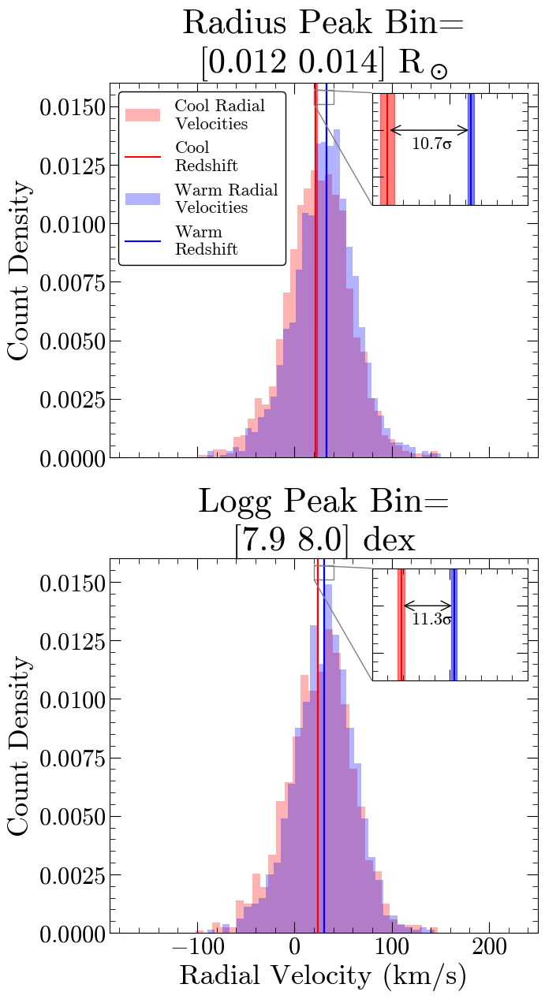

Radius
Cool peak=22.0 pm 0.9 km/s
Warm peak=32.7 pm 0.4 km/s

Logg
Cool peak=23.7 pm 0.5 km/s
Warm peak=30.5 pm 0.4 km/s


In [55]:
tscore_rad,tscore_logg=corr_plot_peak_vg_teff_comparison(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,savefig=False)

### Plot these results for all data runs to check for consistency across bias corrections

The data points do wiggle around a bit in the EOS plot, but they do so within the error bars. The general agreement between the measurements and theory does not change.

For the significance of the temperature dependence detection, all radius and logg peak measurements return a significant temperature dependence in the correct direction. The extent of that significance varies between bias-correction runs, so we will choose a representative example for which the significance is ~the median significance across all simulation runs.


0


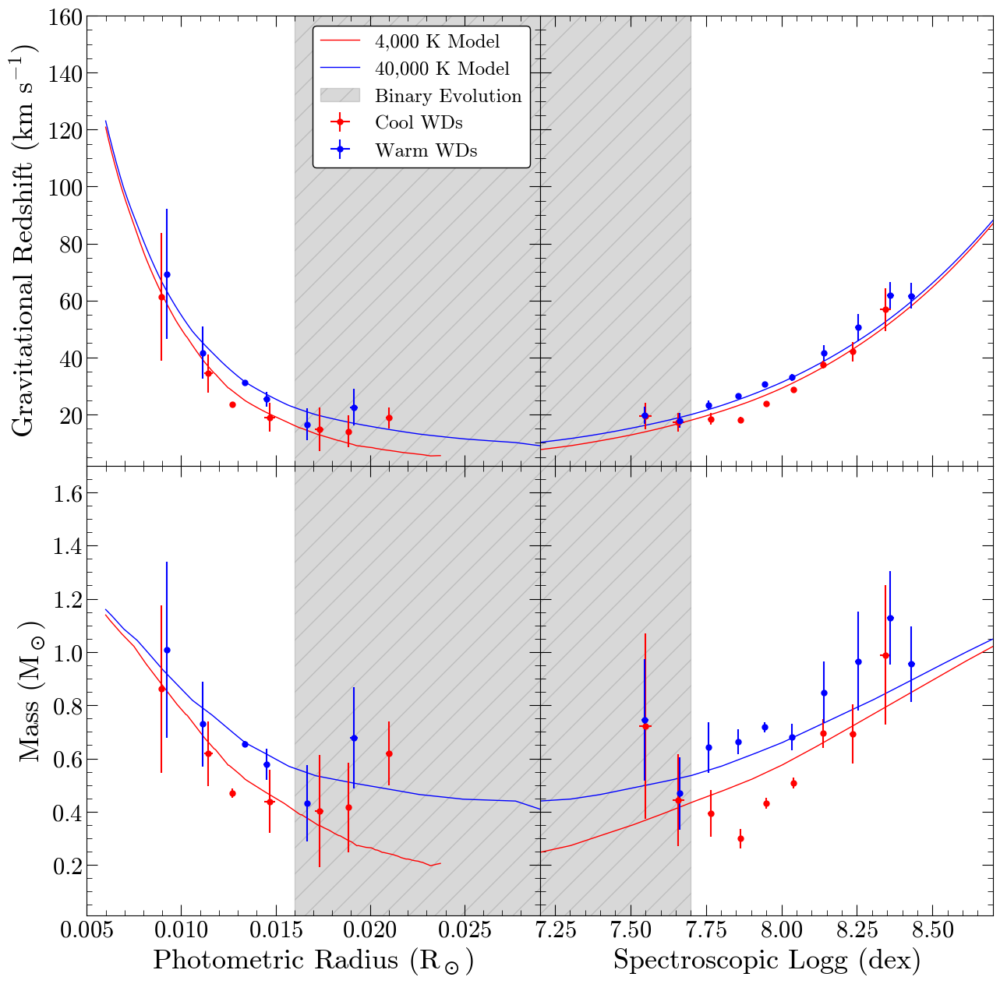

1


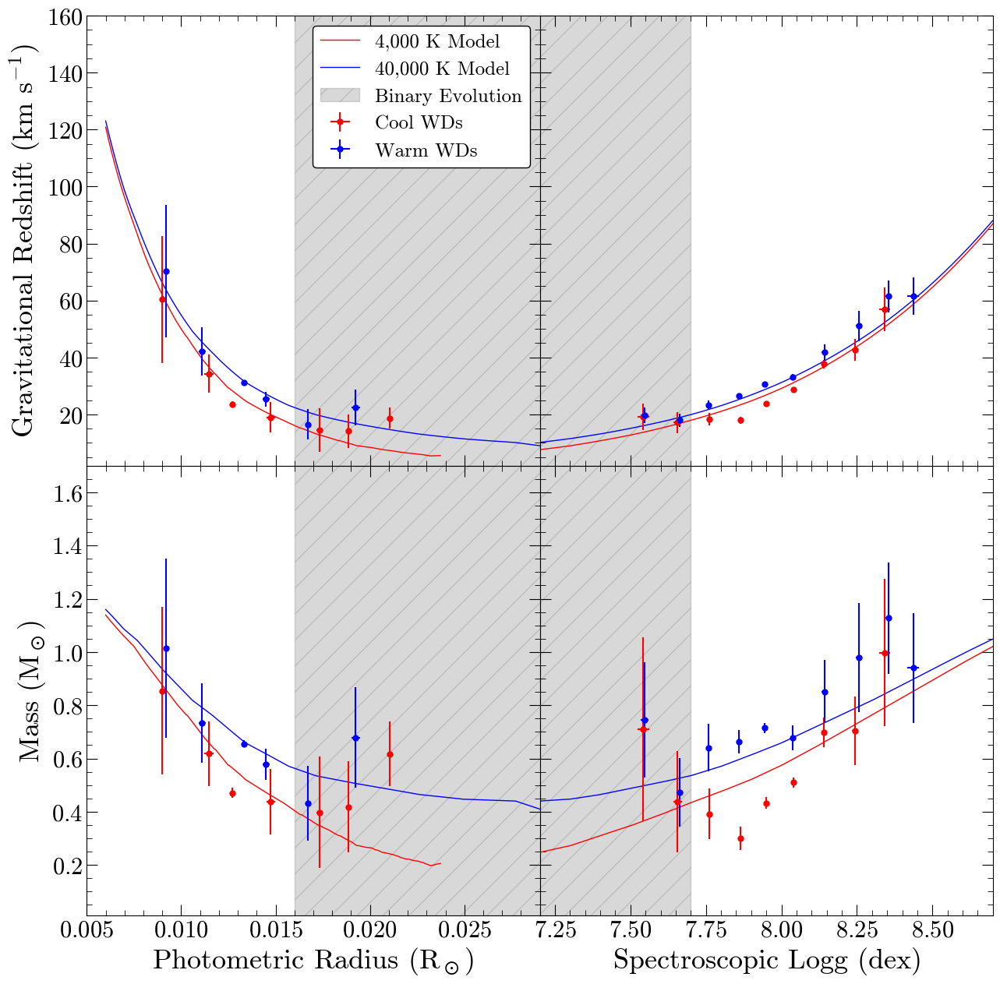

2


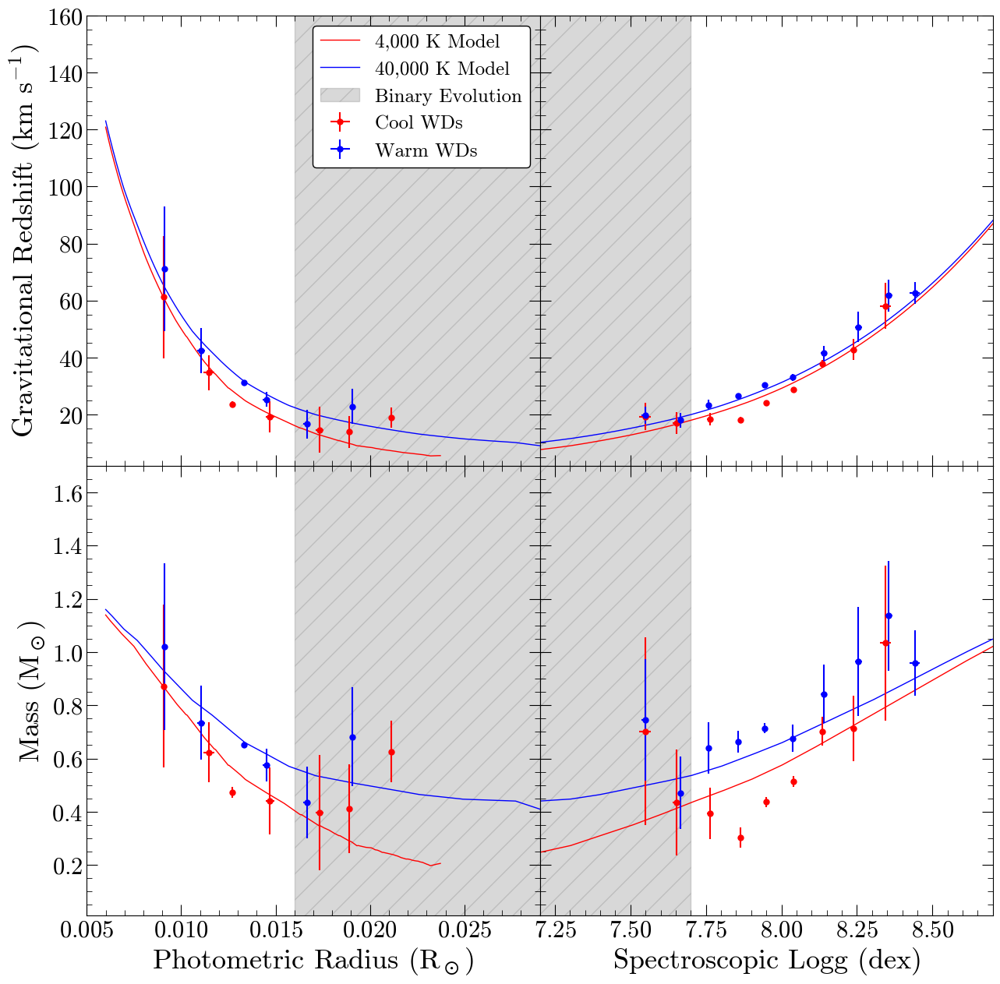

3


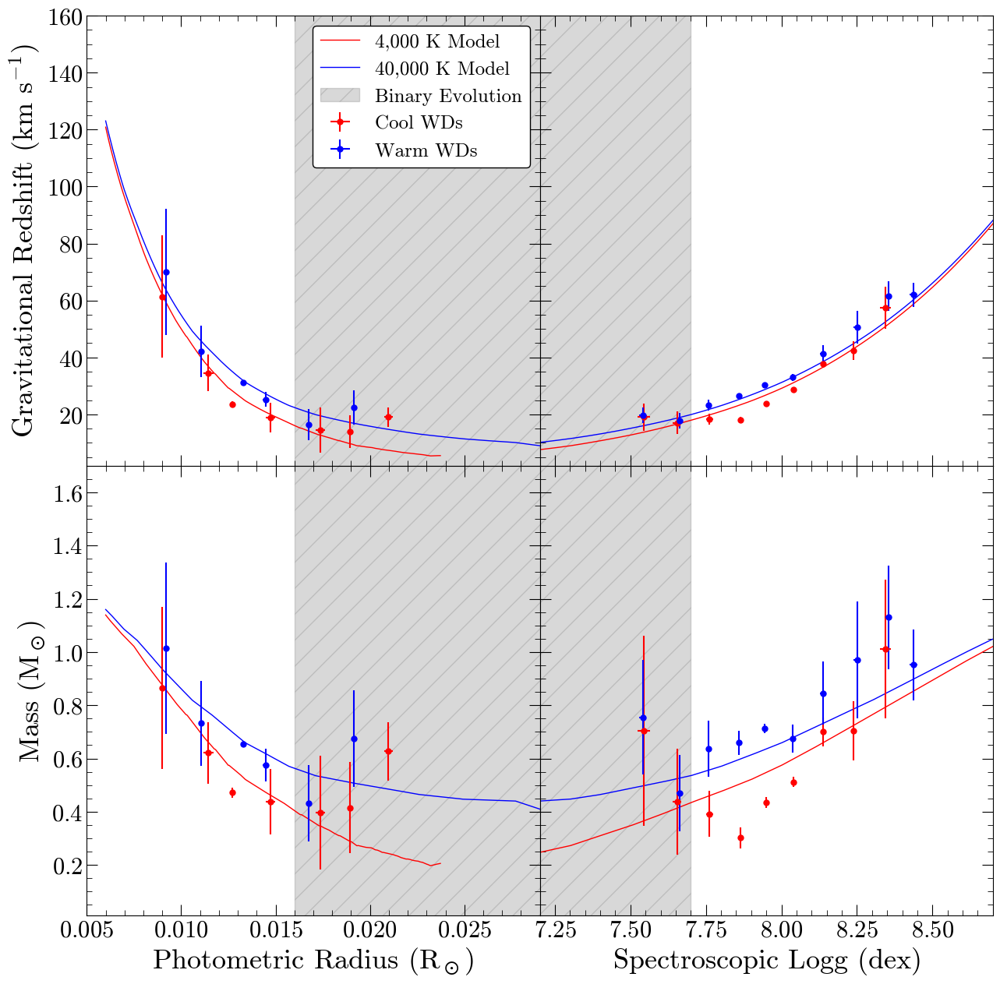

4


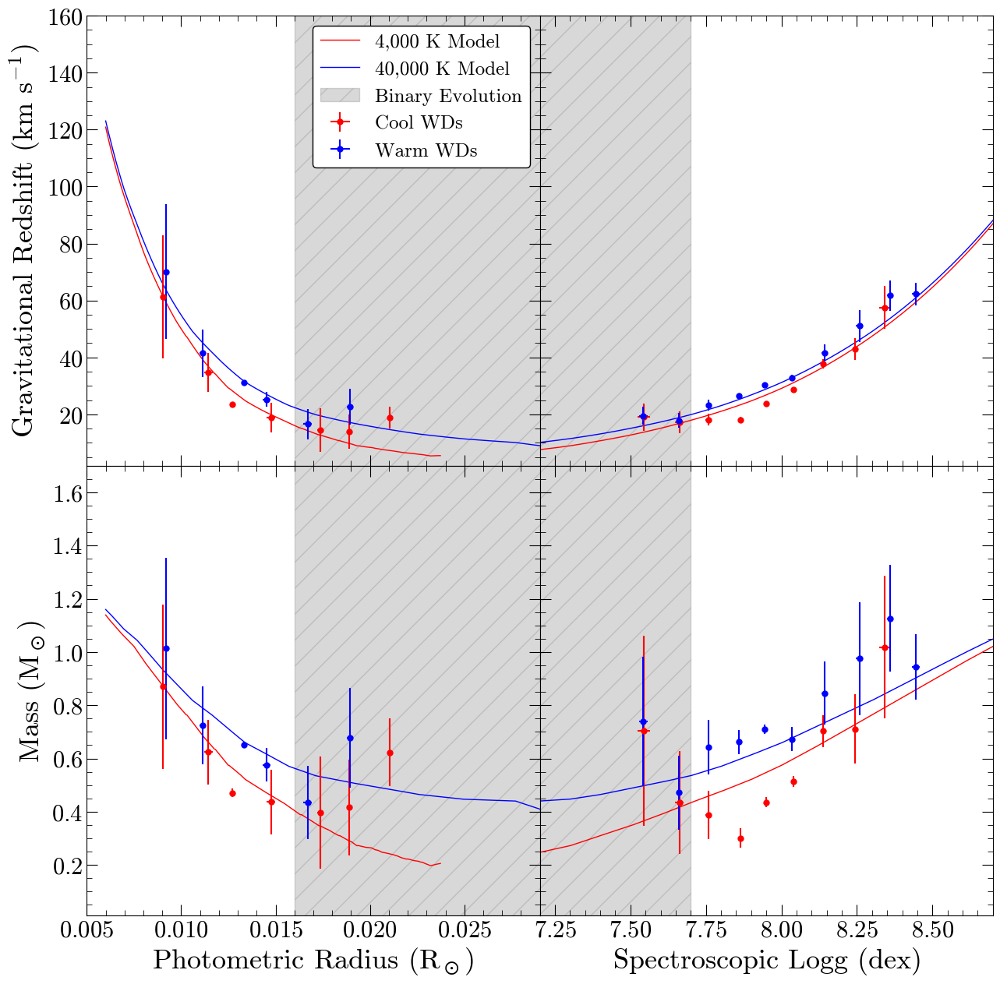

5


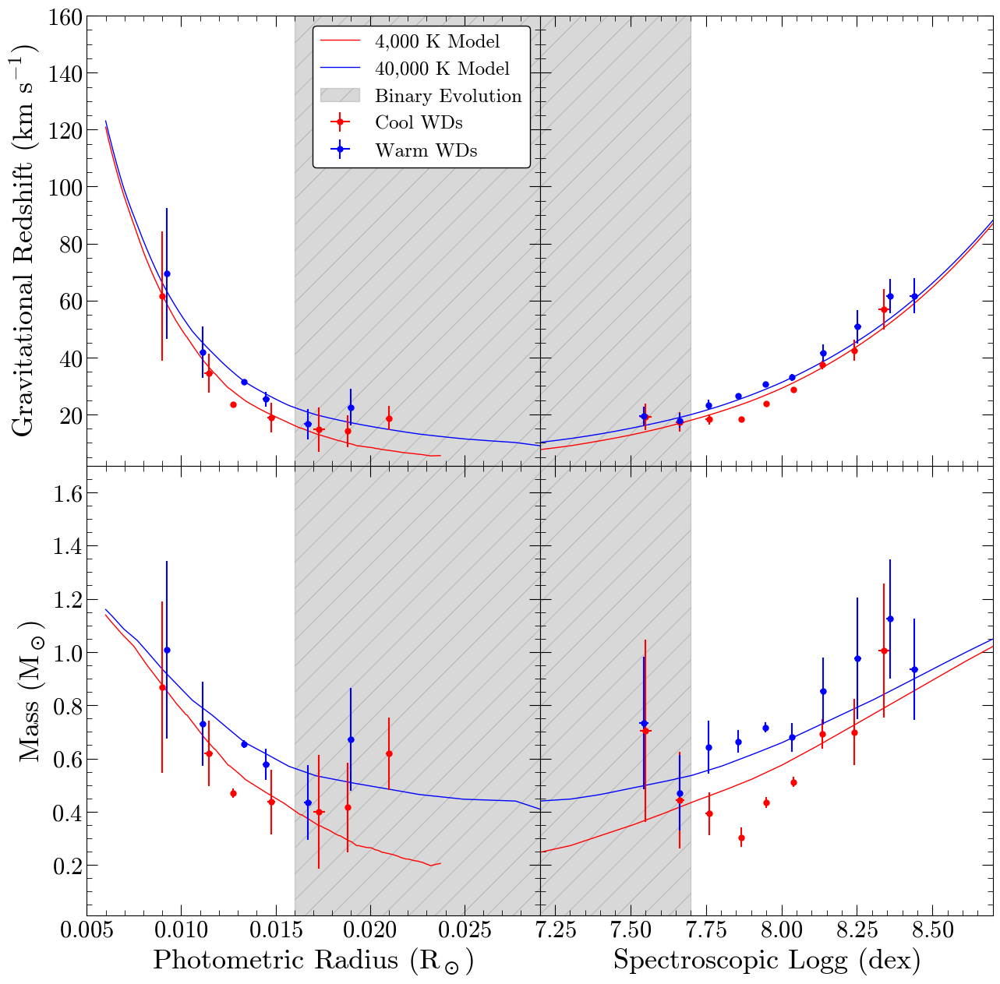

6


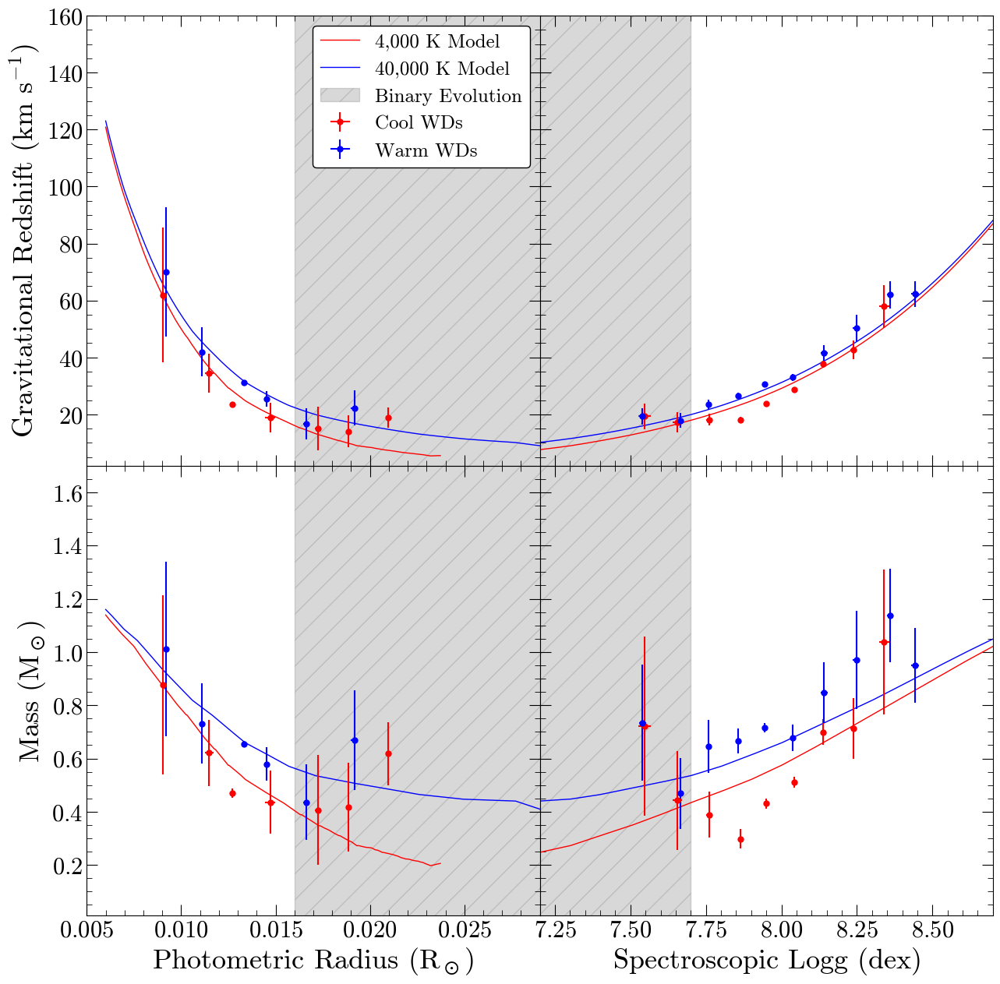

7


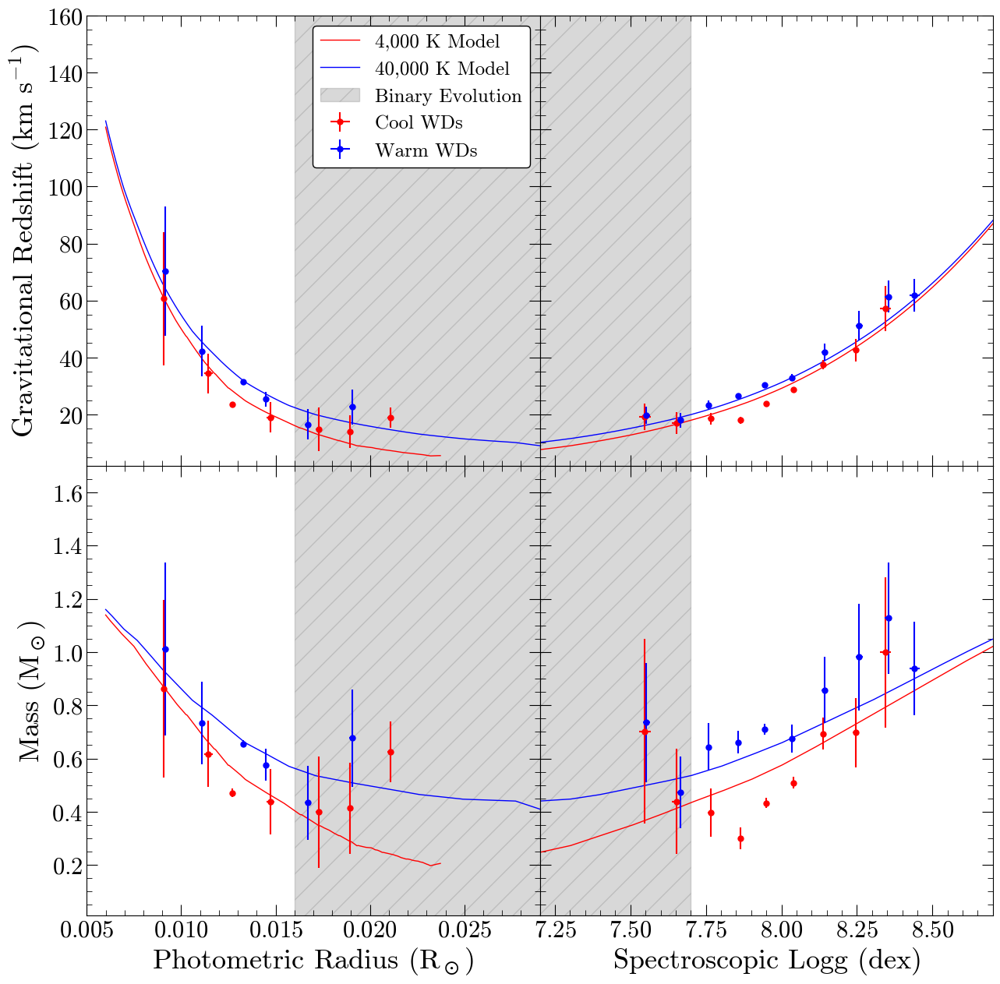

8


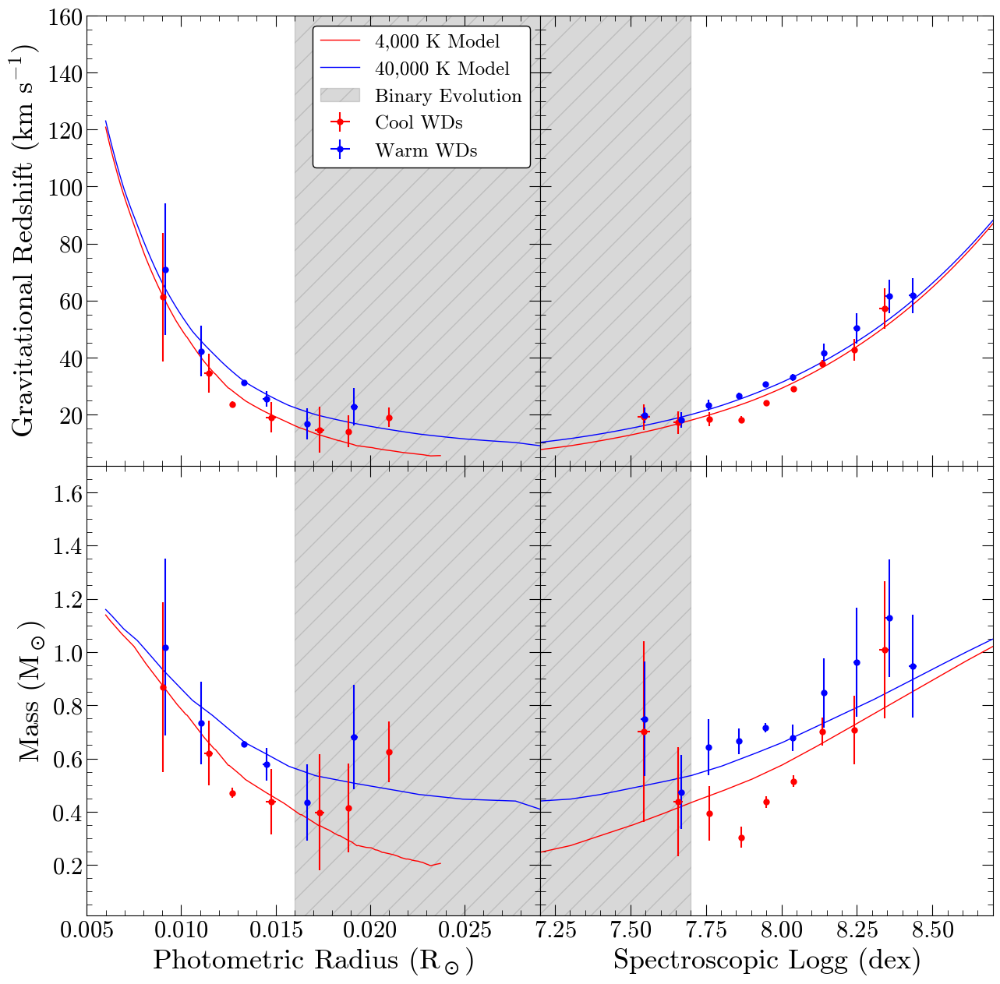

9


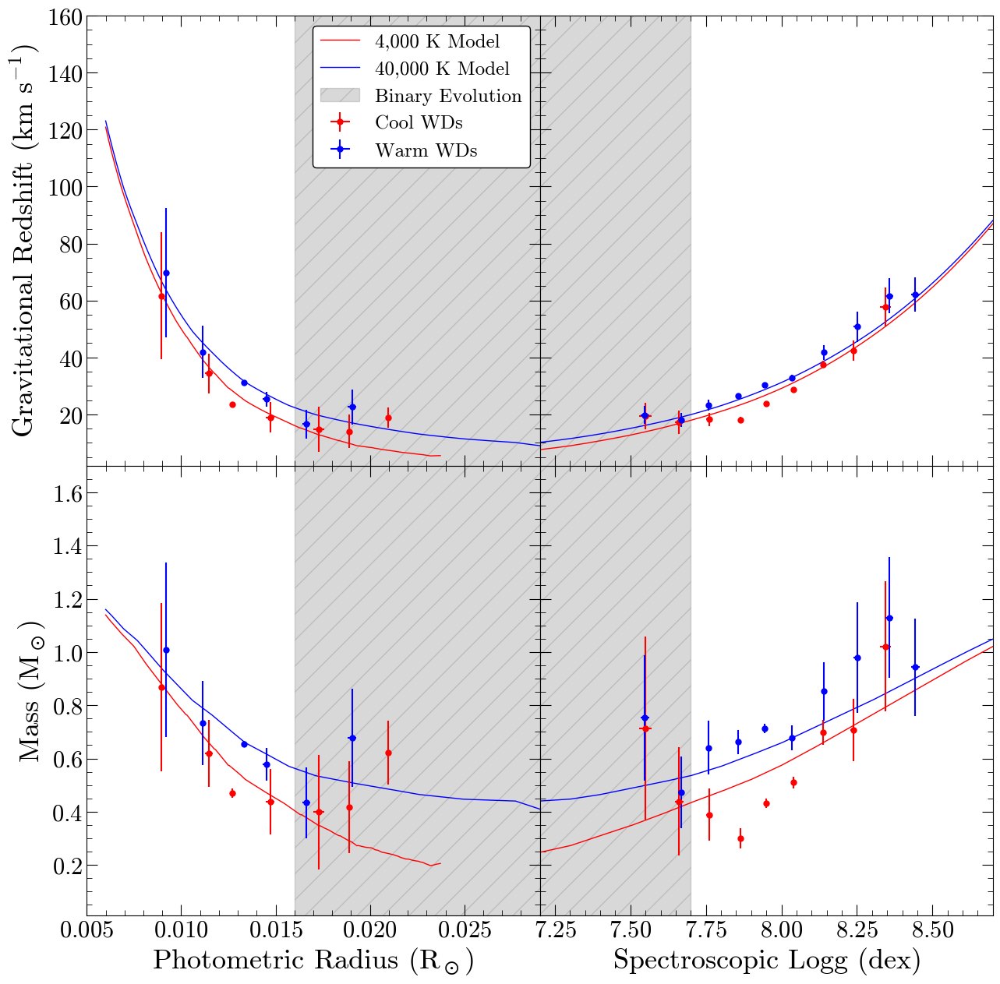

In [50]:
for run in runs:
    print(run)

    Teff_Eos_tab_rad_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Teff_Eos_tab_rad_avg.csv')
    Teff_Eos_tab_logg_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Teff_Eos_tab_logg_avg.csv')
    
    plot_teff_eos(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,'All','debias',50,radlim=[0.005,0.025],logglim=[7.2,8.7],title=False)


0


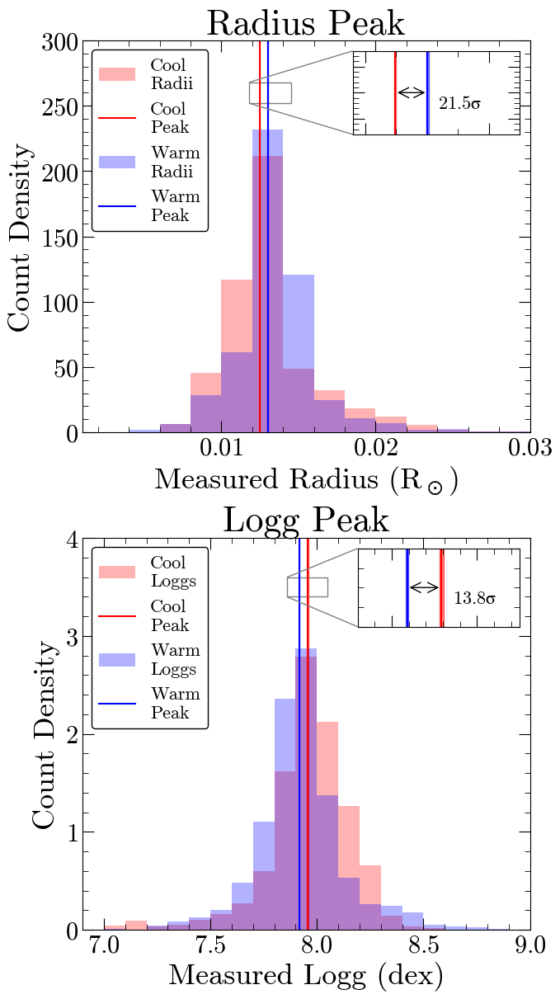

Radius
Cool peak=0.012 pm 2e-05 Rsun
Warm peak=0.013 pm 2e-05 Rsun

Logg
Cool peak=8.0 pm 0.002 dex
Warm peak=7.9 pm 0.002 dex
1


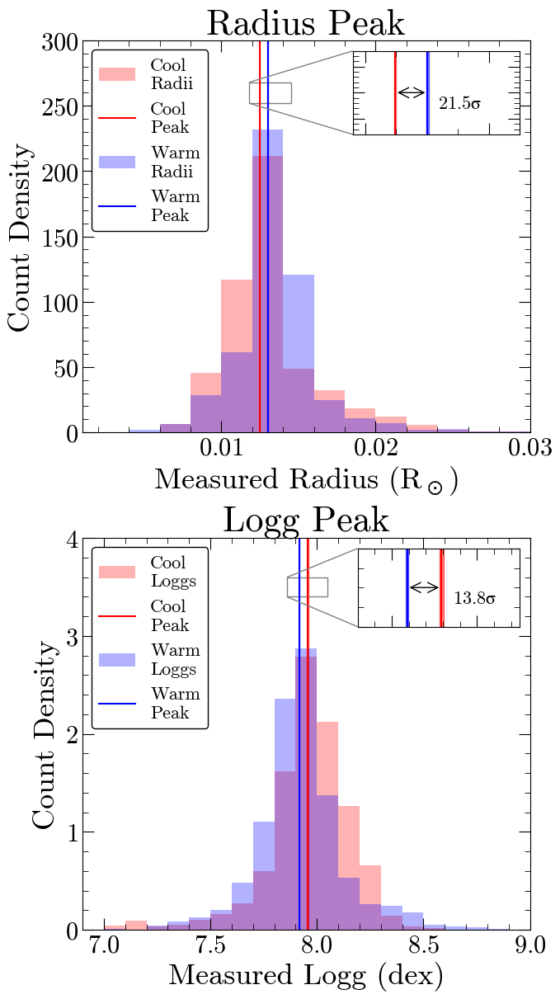

Radius
Cool peak=0.012 pm 2e-05 Rsun
Warm peak=0.013 pm 2e-05 Rsun

Logg
Cool peak=8.0 pm 0.002 dex
Warm peak=7.9 pm 0.002 dex
2


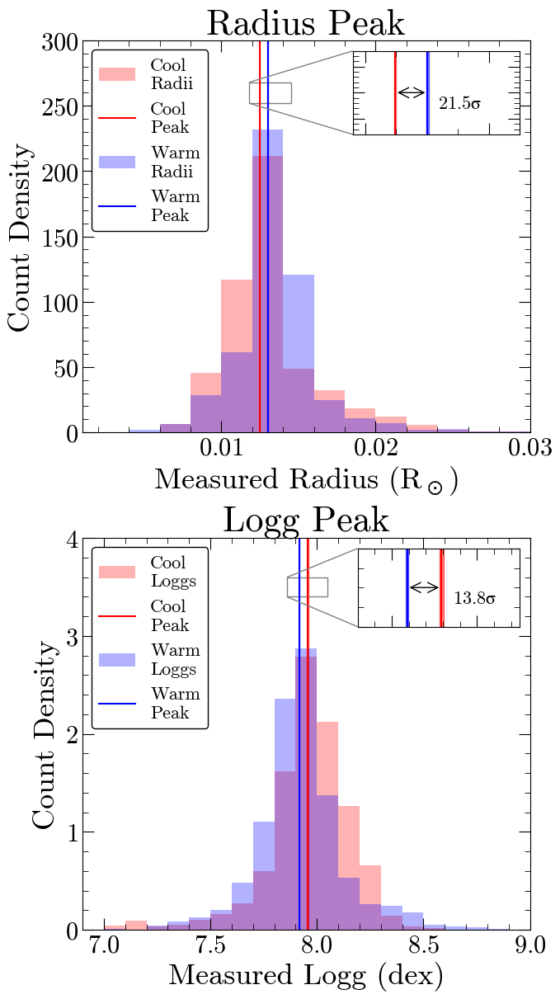

Radius
Cool peak=0.012 pm 2e-05 Rsun
Warm peak=0.013 pm 2e-05 Rsun

Logg
Cool peak=8.0 pm 0.002 dex
Warm peak=7.9 pm 0.002 dex
3


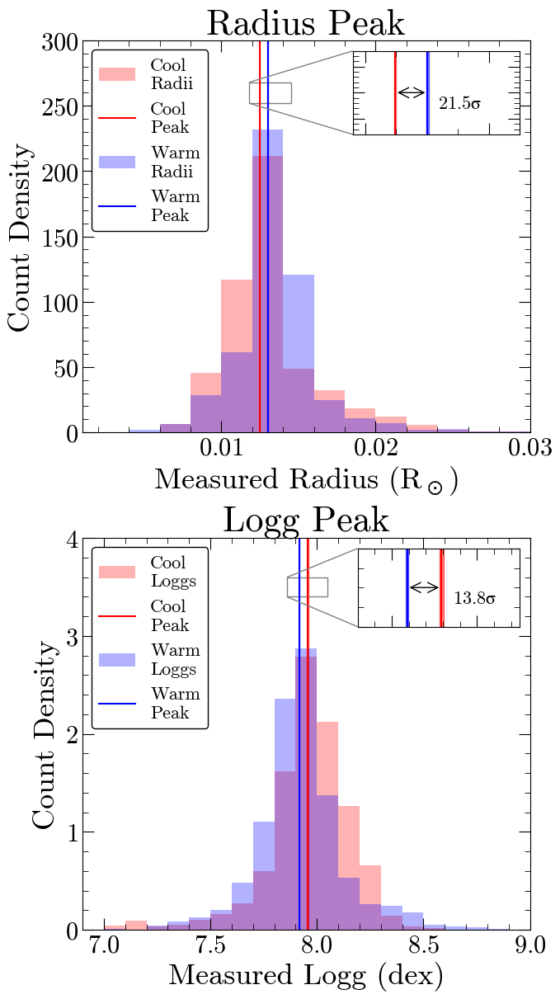

Radius
Cool peak=0.012 pm 2e-05 Rsun
Warm peak=0.013 pm 2e-05 Rsun

Logg
Cool peak=8.0 pm 0.002 dex
Warm peak=7.9 pm 0.002 dex
4


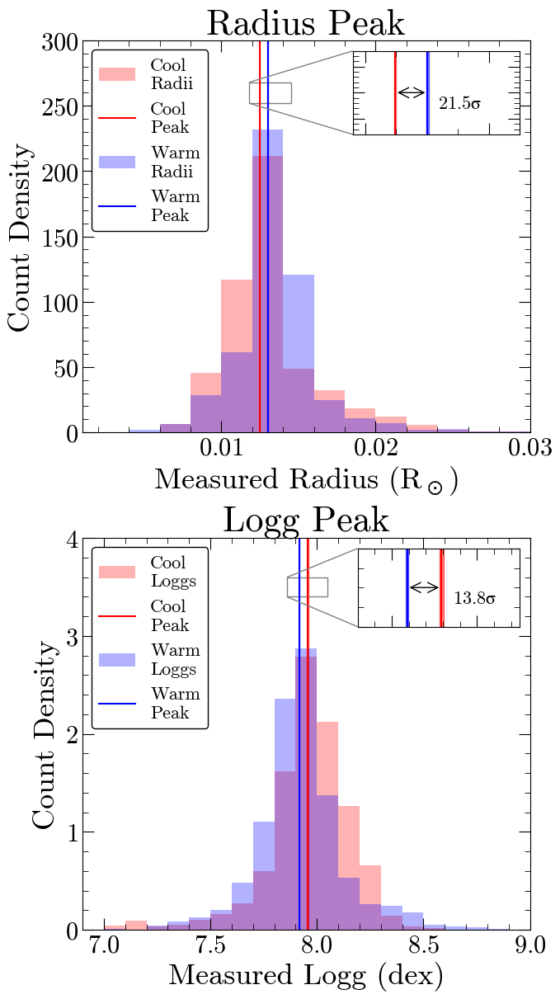

Radius
Cool peak=0.012 pm 2e-05 Rsun
Warm peak=0.013 pm 2e-05 Rsun

Logg
Cool peak=8.0 pm 0.002 dex
Warm peak=7.9 pm 0.002 dex
5


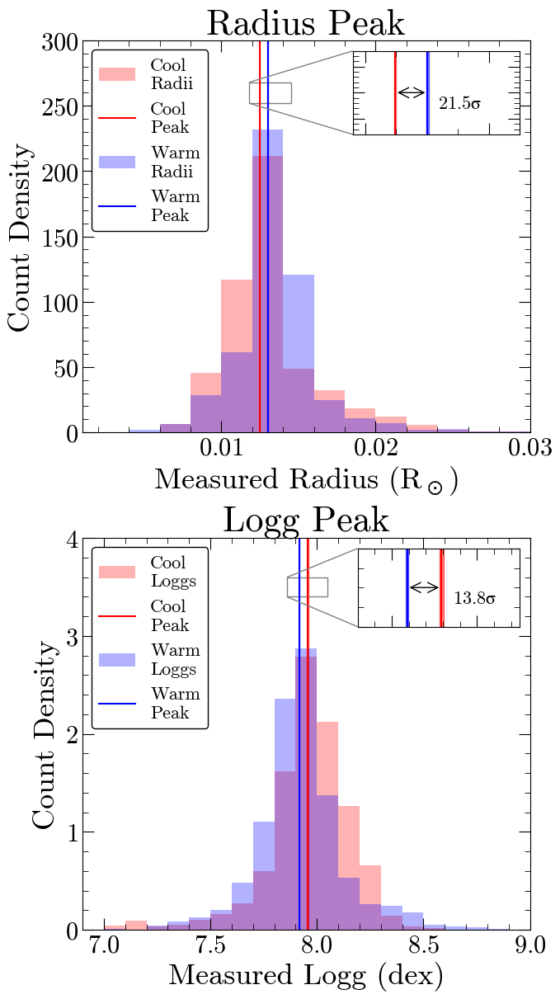

Radius
Cool peak=0.012 pm 2e-05 Rsun
Warm peak=0.013 pm 2e-05 Rsun

Logg
Cool peak=8.0 pm 0.002 dex
Warm peak=7.9 pm 0.002 dex
6


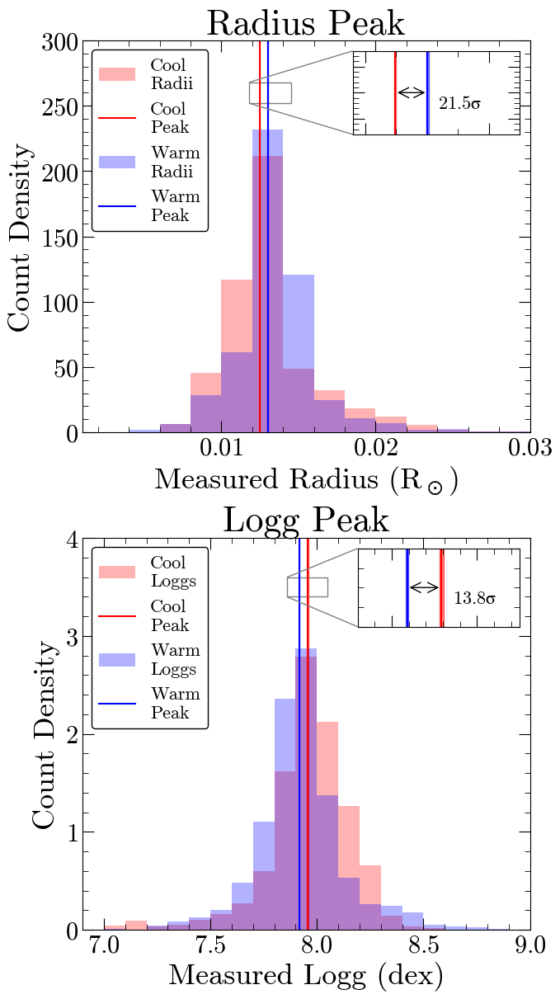

Radius
Cool peak=0.012 pm 2e-05 Rsun
Warm peak=0.013 pm 2e-05 Rsun

Logg
Cool peak=8.0 pm 0.002 dex
Warm peak=7.9 pm 0.002 dex
7


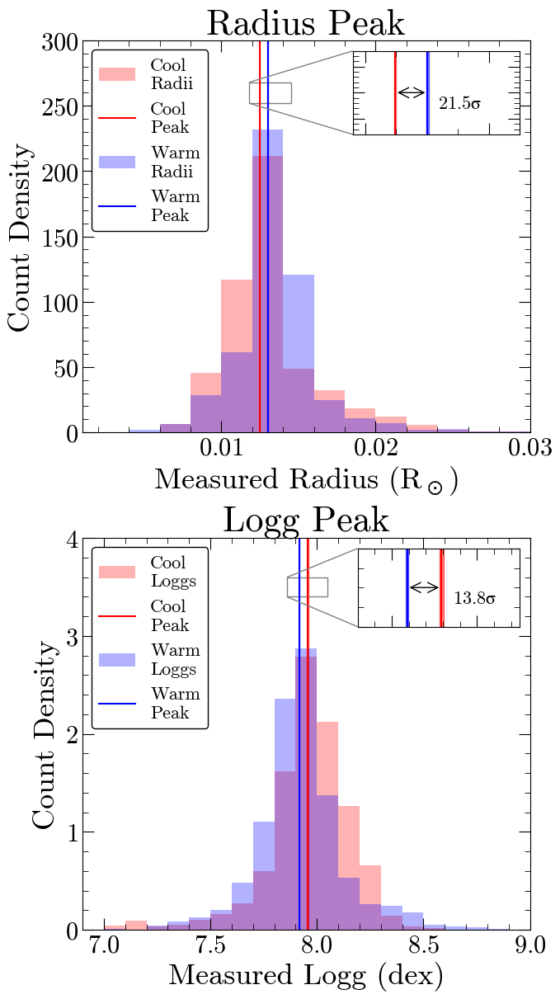

Radius
Cool peak=0.012 pm 2e-05 Rsun
Warm peak=0.013 pm 2e-05 Rsun

Logg
Cool peak=8.0 pm 0.002 dex
Warm peak=7.9 pm 0.002 dex
8


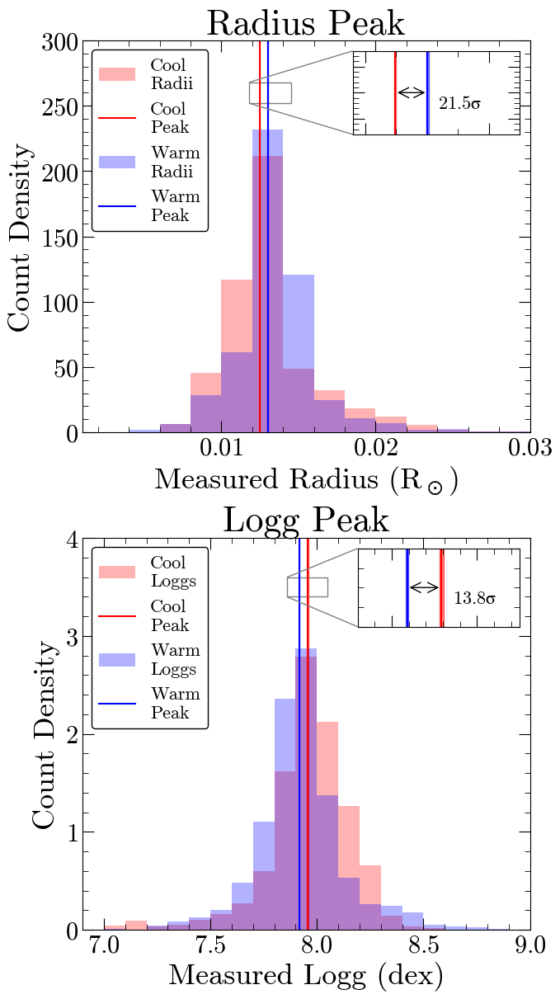

Radius
Cool peak=0.012 pm 2e-05 Rsun
Warm peak=0.013 pm 2e-05 Rsun

Logg
Cool peak=8.0 pm 0.002 dex
Warm peak=7.9 pm 0.002 dex
9


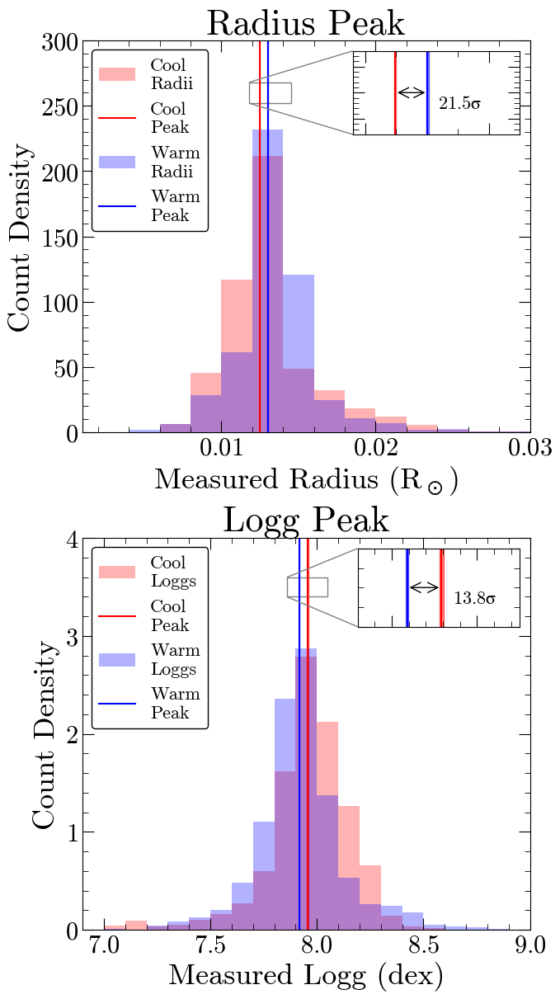

Radius
Cool peak=0.012 pm 2e-05 Rsun
Warm peak=0.013 pm 2e-05 Rsun

Logg
Cool peak=8.0 pm 0.002 dex
Warm peak=7.9 pm 0.002 dex


In [51]:
#BIAS CORRECTIONS ARE NOT USED IN THIS PLOT! So all plots are the same
for run in runs:
    print(run)

    Teff_Eos_tab_rad_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Teff_Eos_tab_rad_avg.csv')
    Teff_Eos_tab_logg_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Teff_Eos_tab_logg_avg.csv')
    
    plot_peak_teff_comparison(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,savefig=False)

0


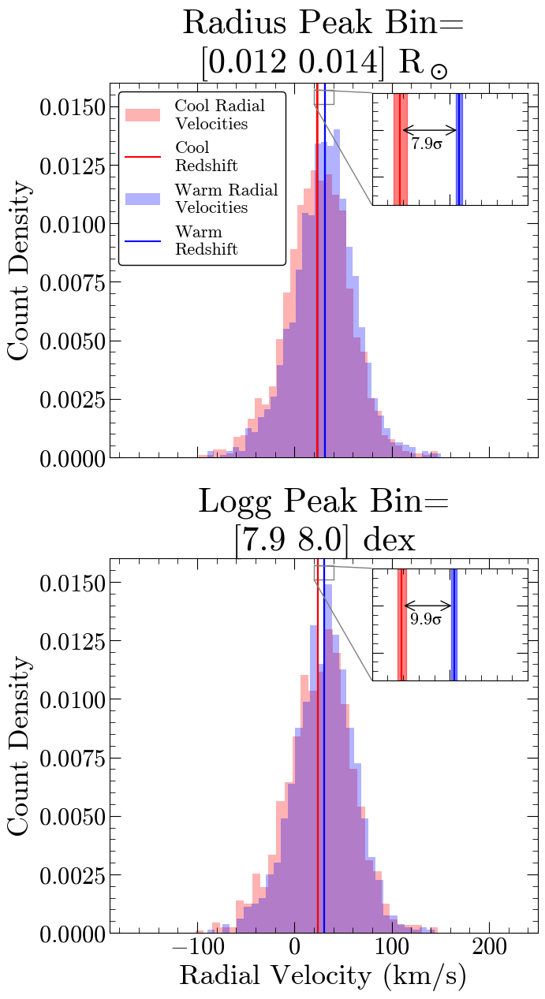

Radius
Cool peak=23.6 pm 0.9 km/s
Warm peak=31.2 pm 0.4 km/s

Logg
Cool peak=23.8 pm 0.6 km/s
Warm peak=30.5 pm 0.4 km/s
1


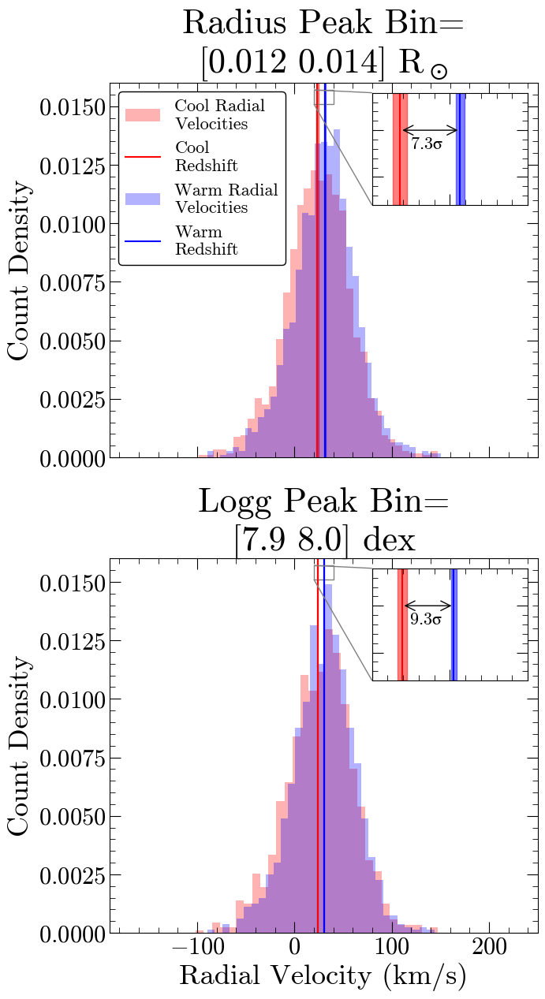

Radius
Cool peak=23.6 pm 0.9 km/s
Warm peak=31.3 pm 0.5 km/s

Logg
Cool peak=23.8 pm 0.6 km/s
Warm peak=30.5 pm 0.4 km/s
2


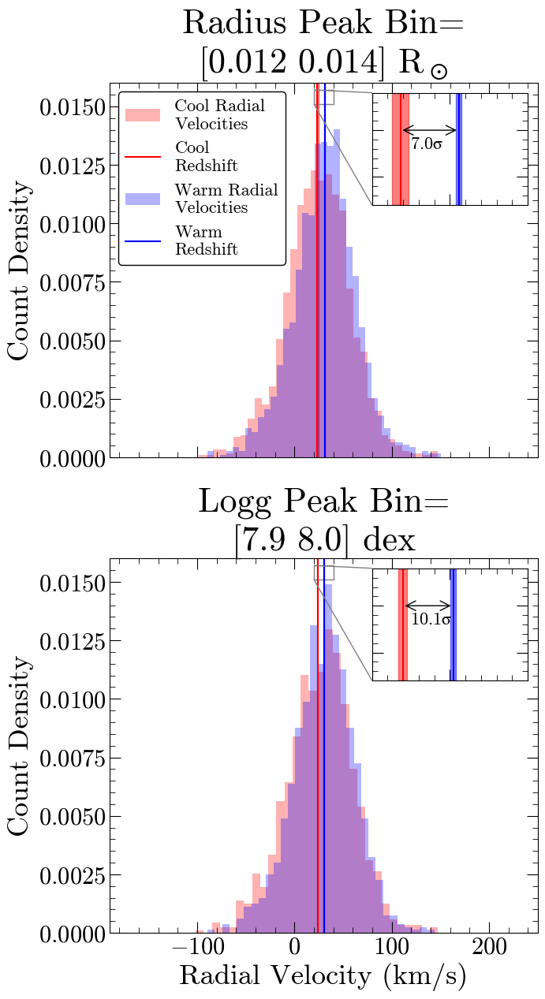

Radius
Cool peak=23.6 pm 1.0 km/s
Warm peak=31.2 pm 0.4 km/s

Logg
Cool peak=23.9 pm 0.5 km/s
Warm peak=30.4 pm 0.4 km/s
3


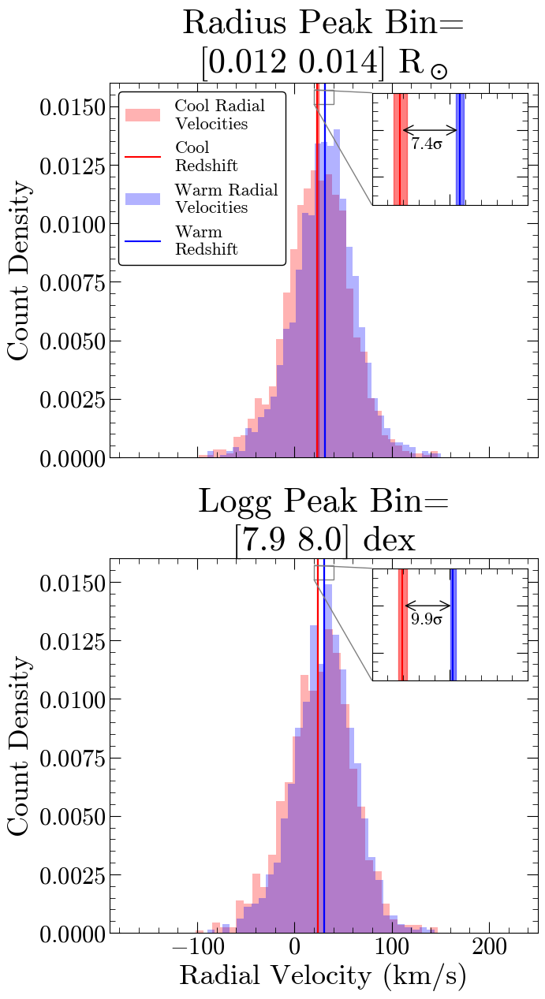

Radius
Cool peak=23.6 pm 0.9 km/s
Warm peak=31.3 pm 0.5 km/s

Logg
Cool peak=23.9 pm 0.6 km/s
Warm peak=30.4 pm 0.4 km/s
4


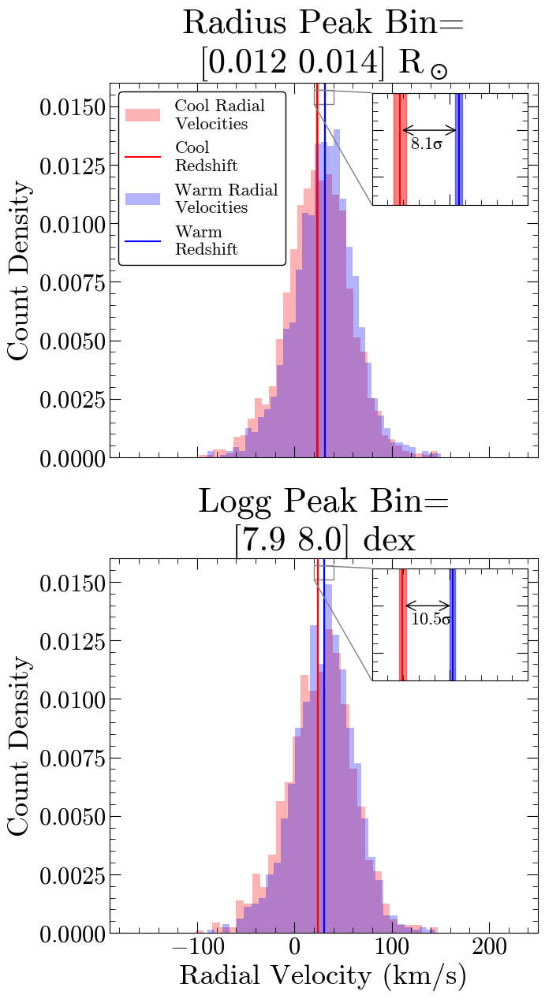

Radius
Cool peak=23.6 pm 0.8 km/s
Warm peak=31.1 pm 0.5 km/s

Logg
Cool peak=23.9 pm 0.5 km/s
Warm peak=30.3 pm 0.4 km/s
5


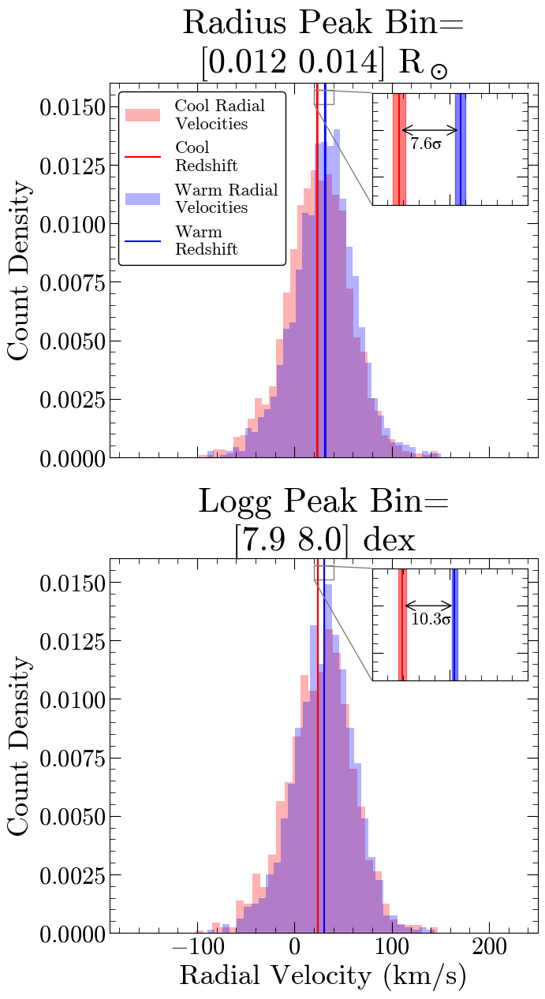

Radius
Cool peak=23.5 pm 0.8 km/s
Warm peak=31.3 pm 0.6 km/s

Logg
Cool peak=23.9 pm 0.5 km/s
Warm peak=30.6 pm 0.4 km/s
6


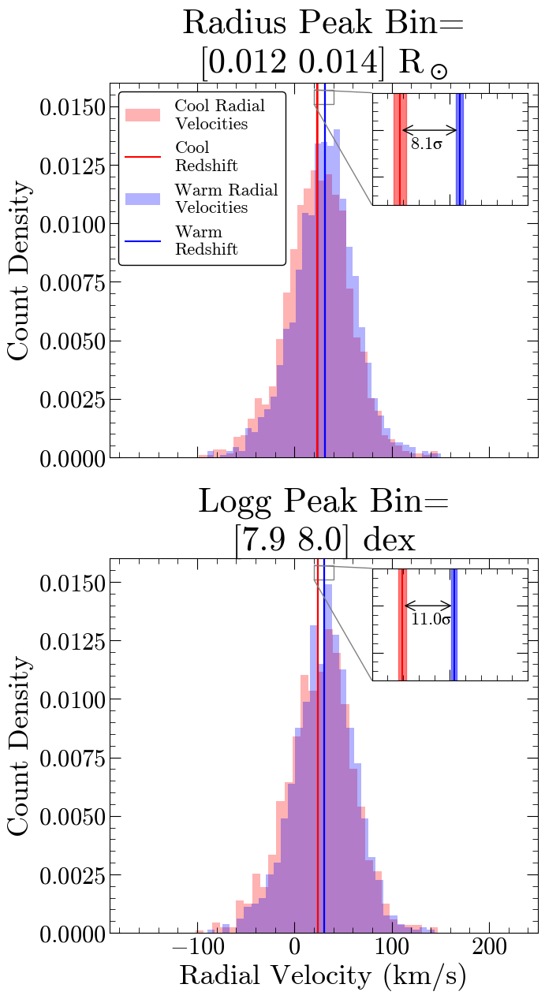

Radius
Cool peak=23.6 pm 0.8 km/s
Warm peak=31.2 pm 0.5 km/s

Logg
Cool peak=23.8 pm 0.5 km/s
Warm peak=30.5 pm 0.4 km/s
7


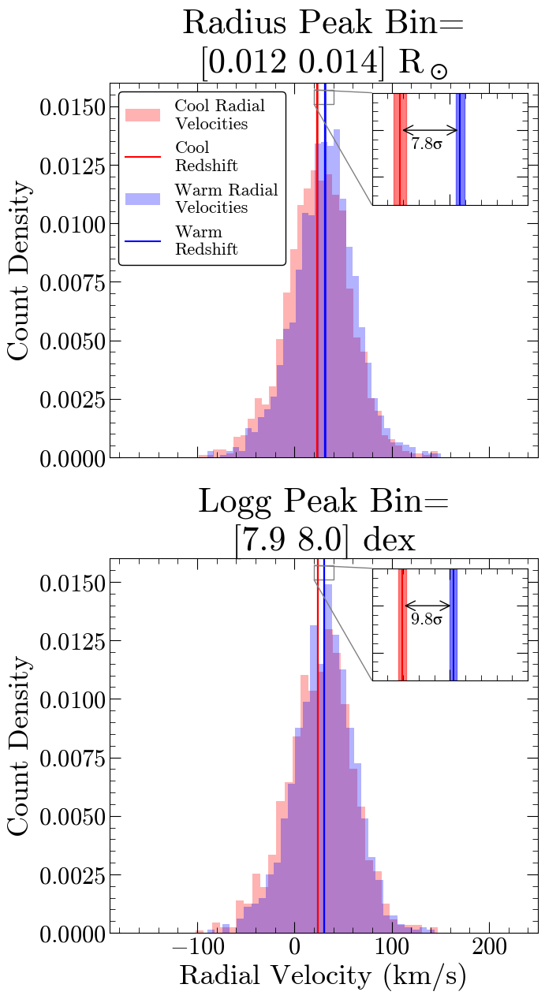

Radius
Cool peak=23.6 pm 0.8 km/s
Warm peak=31.3 pm 0.5 km/s

Logg
Cool peak=23.9 pm 0.5 km/s
Warm peak=30.4 pm 0.4 km/s
8


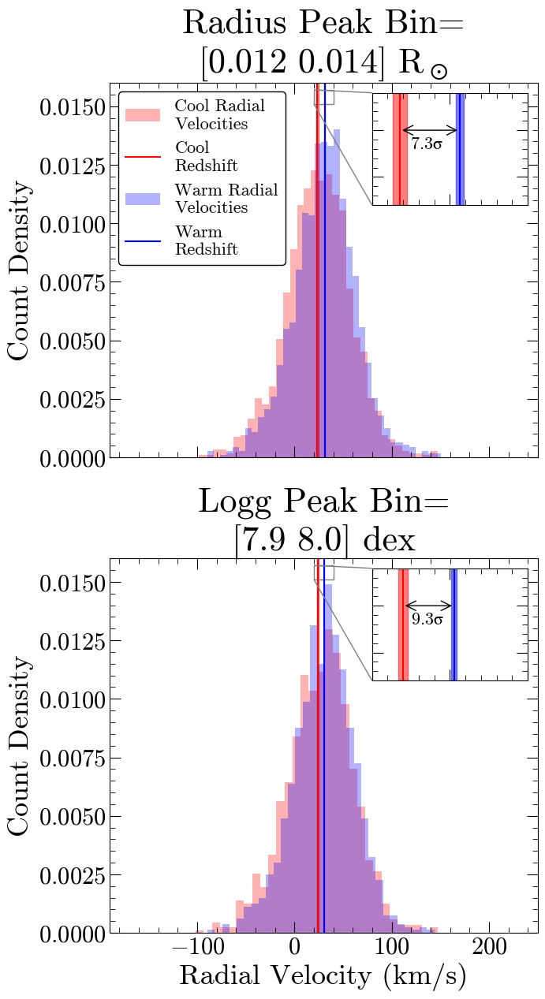

Radius
Cool peak=23.6 pm 0.9 km/s
Warm peak=31.3 pm 0.5 km/s

Logg
Cool peak=24.0 pm 0.6 km/s
Warm peak=30.5 pm 0.4 km/s
9


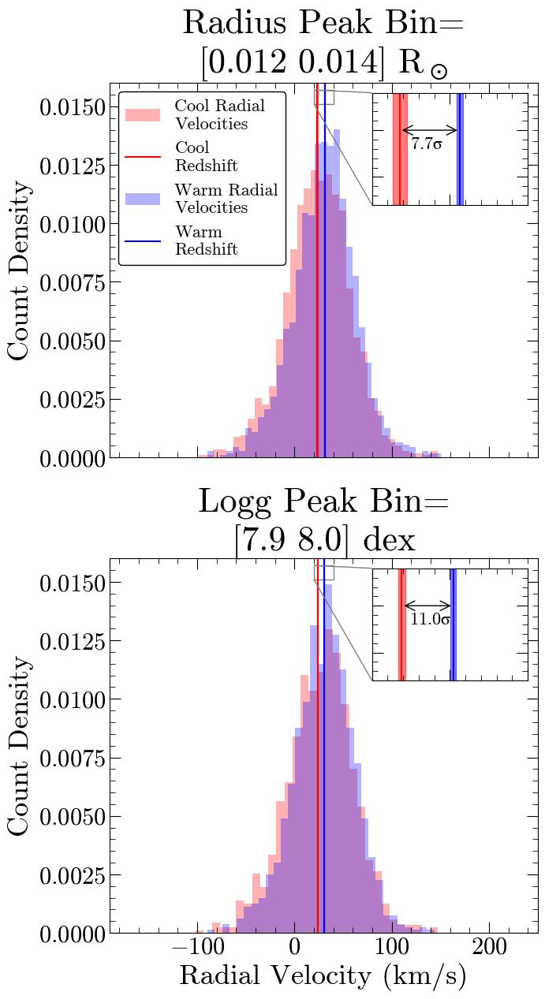

Radius
Cool peak=23.5 pm 0.9 km/s
Warm peak=31.2 pm 0.4 km/s

Logg
Cool peak=23.8 pm 0.5 km/s
Warm peak=30.4 pm 0.4 km/s


In [52]:
for run in runs:
    print(run)

    Teff_Eos_tab_rad_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Teff_Eos_tab_rad_avg.csv')
    Teff_Eos_tab_logg_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Teff_Eos_tab_logg_avg.csv')
    
    plot_peak_vg_teff_comparison(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,savefig=False)

0


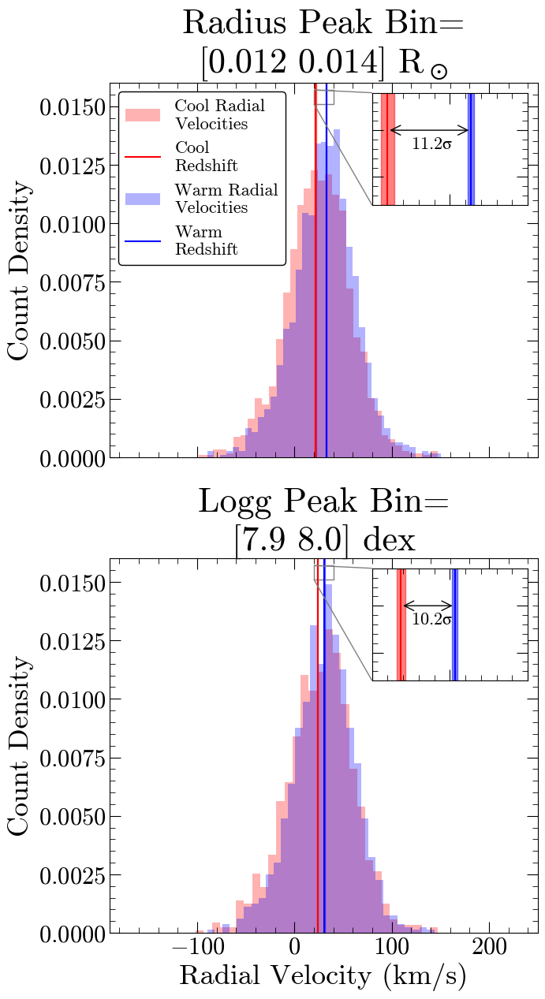

Radius
Cool peak=22.0 pm 0.9 km/s
Warm peak=32.7 pm 0.4 km/s

Logg
Cool peak=23.7 pm 0.6 km/s
Warm peak=30.6 pm 0.4 km/s
1


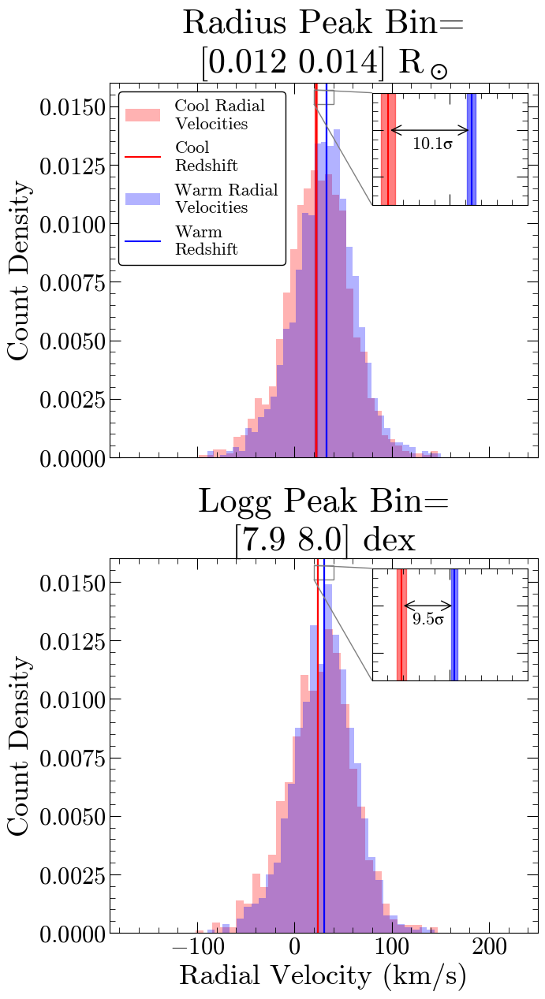

Radius
Cool peak=22.1 pm 0.9 km/s
Warm peak=32.8 pm 0.5 km/s

Logg
Cool peak=23.8 pm 0.6 km/s
Warm peak=30.6 pm 0.4 km/s
2


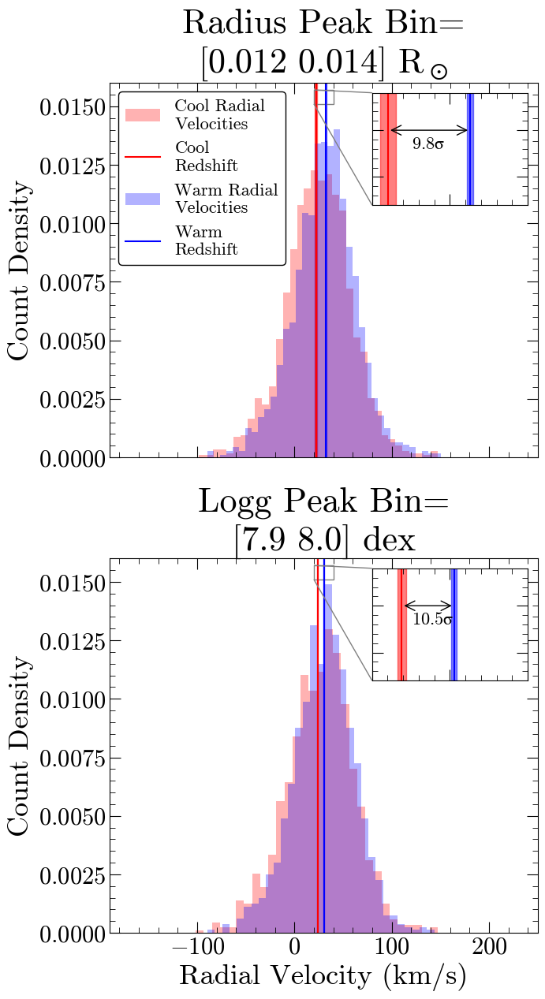

Radius
Cool peak=22.1 pm 1.0 km/s
Warm peak=32.6 pm 0.4 km/s

Logg
Cool peak=23.8 pm 0.5 km/s
Warm peak=30.5 pm 0.4 km/s
3


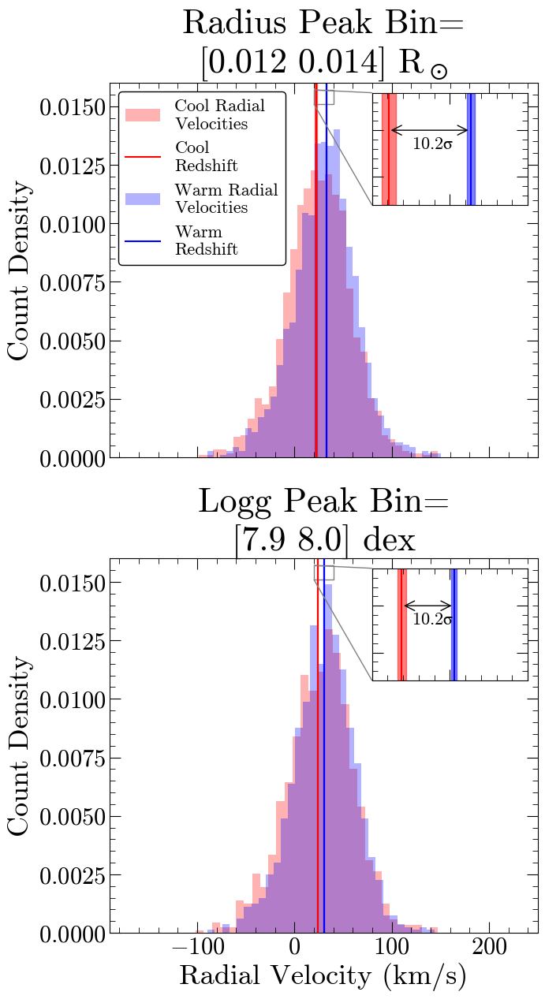

Radius
Cool peak=22.1 pm 0.9 km/s
Warm peak=32.7 pm 0.5 km/s

Logg
Cool peak=23.8 pm 0.6 km/s
Warm peak=30.5 pm 0.4 km/s
4


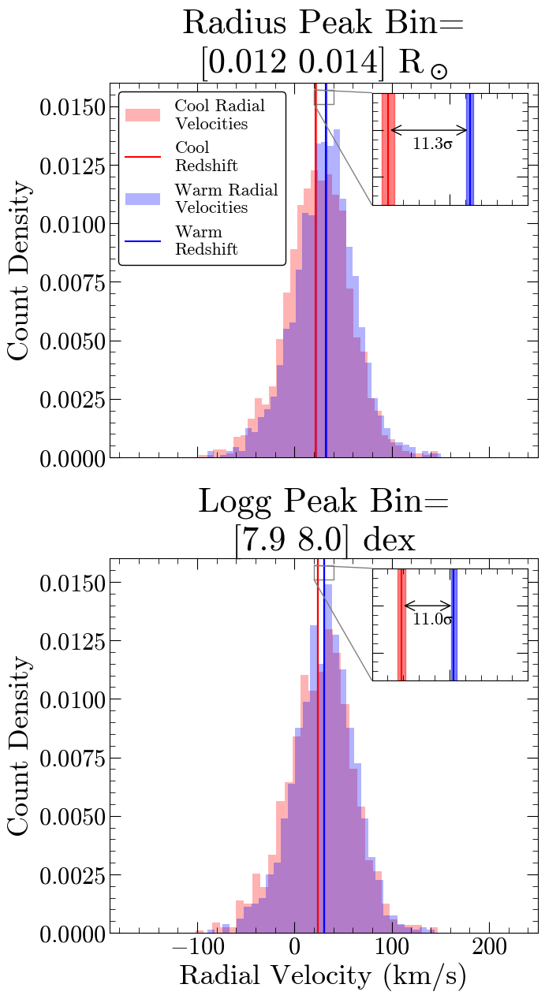

Radius
Cool peak=22.1 pm 0.8 km/s
Warm peak=32.6 pm 0.5 km/s

Logg
Cool peak=23.8 pm 0.5 km/s
Warm peak=30.5 pm 0.4 km/s
5


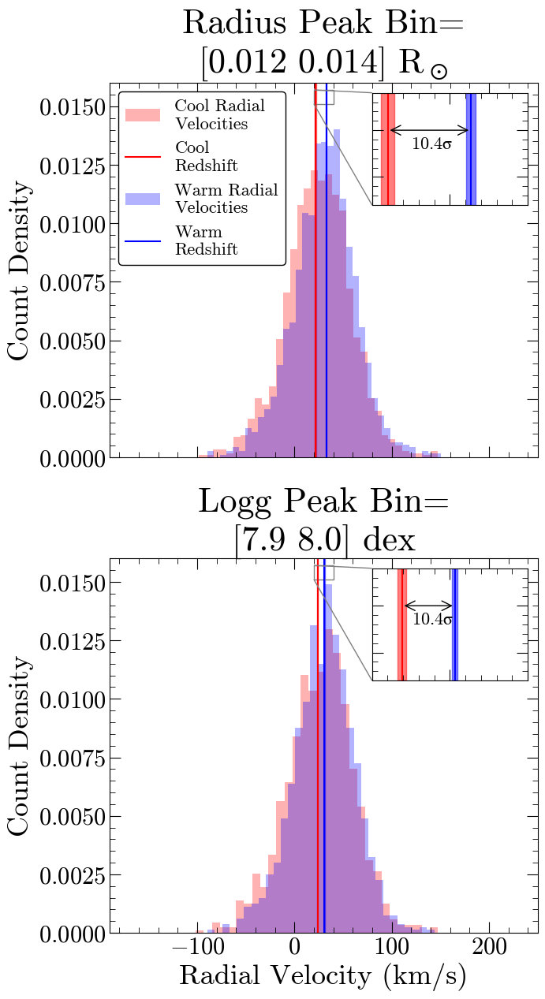

Radius
Cool peak=22.0 pm 0.8 km/s
Warm peak=32.7 pm 0.6 km/s

Logg
Cool peak=23.8 pm 0.5 km/s
Warm peak=30.6 pm 0.4 km/s
6


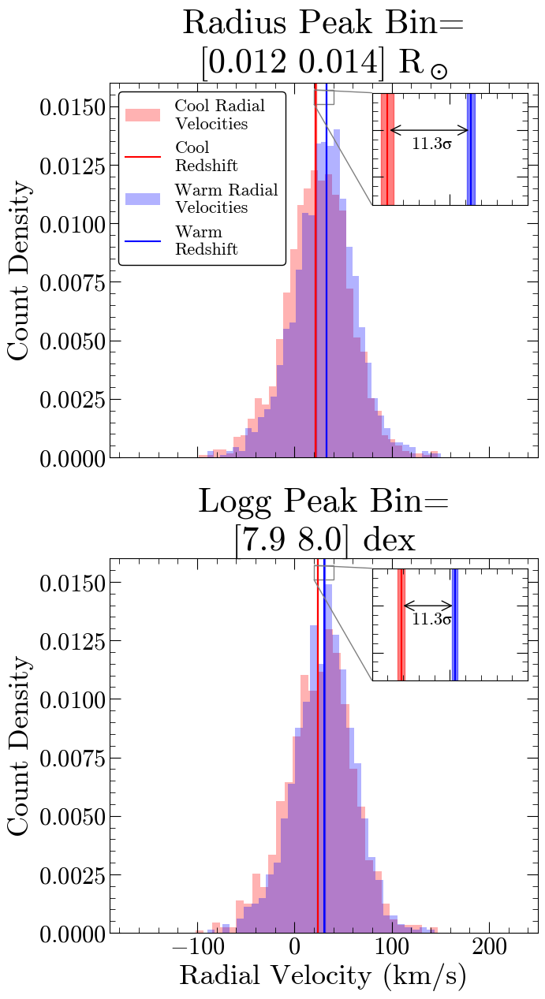

Radius
Cool peak=22.0 pm 0.8 km/s
Warm peak=32.7 pm 0.5 km/s

Logg
Cool peak=23.7 pm 0.5 km/s
Warm peak=30.6 pm 0.4 km/s
7


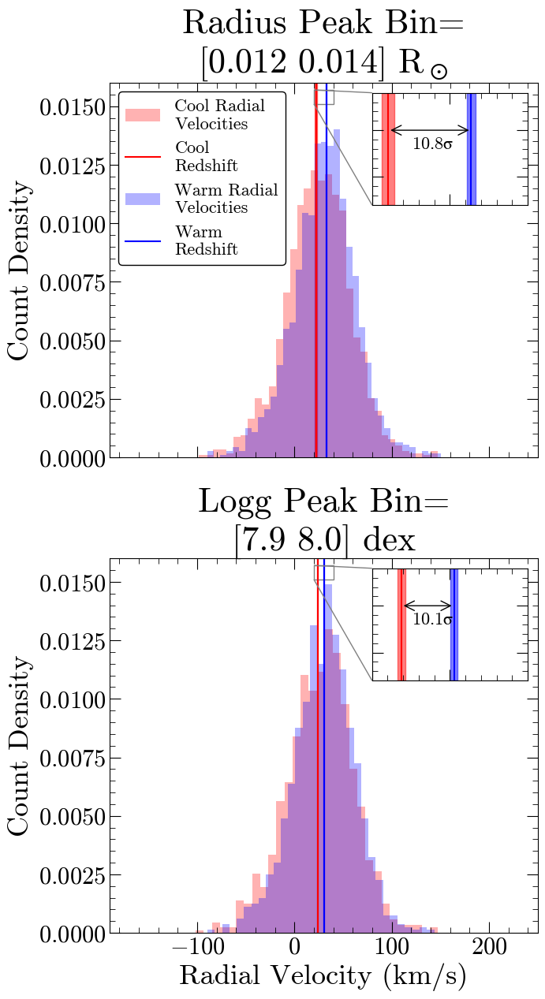

Radius
Cool peak=22.1 pm 0.8 km/s
Warm peak=32.7 pm 0.5 km/s

Logg
Cool peak=23.8 pm 0.5 km/s
Warm peak=30.5 pm 0.4 km/s
8


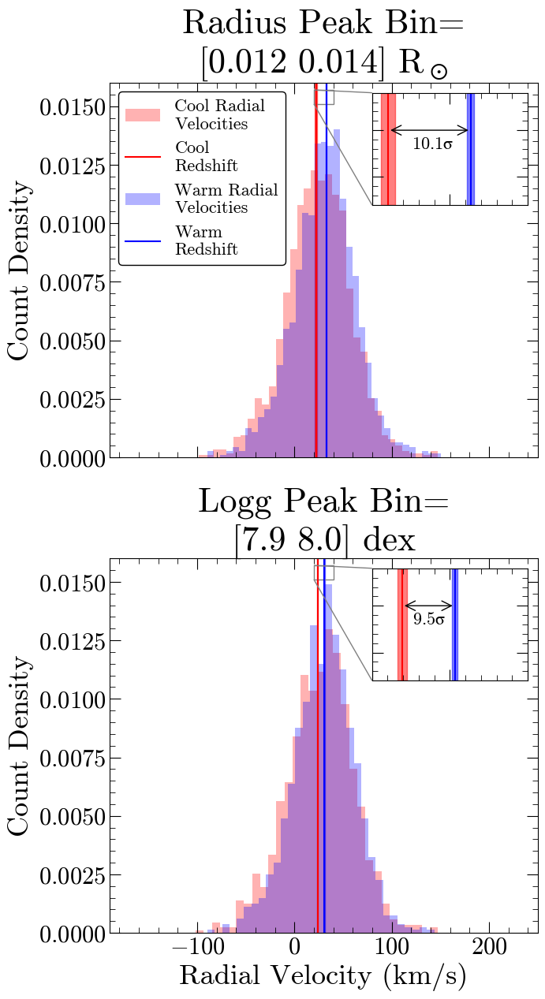

Radius
Cool peak=22.1 pm 0.9 km/s
Warm peak=32.7 pm 0.5 km/s

Logg
Cool peak=23.9 pm 0.6 km/s
Warm peak=30.6 pm 0.4 km/s
9


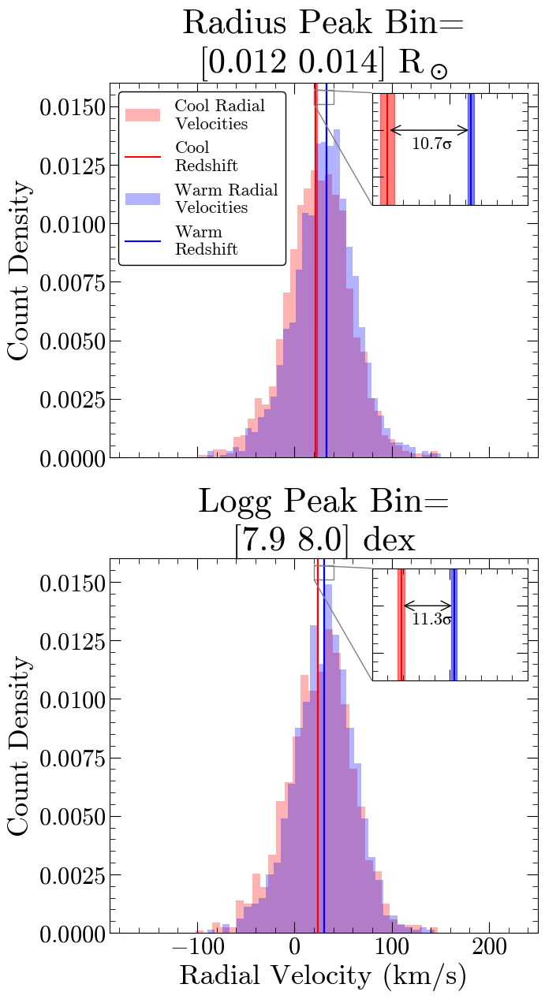

Radius
Cool peak=22.0 pm 0.9 km/s
Warm peak=32.7 pm 0.4 km/s

Logg
Cool peak=23.7 pm 0.5 km/s
Warm peak=30.5 pm 0.4 km/s


In [56]:
tscore_rads=[]
tscore_loggs=[]
for run in runs:
    print(run)

    Teff_Eos_tab_rad_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Teff_Eos_tab_rad_avg.csv')
    Teff_Eos_tab_logg_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Teff_Eos_tab_logg_avg.csv')
    
    tscore_rad,tscore_logg=corr_plot_peak_vg_teff_comparison(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,savefig=False)
    tscore_rads.append(tscore_rad)
    tscore_loggs.append(tscore_logg)
    

In [57]:
#take the median of the radius and logg detection significances
#choose the most representative sample to plot for the paper
print('Radius median tscore=',np.median(tscore_rads))
print('Logg median tscore=',np.median(tscore_loggs))


Radius median tscore= 10.514913448941275
Logg median tscore= 10.33549819662157


# For the paper, we will use the results from run5

This run has sigma significances in temperature dependence that are roughly in the middle of the full range of significances. So, it is a good representation of the typical behavior after bias corrections.

Save this run to the csv folder and to the backup folder

In [58]:
run=5

Eos_tab_rad_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Eos_tab_rad_avg.csv')
Eos_tab_logg_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Eos_tab_logg_avg.csv')

Teff_Eos_tab_rad_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Teff_Eos_tab_rad_avg.csv')
Teff_Eos_tab_logg_avg=pd.read_csv('csv/bias_correction_runs/run'+str(run)+'/Teff_Eos_tab_logg_avg.csv')


In [59]:
#save the tables

Eos_tab_rad_avg.to_csv('csv/Eos_tab_rad_avg.csv',index=False)
Eos_tab_logg_avg.to_csv('csv/Eos_tab_logg_avg.csv',index=False)
Teff_Eos_tab_rad_avg.to_csv('csv/Teff_Eos_tab_rad_avg.csv',index=False)
Teff_Eos_tab_logg_avg.to_csv('csv/Teff_Eos_tab_logg_avg.csv',index=False)

#save to backup

#Eos_tab_rad_avg.to_csv('csv/Eos_tab_rad_avg_nb08.csv',index=False)
#Eos_tab_logg_avg.to_csv('csv/Eos_tab_logg_avg_nb08.csv',index=False)
#Teff_Eos_tab_rad_avg.to_csv('csv/Teff_Eos_tab_rad_avg_nb08.csv',index=False)
#Teff_Eos_tab_logg_avg.to_csv('csv/Teff_Eos_tab_logg_avg_nb08.csv',index=False)


### Make and save final plots for the paper

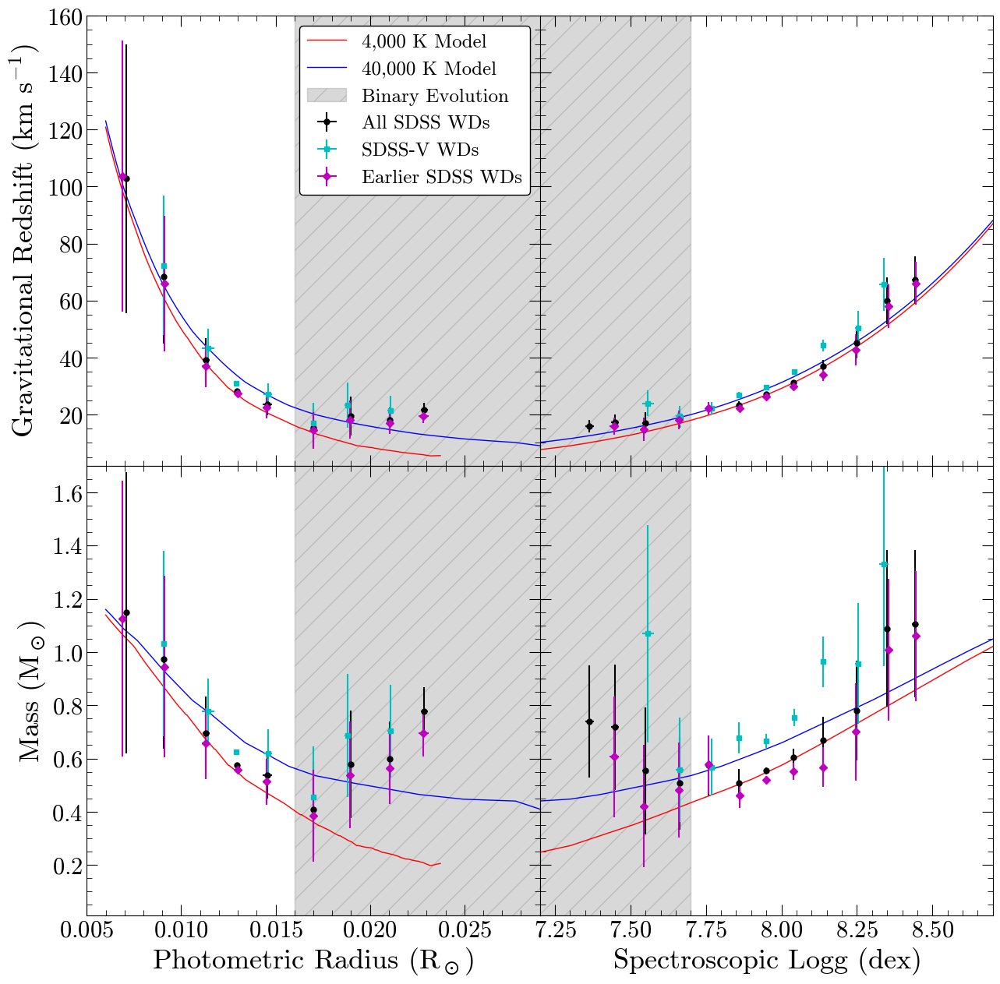

Radius
Measured Redshift=28.2 pm 0.3 km/s
Theory Redshift=29.6 ^30.6 _28.3 km/s

Logg
Measured Redshift=27.0 pm 0.3 km/s
Theory Redshift=27.6 ^27.9 _27.3 km/s


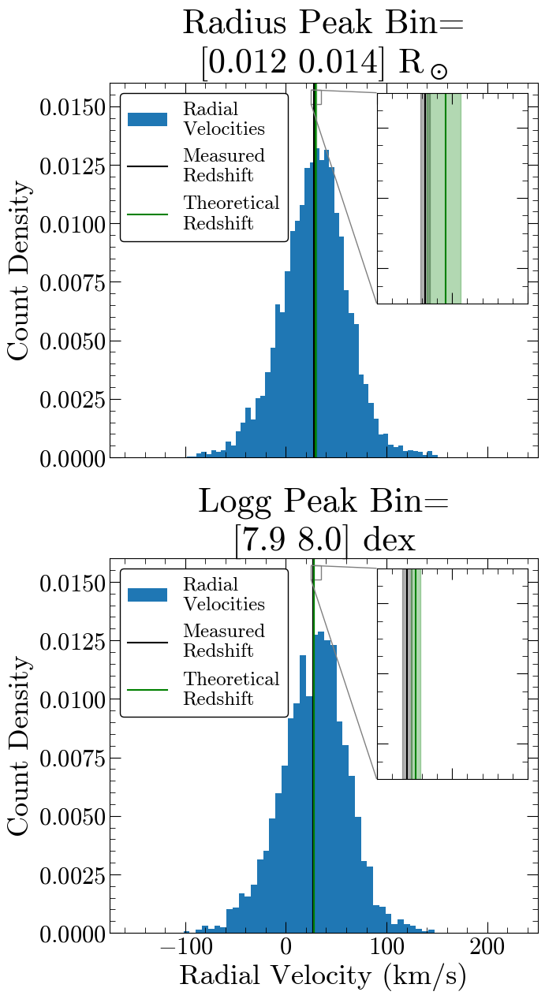

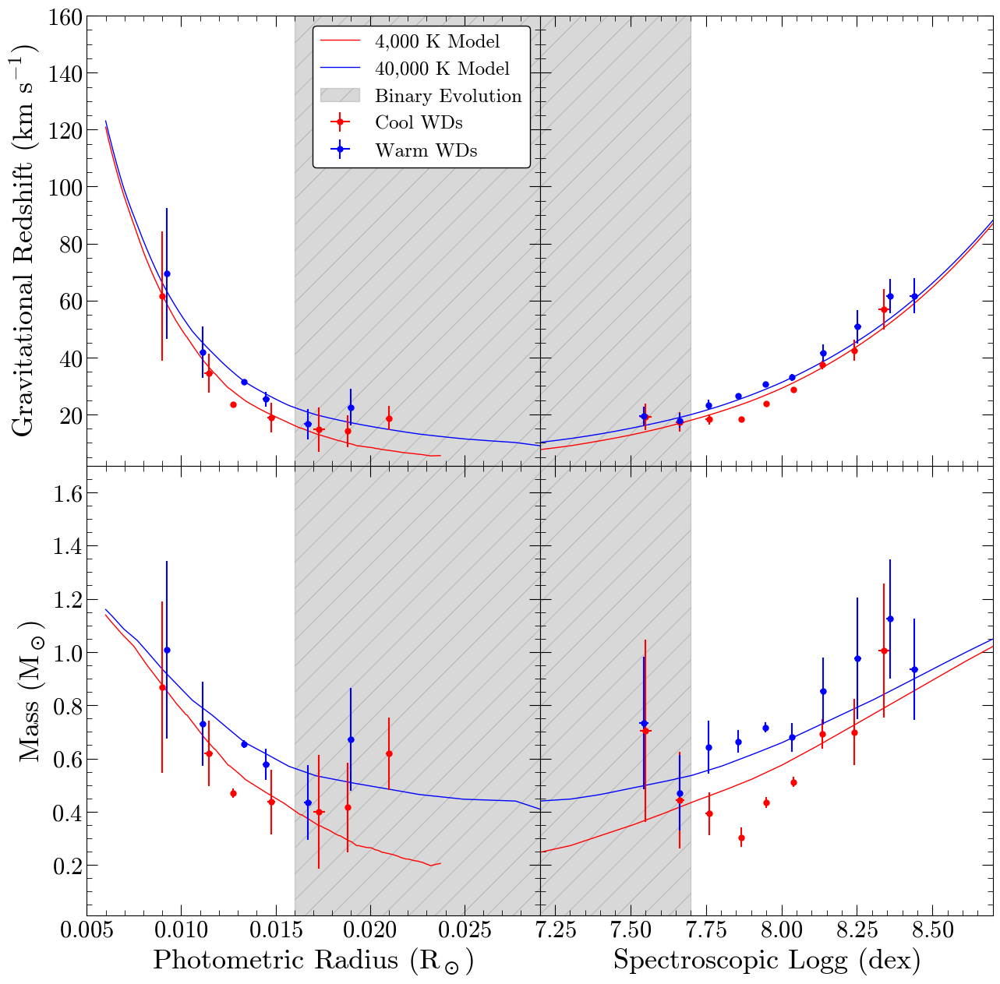

Radius
Cool peak=0.012 pm 2e-05 Rsun
Warm peak=0.013 pm 2e-05 Rsun

Logg
Cool peak=8.0 pm 0.002 dex
Warm peak=7.9 pm 0.002 dex


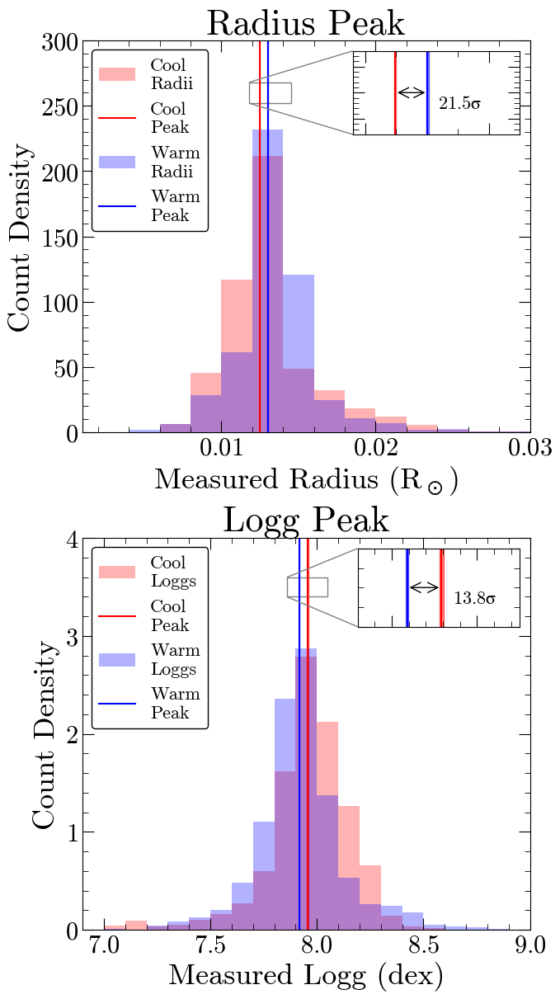

Radius
Cool peak=23.5 pm 0.8 km/s
Warm peak=31.3 pm 0.6 km/s

Logg
Cool peak=23.9 pm 0.5 km/s
Warm peak=30.6 pm 0.4 km/s


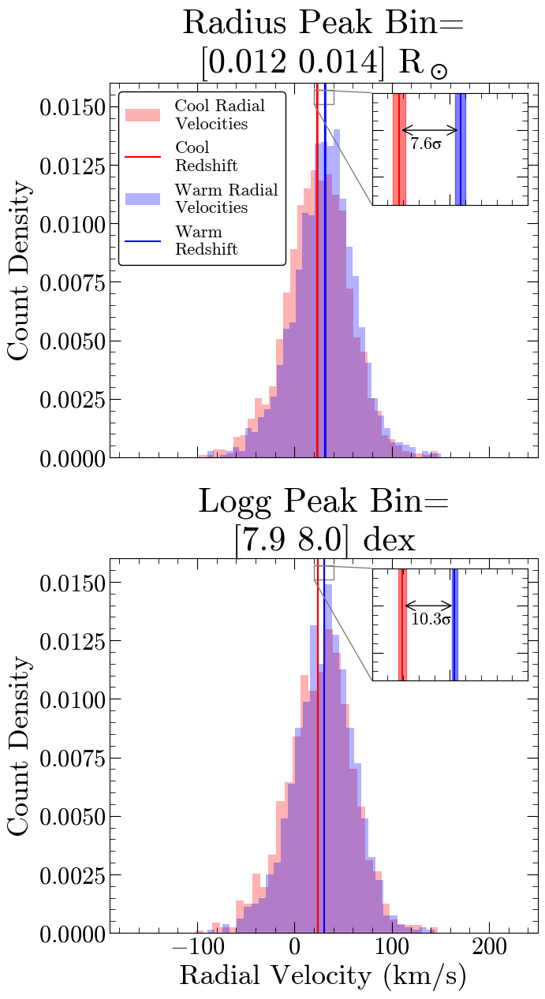

Radius
Cool peak=22.0 pm 0.8 km/s
Warm peak=32.7 pm 0.6 km/s

Logg
Cool peak=23.8 pm 0.5 km/s
Warm peak=30.6 pm 0.4 km/s


(10.36516406431587, 10.448555446044155)

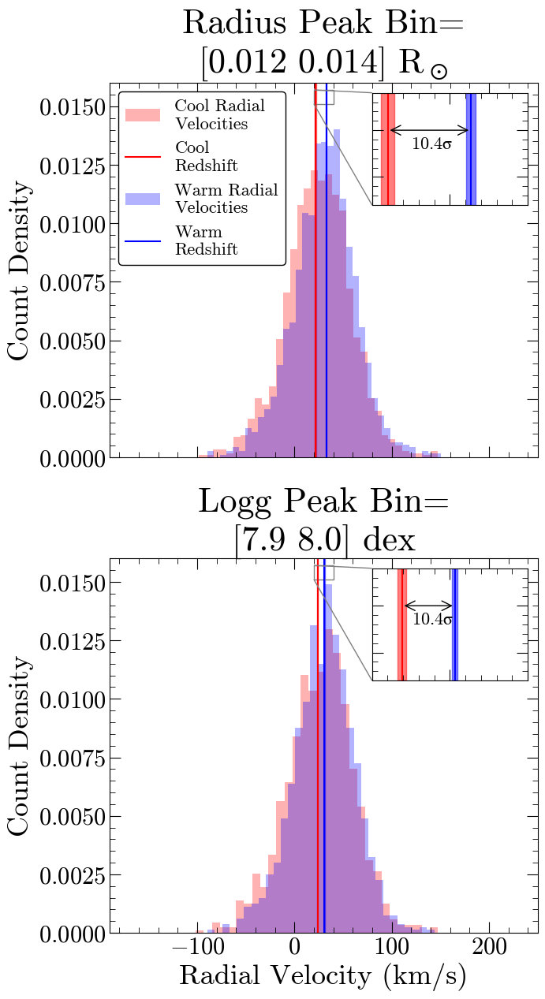

In [60]:
plot_eos(Eos_tab_rad_avg,Eos_tab_logg_avg,'debias',50,radlim=[0.005,0.025],logglim=[7.2,8.7],savefig=True)
plt.show()
plot_peak_comparison(Eos_tab_rad_avg,Eos_tab_logg_avg,savefig=True)
plt.show()
plot_teff_eos(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,'All','debias',50,radlim=[0.005,0.025],logglim=[7.2,8.7],title=False,savefig=True)
plt.show()
plot_peak_teff_comparison(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,savefig=True)
plt.show()
plot_peak_vg_teff_comparison(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,savefig=True)
plt.show()
corr_plot_peak_vg_teff_comparison(Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg,savefig=True)


In [61]:
binnum_rad,peak_rad_cool,e_peak_rad_cool,peak_vg_rad_cool,e_peak_vg_rad_cool,all_dat_tab_rad_cool,mean_teff_rad_cool,std_teff_rad_cool,peak_rad_warm,e_peak_rad_warm,peak_vg_rad_warm,e_peak_vg_rad_warm,all_dat_tab_rad_warm,mean_teff_rad_warm,std_teff_rad_warm=teff_get_peak_info('radius','cool',Teff_Eos_tab_rad_avg,Teff_Eos_tab_logg_avg)

print(peak_rad_cool,peak_rad_warm)

0.0127310539023459 0.0133158939473885


### Random things for the paper

In [62]:
table=Eos_tab
radius_noise_med=np.nanmedian(table['e_radius_phot_full'])
radius_noise_std=np.std(table['e_radius_phot_full'])
print(radius_noise_med,radius_noise_std)

print('')

logg_noise_med=np.nanmedian(table['e_logg_prf_coadd_full'])
logg_noise_std=np.std(table['e_logg_prf_coadd_full'])
print(logg_noise_med,logg_noise_std)


0.0014440591896352 0.001133948710847221

0.1240963178337184 0.03761637353812713


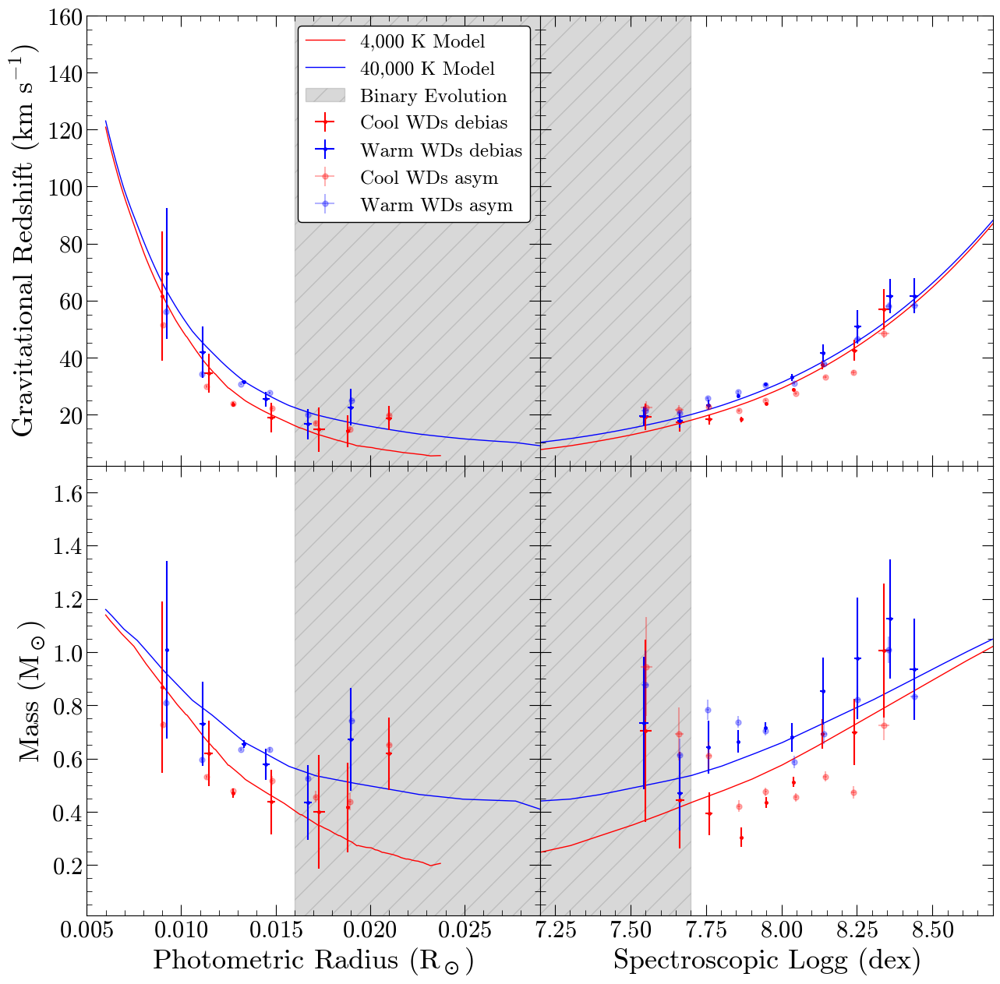

In [63]:
#asym vs debiased values for temeprature detection

table_phot=Teff_Eos_tab_rad_avg
table_spec=Teff_Eos_tab_logg_avg
SDSSType='All'
keys=['debias','asym']
num_obs_per_bin=50
radlim=[0.005,0.025]
logglim=[7.2,8.7]

fig, ((ax1,ax2),(ax4,ax5)) =plt.subplots(2,2,figsize=(15,15))
plt.style.use('stefan.mplstyle')

#get theoretical R-vg relation
theo_radii = np.linspace(0.006,0.04, 1000)
theo_vg_r_lowT = theo_vg_from_r_teff(theo_radii, 4000)
theo_vg_r_highT = theo_vg_from_r_teff(theo_radii, 40000)
#plot theoretical R-vg relation
ax1.plot(theo_radii, theo_vg_r_lowT, 'red', linestyle = '-', label = '4,000 K Model', linewidth = 1)
ax1.plot(theo_radii, theo_vg_r_highT, 'blue', label = '40,000 K Model', linewidth = 1)
#exclude Binary Evolution
ax1.axvspan(0.016, 0.045, hatch ='/', color = 'grey', alpha = 0.3,label='Binary Evolution')
ax1.legend()
#ax1.set_xlabel('Photometric Radius ($R_\odot$)')
ax1.set_ylabel('Gravitational Redshift ($km$ $s^{-1}$)')
if radlim!=None:
    ax1.set_xlim(radlim[0],radlim[1])

#get theoretical logg-vg relation
theo_loggs = np.linspace(7,9, 1000)
theo_vg_logg_lowT = theo_vg_from_logg_teff(theo_loggs, 4000)
theo_vg_logg_highT = theo_vg_from_logg_teff(theo_loggs, 40000)
#plot theoretical logg-vg relation
ax2.plot(theo_loggs, theo_vg_logg_lowT, 'red', linestyle = '-', label = '4,000 K Model', linewidth = 1)
ax2.plot(theo_loggs, theo_vg_logg_highT, 'blue', label = '40,000 K Model', linewidth = 1)
#exclude Binary Evolution
ax2.axvspan(6.9, 7.7, hatch ='/', color = 'grey', alpha = 0.3,label='Binary Evolution')
#ax2.set_xlabel('Spectroscopic Logg ($dex$)')
#ax2.set_ylabel('Gravitational Redshift ($km$ $s^{-1}$)')
if logglim!=None:
    ax2.set_xlim(logglim[0],logglim[1])
    
#plot theoretical M-R relation
ax4.plot(theo_radii, theo_m_from_vg_r(theo_vg_r_lowT, theo_radii), 'red', linestyle = '-', label = '4,000 K Model', linewidth = 1)
ax4.plot(theo_radii, theo_m_from_vg_r(theo_vg_r_highT, theo_radii), 'blue', label = '40,000 K Model', linewidth = 1)
#exclude Binary Evolution
ax4.axvspan(0.016, 0.045, hatch ='/', color = 'grey', alpha = 0.3,label='Binary Evolution')
ax4.set_xlabel('Photometric Radius ($R_\odot$)')
ax4.set_ylabel('Mass ($M_\odot$)')
if radlim!=None:
    ax4.set_xlim(radlim[0],radlim[1])
    
#plot theoretical M-logg relation
ax5.plot(theo_loggs, theo_m_from_vg_logg(theo_vg_logg_lowT, theo_loggs), 'red', linestyle = '-', label = '4,000 K Model', linewidth = 1)
ax5.plot(theo_loggs, theo_m_from_vg_logg(theo_vg_logg_highT, theo_loggs), 'blue', label = '40,000 K Model', linewidth = 1)

#exclude Binary Evolution
ax5.axvspan(6.9, 7.7, hatch ='/', color = 'grey', alpha = 0.3,label='Binary Evolution')
ax5.set_xlabel('Spectroscopic Logg ($dex$)')
#ax5.set_ylabel('Spectroscopic Mass ($M_\odot$)')
if logglim!=None:
    ax5.set_xlim(logglim[0],logglim[1])


for key in keys:
    if key=='asym':
        fmt_str='o'
        alpha_val=0.3
    if key=='debias':
        fmt_str='.'
        alpha_val=1
    #crop all the tables to have only bins with num_obs_per_bin>threshold
    table_phot_cool=table_phot.query('num_obs_per_bin_cool_'+SDSSType+'_'+key+'>@num_obs_per_bin')
    table_phot_warm=table_phot.query('num_obs_per_bin_warm_'+SDSSType+'_'+key+'>@num_obs_per_bin')
    
    table_spec_cool=table_spec.query('num_obs_per_bin_cool_'+SDSSType+'_'+key+'>@num_obs_per_bin')
    table_spec_warm=table_spec.query('num_obs_per_bin_warm_'+SDSSType+'_'+key+'>@num_obs_per_bin')
    
    tables=[table_phot_cool,table_phot_warm,table_spec_cool,table_spec_warm]
    for table in tables:
        #reset the indices
        indices=np.arange(0,len(table))
        table.set_index(indices,inplace=True)
    #plot data
    ax1.errorbar(table_phot_cool['mean_radii_cool_'+SDSSType+'_'+key],table_phot_cool['mean_RVs_cool_'+SDSSType+'_'+key],
                 xerr=table_phot_cool['e_mean_radii_cool_'+SDSSType+'_'+key],yerr=table_phot_cool['e_mean_RVs_cool_'+SDSSType+'_'+key],alpha=alpha_val,fmt='r'+fmt_str,label='Cool WDs '+key)
    ax1.errorbar(table_phot_warm['mean_radii_warm_'+SDSSType+'_'+key],table_phot_warm['mean_RVs_warm_'+SDSSType+'_'+key],
                 xerr=table_phot_warm['e_mean_radii_warm_'+SDSSType+'_'+key],yerr=table_phot_warm['e_mean_RVs_warm_'+SDSSType+'_'+key],alpha=alpha_val,fmt='b'+fmt_str,label='Warm WDs '+key)
    #plot data
    ax2.errorbar(table_spec_cool['mean_loggs_cool_'+SDSSType+'_'+key],table_spec_cool['mean_RVs_cool_'+SDSSType+'_'+key],
                 xerr=table_spec_cool['e_mean_loggs_cool_'+SDSSType+'_'+key],yerr=table_spec_cool['e_mean_RVs_cool_'+SDSSType+'_'+key],alpha=alpha_val,fmt='r'+fmt_str,label='Cool WDs '+key)
    ax2.errorbar(table_spec_warm['mean_loggs_warm_'+SDSSType+'_'+key],table_spec_warm['mean_RVs_warm_'+SDSSType+'_'+key],
                 xerr=table_spec_warm['e_mean_loggs_warm_'+SDSSType+'_'+key],yerr=table_spec_warm['e_mean_RVs_warm_'+SDSSType+'_'+key],alpha=alpha_val,fmt='b'+fmt_str,label='Warm WDs '+key)
    #plot data
    ax4.errorbar(table_phot_cool['mean_radii_cool_'+SDSSType+'_'+key],table_phot_cool['mass_cool_'+SDSSType+'_'+key],
                 xerr=table_phot_cool['e_mean_radii_cool_'+SDSSType+'_'+key],yerr=table_phot_cool['e_mass_cool_'+SDSSType+'_'+key],alpha=alpha_val,fmt='r'+fmt_str,label='Cool WDs '+key)
    ax4.errorbar(table_phot_warm['mean_radii_warm_'+SDSSType+'_'+key],table_phot_warm['mass_warm_'+SDSSType+'_'+key],
                 xerr=table_phot_warm['e_mean_radii_warm_'+SDSSType+'_'+key],yerr=table_phot_warm['e_mass_warm_'+SDSSType+'_'+key],alpha=alpha_val,fmt='b'+fmt_str,label='Warm WDs '+key)
    #plot data
    ax5.errorbar(table_spec_cool['mean_loggs_cool_'+SDSSType+'_'+key],table_spec_cool['mass_cool_'+SDSSType+'_'+key],
                 xerr=table_spec_cool['e_mean_loggs_cool_'+SDSSType+'_'+key],yerr=table_spec_cool['e_mass_cool_'+SDSSType+'_'+key],alpha=alpha_val,fmt='r'+fmt_str,label='Cool WDs '+key)
    ax5.errorbar(table_spec_warm['mean_loggs_warm_'+SDSSType+'_'+key],table_spec_warm['mass_warm_'+SDSSType+'_'+key],
                 xerr=table_spec_warm['e_mean_loggs_warm_'+SDSSType+'_'+key],yerr=table_spec_warm['e_mass_warm_'+SDSSType+'_'+key],alpha=alpha_val,fmt='b'+fmt_str,label='Warm WDs '+key)

ax1.legend()

#make x limits consistent
ax1.set_xlim(0.005,0.029)
ax4.set_xlim(0.005,0.029)
ax2.set_xlim(7.2,8.7)
ax5.set_xlim(7.2,8.7)
#make y limits consistent
ax1.set_ylim(2,160)
ax2.set_ylim(2,160)
ax4.set_ylim(0.01,1.7)
ax5.set_ylim(0.01,1.7)
#hide tick labels
ax2.yaxis.set_ticklabels([])
ax5.yaxis.set_ticklabels([])
ax1.xaxis.set_ticklabels([])
ax2.xaxis.set_ticklabels([])

plt.subplots_adjust(wspace = 0,hspace=0)


In [64]:
#size of bias corrections from radius vs surface gravity
SDSSType='All'

print(np.nanmedian(table_phot_cool['mass_cool_'+SDSSType+'_debias']-table_phot_cool['mass_cool_'+SDSSType+'_asym']))
print(np.nanmedian(table_phot_warm['mass_warm_'+SDSSType+'_debias']-table_phot_warm['mass_cool_'+SDSSType+'_asym']))

print(np.nanmedian(table_spec_cool['mass_cool_'+SDSSType+'_debias']-table_spec_cool['mass_cool_'+SDSSType+'_asym']))
print(np.nanmedian(table_spec_warm['mass_warm_'+SDSSType+'_debias']-table_spec_warm['mass_cool_'+SDSSType+'_asym']))
                 

-0.021412461726003917
0.18824682040718993
-0.040280535330618594
0.2333019929873569


In [65]:
table_spec_cool['mass_cool_'+SDSSType+'_debias']

0    0.704080
1    0.442324
2    0.392379
3    0.304020
4    0.434556
5    0.511314
6    0.693605
7    0.699406
8    1.005178
Name: mass_cool_All_debias, dtype: float64

In [66]:
table_spec_cool['mass_cool_'+SDSSType+'_asym']

0    0.945365
1    0.691738
2    0.611721
3    0.421188
4    0.474836
5    0.454503
6    0.532712
7    0.472482
8    0.724324
Name: mass_cool_All_asym, dtype: float64

In [67]:
def data_m_from_logg_theory(loggs,teffs,e_loggs,e_teffs):
    #compute the mass and error on the mass in solar units
    #given measured logg and teff
    masses=[]
    e_masses=[]
    for i in range(len(loggs)):
        #get the logg/teff and their mins and maxes
        logg=loggs[i]
        e_logg=e_loggs[i]
        teff=teffs[i]
        e_teff=e_teffs[i]
        logg_min=logg-e_logg
        logg_max=logg+e_logg
        teff=teffs[i]
        teff_min=teff-e_teff
        teff_max=teff+e_teff
        #calculate the mass and all possible masses
        M=mass_from_logg_teff(logg,teff)
        E_M_array=mass_from_logg_teff([logg_min,logg_min,logg_max,logg_max],[teff_min,teff_max,teff_min,teff_max])
        E_M=max(E_M_array)-min(E_M_array)
        masses.append(M.item())
        e_masses.append(E_M.item())
    return(masses,e_masses)

def data_m_from_rad_theory(radii,teffs,e_radii,e_teffs):
    #compute the mass and error on the mass in solar units
    #given measured radius and teff
    masses=[]
    e_masses=[]
    for i in range(len(radii)):
        #get the logg/teff and their mins and maxes
        rad=radii[i]
        e_rad=e_radii[i]
        teff=teffs[i]
        e_teff=e_teffs[i]
        rad_min=rad-e_rad
        rad_max=rad+e_rad
        teff=teffs[i]
        teff_min=teff-e_teff
        teff_max=teff+e_teff
        #calculate the mass and all possible masses
        M=mass_from_radius_teff(rad,teff)
        E_M_array=mass_from_radius_teff([rad_min,rad_min,rad_max,rad_max],[teff_min,teff_max,teff_min,teff_max])
        E_M=max(E_M_array)-min(E_M_array)
        masses.append(M.item())
        e_masses.append(E_M.item())
    return(masses,e_masses)

In [68]:
#uncertainty due to 0.002 Rsun error vs 0.1 dex error
masses1,e_masses1=data_m_from_logg_theory([7.95],[20000],[0.1],[0])
masses2,e_masses2=data_m_from_rad_theory([0.0125],[20000],[0.002],[0])

print(masses1,e_masses1)
print(masses2,e_masses2)

[0.5926511483391328] [0.0995503827797114]
[0.6486563211149774] [0.2377097448426042]
